## Hospital Beds - Data Cleaning & EDA

___
### Packages

In [3]:
import sys
from pathlib import Path
import re

import missingno as msno
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore


### Set Up Pathing

In [4]:
HOME = Path.cwd()
PROJECT_HOME = HOME.parent
sys.path.insert(1, str(PROJECT_HOME))

### Import ```.py``` Modules

In [5]:
import utils

### Pamameters

In [6]:
DATA_FOLDER = PROJECT_HOME / "survey_data" / "CSV"
DATA_FILE = "response_data.csv"

column_missing_threshold = 1.00 # Used to find empty columns

## Load Data

In [7]:
df = pd.read_csv(str(DATA_FOLDER / DATA_FILE))
df

,Respondent ID,Collector ID,Start Date,End Date,IP Address,Email Address,First Name,Last Name,Custom Data 1,Respondent Contact Information:,...,"Of those patients reported in question 11, how many are awaiting beds/placements in the following settings?",Unnamed: 152,Unnamed: 153,Unnamed: 154,Unnamed: 155,Unnamed: 156,Unnamed: 157,What are the biggest factors affecting boarding patients in your emergency department? (Please describe),Unnamed: 159,Unnamed: 160
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Name:,...,Inpatient bed for medical management (Interhos...,Inpatient bed for medical management (Intrahos...,Detox/SUD/OUD Tx facility,Inpatient psychiatric,LTC/SNF,Behavioral Health Home/PNMI/IDD Facility,Other,Factor 1:,Factor 2:,Factor 3:
1,1.186852e+11,457316537.0,09/05/2024 07:26:18 AM,09/05/2024 08:12:47 AM,63.165.188.241,NaN,NaN,NaN,NaN,Sue Parent Dorson,...,NaN,NaN,NaN,1,2,NaN,NaN,psych beds,PNMI,LTC/Res Care beds
2,1.186851e+11,457316537.0,09/05/2024 04:29:01 AM,09/05/2024 04:29:38 AM,63.165.188.241,NaN,NaN,NaN,NaN,Janelynn Deprey,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.186843e+11,457316537.0,09/04/2024 06:46:40 AM,09/04/2024 08:21:38 AM,63.165.188.241,NaN,NaN,NaN,NaN,Sue Parent Dorson,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.186833e+11,457316537.0,09/03/2024 03:36:40 AM,09/03/2024 03:42:37 AM,192.219.255.13,NaN,NaN,NaN,NaN,NaN,...,0,5,0,1,1,0,0,Community Psychiatric Resources,"Community elderly care , SNF,LTC",Hospital bed capacity
5,1.186830e+11,457316537.0,09/02/2024 01:50:09 PM,09/02/2024 01:55:28 PM,192.219.255.13,NaN,NaN,NaN,NaN,Jessica Taylor,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1.186805e+11,457316537.0,08/27/2024 06:10:38 AM,08/30/2024 10:09:27 AM,198.160.5.14,NaN,NaN,NaN,NaN,Kimberly Moreau,...,17,0,0,2,1,1,0,"Increased inpatient length of stay, average ab...",Lack of facilities for geriatric neurocog pati...,Not enough pediatric residential facilities in...
7,1.186814e+11,457316537.0,08/30/2024 07:01:32 AM,08/30/2024 07:55:49 AM,63.247.53.27,NaN,NaN,NaN,NaN,Karl Buckley,...,0,0,0,0,0,0,0,n/a,NaN,NaN
8,1.186813e+11,457316537.0,08/30/2024 05:58:10 AM,08/30/2024 06:17:07 AM,198.160.5.14,NaN,NaN,NaN,NaN,Kimberly Moreau,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1.186802e+11,457316537.0,08/28/2024 11:28:25 PM,08/28/2024 11:38:51 PM,73.16.24.7,NaN,NaN,NaN,NaN,John Alexander,...,NaN,NaN,NaN,2,NaN,NaN,NaN,Hospital inpatient beds,Psych hospital beds,NaN


## Data Cleaning

In [8]:
# elimnate metadata columns
metadata_df = df.iloc[:, :15]
feature_df = df.iloc[:, 14:]
feature_df

,Is your facility designated a Critical Access Hospital?,Total number of patients awaiting discharge to the following settings:,Unnamed: 16,Unnamed: 17,Unnamed: 18,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision?",Unnamed: 20,Unnamed: 21,Unnamed: 22,"Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)?",...,"Of those patients reported in question 11, how many are awaiting beds/placements in the following settings?",Unnamed: 152,Unnamed: 153,Unnamed: 154,Unnamed: 155,Unnamed: 156,Unnamed: 157,What are the biggest factors affecting boarding patients in your emergency department? (Please describe),Unnamed: 159,Unnamed: 160
0,Response,Skilled Nursing Facility (SNF):,Long Term Care Hospital (LTC):,Residential Care Facility (RCF):,Home Health:,Skilled Nursing Facility (SNF):,Long Term Care Hospital (LTC):,Residential Care Facility (RCF):,Home Health:,Skilled Nursing Facility (SNF):,...,Inpatient bed for medical management (Interhos...,Inpatient bed for medical management (Intrahos...,Detox/SUD/OUD Tx facility,Inpatient psychiatric,LTC/SNF,Behavioral Health Home/PNMI/IDD Facility,Other,Factor 1:,Factor 2:,Factor 3:
1,No,15,0,7,0,1,0,0,0,0,...,NaN,NaN,NaN,1,2,NaN,NaN,psych beds,PNMI,LTC/Res Care beds
2,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,No,4,8,6,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,5,0,1,1,0,0,Community Psychiatric Resources,"Community elderly care , SNF,LTC",Hospital bed capacity
5,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,No,17,21,2,27,1,2,0,0,0,...,17,0,0,2,1,1,0,"Increased inpatient length of stay, average ab...",Lack of facilities for geriatric neurocog pati...,Not enough pediatric residential facilities in...
7,No,0,0,12,0,0,0,2,0,0,...,0,0,0,0,0,0,0,n/a,NaN,NaN
8,No,0,22,1,0,0,2,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,No,3,3,1,5,2,1,0,0,NaN,...,NaN,NaN,NaN,2,NaN,NaN,NaN,Hospital inpatient beds,Psych hospital beds,NaN


### Create a MultiIndex for Column Names:

In [9]:
def process_dataframe_to_multiindex(df):

    # Extract original column names and first row (sub-questions)
    questions = df.columns
    sub_questions = df.iloc[0].fillna("")

    # Replace 'Unnamed' column names with ""
    questions = [q if not q.startswith("Unnamed") else "" for q in questions]

    # Create a MultiIndex
    multi_index = pd.MultiIndex.from_tuples(
        [(q, sub) for q, sub in zip(questions, sub_questions)],
        names=["Question", "Sub-question"]
    )

    # Drop the first row
    df = df[1:].copy()

    # Assign the MultiIndex to cols
    df.columns = multi_index
    df = df.reset_index(drop=True)

    print("Processed DataFrame with MultiIndex:")
    return df

multi_index_df = process_dataframe_to_multiindex(feature_df)
multi_index_df

Processed DataFrame with MultiIndex:


Question     Is your facility designated a Critical Access Hospital?  \
Sub-question                                                Response   
0                                                            No        
1                                                            No        
2                                                            No        
3                                                           NaN        
4                                                            No        
5                                                            No        
6                                                            No        
7                                                            No        
8                                                            No        
9                                                           Yes        
10                                                          NaN        
11                                                           No        
12                                                          Yes        
13                                                          Yes        
14                                                          Yes        
15                                                          Yes        
16                                                          Yes        
17                                                          Yes        
18                                                          Yes        
19                                                          Yes        
20                                                          NaN        
21                                                          Yes        
22                                                           No        
23                                                          Yes        
24                                                           No        
25                                                           No        
26                                                           No        
27                                                           No        
28                                                           No        
29                                                          NaN        
30                                                           No        
31                                                           No        
32                                                          Yes        
33                                                           No        
34                                                           No        
35                                                          Yes        
36                                                           No        
37                                                           No        
38                                                          Yes        
39                                                          Yes        
40                                                           No        
41                                                           No        
42                                                          Yes        
43                                                          Yes        
44                                                           No        

Question     Total number of patients awaiting discharge to the following settings:  \
Sub-question                                        Skilled Nursing Facility (SNF):   
0                                                            15                       
1                                                           NaN                       
2                                                             4                       
3                                                           NaN                       
4                                                           NaN                       
5     

In [10]:
# Filter columns where any value in that column has string length > 6
def has_long_string(series):
    """Check if any string in the column has length > 4."""
    return series.apply(lambda x: isinstance(x, str) and len(x) > 6).any()

multi_index_df.loc[:, multi_index_df.apply(has_long_string, axis=0)]

Question     What, if any, current strategies or workarounds does your organization have relative to securing transportation?  \
Sub-question                                                                                              Open-Ended Response   
0                                                    plan ahead                                                                 
1                                                           NaN                                                                 
2                                               its a challenge                                                                 
3                                                           NaN                                                                 
4                                                           NaN                                                                 
5             For skilled placement and HD, we aren't able to                                                                   
6             Gas cards, bus or taxi voucher, hospital van d...                                                                 
7                                                           NaN                                                                 
8                                  Uber  Van purchased services                                                                 
9                                                           NaN                                                                 
10                                                          NaN                                                                 
11                                                          NaN                                                                 
12                                                          NaN                                                                 
13            We work closely with area EMS to provide trans...                                                                 
14            Community transport-Western Maine  Taxi vouche...                                                                 
15                                                          NaN                                                                 
16                                                          NaN                                                                 
17                                                          NaN                                                                 
18                                                          NaN                                                                 
19                                                     VOUCHERS                                                                 
20                                                          NaN                                                                 
21                                                          NaN                                                                 
22            We have our own wheelchair transportation van ...                                                                 
23            We are fortunate to share a transport van with...                                                                 
24                                                          NaN                                                                 
25            Transportation is not a barrier/gap to dischar...                                                                 
26                                                            0                                                                 
27            The hospital has a (hospital owned) transport ...                                                                 
28            We contract for ambulance services and have am...                                                                 
2

In [11]:
def fill_empty_first_level_index(df):
    '''
    Replace empty strings in the first level of a MultiIndex with the previous non-empty value.
    '''
    if isinstance(df.columns, pd.MultiIndex):
        # Convert MultiIndex levels to a DataFrame to manipulate them
        levels_df = pd.DataFrame(df.columns.tolist(), columns=['Level_1', 'Level_2'])

        # Forward-fill the empty strings
        levels_df['Level_1'] = levels_df['Level_1'].replace('', pd.NA).ffill()

        # Rebuild the MultiIndex
        df.columns = pd.MultiIndex.from_frame(levels_df)

    return df

multi_index_df = fill_empty_first_level_index(multi_index_df)

#### Flatten MultiIndex

In [12]:
single_index_df = multi_index_df.copy()
single_index_df.columns = [' '.join(col).strip() for col in multi_index_df.columns]

print("\nFlattened DataFrame with Single Index:")
single_index_df


Flattened DataFrame with Single Index:


,Is your facility designated a Critical Access Hospital? Response,Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):,Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):,Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):,Total number of patients awaiting discharge to the following settings: Home Health:,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:","Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):",...,"Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other",What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 1:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 2:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 3:
0,No,15,0,7,0,1,0,0,0,0,...,NaN,NaN,NaN,1,2,NaN,NaN,psych beds,PNMI,LTC/Res Care beds
1,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,No,4,8,6,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,5,0,1,1,0,0,Community Psychiatric Resources,"Community elderly care , SNF,LTC",Hospital bed capacity
4,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,No,17,21,2,27,1,2,0,0,0,...,17,0,0,2,1,1,0,"Increased inpatient length of stay, average ab...",Lack of facilities for geriatric neurocog pati...,Not enough pediatric residential facilities in...
6,No,0,0,12,0,0,0,2,0,0,...,0,0,0,0,0,0,0,n/a,NaN,NaN
7,No,0,22,1,0,0,2,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,No,3,3,1,5,2,1,0,0,NaN,...,NaN,NaN,NaN,2,NaN,NaN,NaN,Hospital inpatient beds,Psych hospital beds,NaN
9,Yes,2,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,Availability of open beds for acutely ill pati...,Disruptive behavior,Not enough staff


___
### Assess Overall Missingness

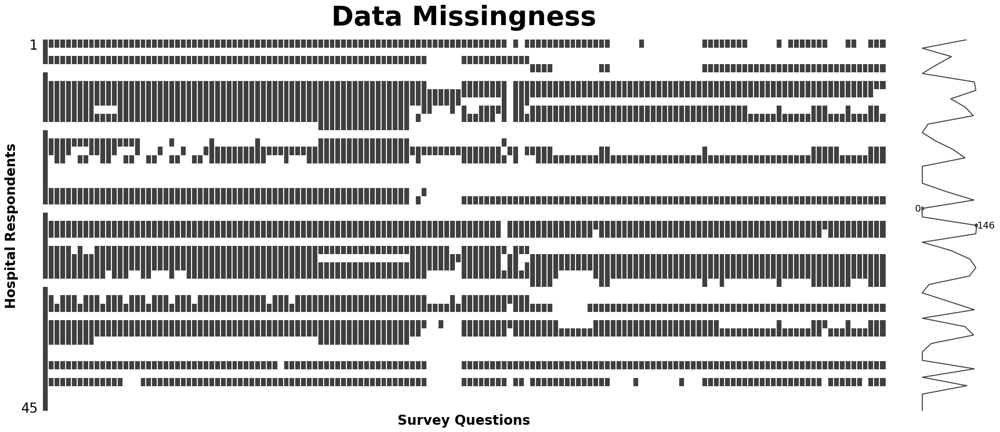

In [13]:
utils.display_missingness(single_index_df)

#### Assigning Datatypes

In [14]:
single_index_df.dtypes.value_counts()

object    147
Name: count, dtype: int64

#### COnvert all numericals to float dtype

In [15]:
def convert_object_to_float(df):
    '''
    Convert any eligible object columns to float while keeping NaN values.
    
    Input:
        df (pd.DataFrame): Dataframe with object columns containing numeric values and NaNs.
    
    Output:
        pd.DataFrame: Modified fataframe
    '''
    for col in df.columns:
        try:
            df[col] = pd.to_numeric(df[col], errors='raise').astype(float)
        except ValueError:
            pass

    return df

single_index_df = convert_object_to_float(single_index_df)

#### Recheck distribution

In [16]:
single_index_df.dtypes.value_counts()

float64    135
object      12
Name: count, dtype: int64

### Get columns with long form response:

In [17]:
# Filter columns where any value in that column has string length > 6
def has_long_string(series):
    """Check if any string in the column has length > 4."""
    return series.apply(lambda x: isinstance(x, str) and len(x) > 6).any()

long_form_response_df = single_index_df.loc[:, single_index_df.apply(has_long_string, axis=0)]
long_form_cols = long_form_response_df.columns
long_form_response_df

,"What, if any, current strategies or workarounds does your organization have relative to securing transportation? Open-Ended Response","If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Response","If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Comments:","Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Comments:",Is there anything else you would like to share regarding the process of discharging patients to post-acute care settings? Open-Ended Response,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 1:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 2:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 3:
0,plan ahead,2,NaN,NaN,hospitalized patients should be prioritized fo...,psych beds,PNMI,LTC/Res Care beds
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,its a challenge,2,they can't make resources be available,they can't make beds available,Patients with only Mainecare that have high co...,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,Community Psychiatric Resources,"Community elderly care , SNF,LTC",Hospital bed capacity
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,"For skilled placement and HD, we aren't able to",2,NaN,Homeward bound program,"Mainecare reimbursement is a problem, it doesn...","Increased inpatient length of stay, average ab...",Lack of facilities for geriatric neurocog pati...,Not enough pediatric residential facilities in...
6,"Gas cards, bus or taxi voucher, hospital van d...",2,NaN,Not helpful,"There is a lack of services, lack of beds at r...",n/a,NaN,NaN
7,NaN,2,NaN,Their homeward bound is successful. Otherwise...,The state medicaid program needs a higher reim...,NaN,NaN,NaN
8,Uber Van purchased services,Not Helpful - Unresponsive to request/ no plac...,NaN,No help,NaN,Hospital inpatient beds,Psych hospital beds,NaN
9,NaN,Mostly Helpful - Assistance provided and Place...,NaN,They have not been helpful. Outcome of patien...,The closure of nursing homes has made it extre...,Availability of open beds for acutely ill pati...,Disruptive behavior,Not enough staff


### Column Types and NaN Ratios

In [18]:
def check_column_types_and_nans(df, threshold=0.2):
    '''
    Checks each column of a dataframe and returns a list of numerical attributes and nominal attributes, 
    along with NaN counts for each column
    
    Inputs:
        df(pd.DataFrame): Dataframe to be checked.
        threhsold(float): NAN ratio threshold to add cols to exclusion list. Default is 0.20.
    Out:
        dict{
            'numerical_cols': numerical_cols,     
            'nominal_cols': non_numerical_cols,       
            }
    '''
    
    numerical_cols = []
    num_nan_count = []
    non_numerical_cols = []
    nom_nan_count = []
    nan_above_thresold = []
    
    # Iterate through each column in the DataFrame
    for col in df.columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            numerical_cols.append(col)
            nan_count = df[col].isna().sum()
            num_nan_count.append(nan_count) # Count NaN values for the column
            nan_above_thresold.append(col) if nan_count/df.shape[0] > threshold else None
        else:
            non_numerical_cols.append(col)
            nan_count = df[col].isna().sum()
            nom_nan_count.append(nan_count)  
            nan_above_thresold.append(col) if nan_count/df.shape[0] > threshold else None

    
    # Print out the results with Dtype and NaN counts
    print("*"*50)
    print(f"Numerical Columns: {len(numerical_cols)}")
    if not numerical_cols:
        print("**NONE**")
    else:    
        for col, nan_count in zip(numerical_cols, num_nan_count):
            print(f"{col} \n - dtype: {df[col].dtype} \n - NaN count: {nan_count} \n - NaN ratio: {nan_count/df.shape[0]}")
    
    print("*"*50)    
    print(f"Non-Numerical Columns: {len(non_numerical_cols)}")
    if not non_numerical_cols:
        print("**NONE**")
    else:
        for col, nan_count in zip(non_numerical_cols, nom_nan_count):
            print(f"{col} \n - dtype: {df[col].dtype} \n - NaN count: {nan_count} \n - NaN ratio: {nan_count/df.shape[0]}")

    print("*"*50)
    print(f"Columns with NAN ration greather than {threshold * 100}%: {len(nan_above_thresold)}")
    if not nan_above_thresold:
        print("**NONE**")
    else:
        for col in nan_above_thresold:
            print(col)
            
    return {'numerical_cols': numerical_cols, 'nominal_cols': non_numerical_cols, 'nan_above_threshold': nan_above_thresold}

col_info_dict = check_column_types_and_nans(single_index_df, threshold=.99)

**************************************************
Numerical Columns: 135
Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF): 
 - dtype: float64 
 - NaN count: 21 
 - NaN ratio: 0.4666666666666667
Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC): 
 - dtype: float64 
 - NaN count: 21 
 - NaN ratio: 0.4666666666666667
Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF): 
 - dtype: float64 
 - NaN count: 20 
 - NaN ratio: 0.4444444444444444
Total number of patients awaiting discharge to the following settings: Home Health: 
 - dtype: float64 
 - NaN count: 21 
 - NaN ratio: 0.4666666666666667
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF): 
 - dtype: float64 
 - NaN count: 23 
 - NaN ratio: 0.5111111111111111
Of the total patients reported in Question 1, how many

In [19]:
def separate_unique_columns(df):
    """
    This function separates columns of a DataFrame into those with 100% unique values and those with less than 100% unique values.

    Args:
    df (pd.DataFrame): The DataFrame containing the data.

    Returns:
    dict: A dictionary with two keys: '100% unique' and '<100% unique'. Each contains a list of column names.
    """
    unique_cols = []
    non_unique_cols = []

    for column in df.columns:
        num_unique = df[column].nunique()
        total_values = df[column].size
        
        if num_unique == total_values:
            unique_cols.append(column)
        else:
            non_unique_cols.append(column)
    
    print("*****************************")
    print("non_ML_attr")
    for attr in unique_cols:
        print(attr)
    print("*****************************")
    print("ML_attr")
    for attr in non_unique_cols:
        print(attr)

    return {
        'non_ML_attr': unique_cols,
        'ML_attr': non_unique_cols
    }

ml_attr_dict = separate_unique_columns(single_index_df)

*****************************
non_ML_attr
*****************************
ML_attr
Is your facility designated a Critical Access Hospital? Response
Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):
Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):
Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):
Total number of patients awaiting discharge to the following settings: Home Health:
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision

In [20]:
# seperate nominal machine learning attributes
nominal_df = single_index_df[[col for col in col_info_dict['nominal_cols'] if col not in ml_attr_dict['non_ML_attr']]].copy()
nominal_attr = nominal_df.columns.to_list()
print(f"Nominal Features: {nominal_attr}")
nominal_df

Nominal Features: ['Is your facility designated a Critical Access Hospital? Response', 'What, if any, current strategies or workarounds does your organization have relative to securing transportation? Open-Ended Response', 'If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Response', 'If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Comments:', 'Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Response', 'Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Comments:', 'Is there

,Is your facility designated a Critical Access Hospital? Response,"What, if any, current strategies or workarounds does your organization have relative to securing transportation? Open-Ended Response","If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Response","If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Comments:","Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Response","Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Comments:",Is there anything else you would like to share regarding the process of discharging patients to post-acute care settings? Open-Ended Response,"Have any staff been injured or threatened, verbally or physically, by patients > 17 years of age your emergency department? Response","Have any staff been injured or threatened, verbally or physically, by the patients <18 years of age in your emergency department? Response",What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 1:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 2:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 3:
0,No,plan ahead,2,NaN,Yes,NaN,hospitalized patients should be prioritized fo...,Yes,Yes,psych beds,PNMI,LTC/Res Care beds
1,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,No,its a challenge,2,they can't make resources be available,Yes,they can't make beds available,Patients with only Mainecare that have high co...,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,Community Psychiatric Resources,"Community elderly care , SNF,LTC",Hospital bed capacity
4,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,No,"For skilled placement and HD, we aren't able to",2,NaN,Yes,Homeward bound program,"Mainecare reimbursement is a problem, it doesn...",Yes,Yes,"Increased inpatient length of stay, average ab...",Lack of facilities for geriatric neurocog pati...,Not enough pediatric residential facilities in...
6,No,"Gas cards, bus or taxi voucher, hospital van d...",2,NaN,Yes,Not helpful,"There is a lack of services, lack of beds at r...",No,No,n/a,NaN,NaN
7,No,NaN,2,NaN,Yes,Their homeward bound is successful. Otherwise...,The state medicaid program needs a higher reim...,NaN,NaN,NaN,NaN,NaN
8,No,Uber Van purchased services,Not Helpful - Unresponsive to request/ no plac...,NaN,Yes,No help,NaN,No,No,Hospital inpatient beds,Psych hospital beds,NaN
9,Yes,NaN,Mostly Helpful - Assistance provided and Place...,NaN,Yes,They have not been helpful. Outcome of patien...,The closure of nursing homes has made it extre...,Yes,Yes,Availability of open beds for acutely ill pati...,Disruptive behavior,Not enough staff


In [21]:
print("Cardinality of Nominal Features:")
print(nominal_df.nunique())

Cardinality of Nominal Features:
Is your facility designated a Critical Access Hospital? Response                                                                                                                                                                                             2
What, if any, current strategies or workarounds does your organization have relative to securing transportation? Open-Ended Response                                                                                                                        20
If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Response      4
If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1

In [22]:
# seperate numerical machine learning attributes
numerical_df = single_index_df[[col for col in col_info_dict['numerical_cols'] if col not in ml_attr_dict['non_ML_attr']]].copy()
numerical_attr = numerical_df.columns.to_list()
print(f"Numerical Features: {numerical_attr}")
numerical_df

Numerical Features: ['Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):', 'Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):', 'Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):', 'Total number of patients awaiting discharge to the following settings: Home Health:', 'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):', 'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):', 'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):', 'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:', 'Of the total patients reported in Question 1, how many patients are residents of oth

,Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):,Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):,Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):,Total number of patients awaiting discharge to the following settings: Home Health:,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:","Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):","Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Long Term Care Hospital (LTC):",...,"Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation","Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response","If Yes, how many have been impacted in the past week?.1 Open-Ended Response","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other"
0,15.0,0.0,7.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,2.0,NaN,NaN,NaN,1.0,2.0,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4.0,8.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,2.0,0.0,5.0,0.0,1.0,1.0,0.0,0.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,17.0,21.0,2.0,27.0,1.0,2.0,0.0,0.0,0.0,0.0,...,0.0,1.0,2.0,17.0,0.0,0.0,2.0,1.0,1.0,0.0
6,0.0,0.0,12.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,22.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,3.0,3.0,1.0,5.0,2.0,1.0,0.0,0.0,NaN,NaN,...,NaN,0.0,0.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN
9,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [23]:
# Compute statistcs for numerical col
numerical_stats = numerical_df.describe()

print("Statistics of each column:")
numerical_stats

Statistics of each column:


,Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):,Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):,Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):,Total number of patients awaiting discharge to the following settings: Home Health:,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:","Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):","Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Long Term Care Hospital (LTC):",...,"Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation","Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response","If Yes, how many have been impacted in the past week?.1 Open-Ended Response","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other"
count,24.000000,24.000000,25.000000,24.000000,22.000000,23.000000,23.000000,23.0,22.000000,22.000000,...,16.0000,20.000000,17.000000,17.000000,17.000000,16.000000,19.000000,16.000000,15.000000,14.000000
mean,5.666667,4.541667,2.000000,3.125000,0.454545,0.521739,0.260870,0.0,0.090909,0.045455,...,0.0625,0.800000,1.764706,3.176471,0.588235,0.125000,0.894737,0.625000,0.066667,0.142857
std,6.932386,7.040128,2.929733,7.176729,1.335496,0.897956,0.751809,0.0,0.294245,0.213201,...,0.2500,0.833509,3.250566,6.821247,1.277636,0.341565,1.328940,0.957427,0.258199,0.363137
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,2.000000,1.000000,0.500000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7.000000,3.500000,3.000000,2.000000,0.000000,1.000000,0.000000,0.0,0.000000,0.000000,...,0.0000,1.000000,2.000000,3.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000
max,24.000000,23.000000,12.000000,27.000000,6.000000,3.000000,3.0

In [24]:
# Confirm all attributes are accounted for
assert (single_index_df.shape[1] == len(numerical_attr) + len(nominal_attr) + len(ml_attr_dict['non_ML_attr']))
print(f"All attributes in the train set have been accounted for.")
print()

print()
print("ML Ignore List:")
for idx, attr in enumerate(ml_attr_dict['non_ML_attr']):
    print(f"{idx + 1}. {attr}")
print()

print("Numerical Attributes:")
for idx, attr in enumerate(numerical_attr):
    print(f"{idx + 1}. {attr}")
print()

print("Nominal Attributes:")
for idx, attr in enumerate(nominal_attr):
    print(f"{idx + 1}. {attr}")
print()

print(f"Total Number of ML Attributes: {len(nominal_attr) + len(numerical_attr)}")

All attributes in the train set have been accounted for.


ML Ignore List:

Numerical Attributes:
1. Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):
2. Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):
3. Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):
4. Total number of patients awaiting discharge to the following settings: Home Health:
5. Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):
6. Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):
7. Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):
8. Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:
9. Of th

## Nominal EDA

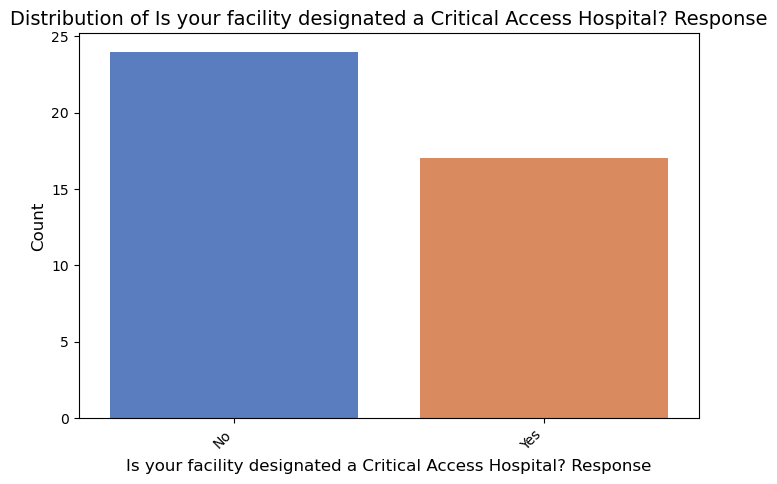


Frequency Distribution for Is your facility designated a Critical Access Hospital? Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Is your facility designated a Critical Access H...                            
No                                                     24                 58.5
Yes                                                    17                 41.5 



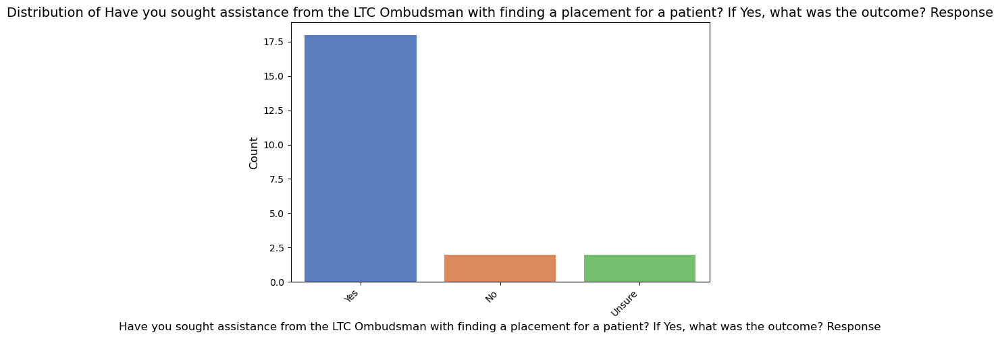


Frequency Distribution for Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Have you sought assistance from the LTC Ombudsm...                            
Yes                                                    18                 81.8
No                                                      2                  9.1
Unsure                                                  2                  9.1 



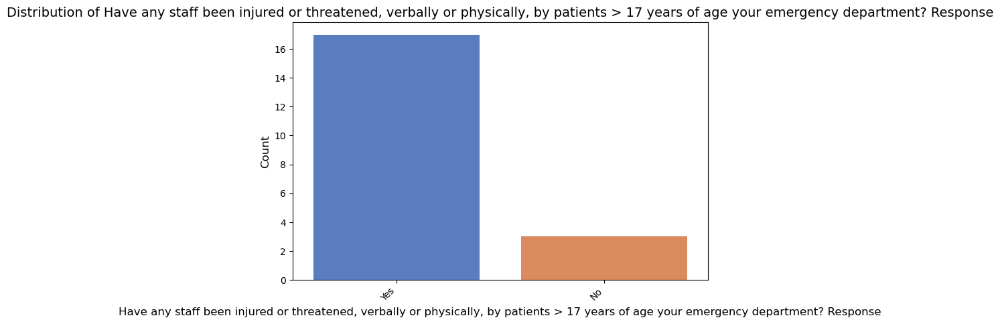


Frequency Distribution for Have any staff been injured or threatened, verbally or physically, by patients > 17 years of age your emergency department? Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Have any staff been injured or threatened, verb...                            
Yes                                                    17                 85.0
No                                                      3                 15.0 



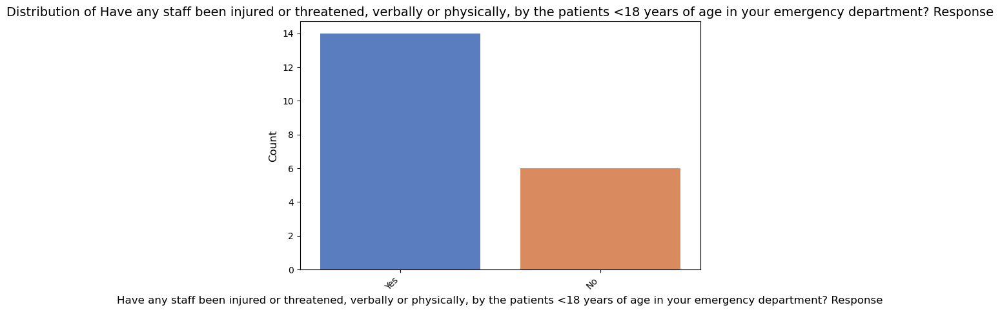


Frequency Distribution for Have any staff been injured or threatened, verbally or physically, by the patients <18 years of age in your emergency department? Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Have any staff been injured or threatened, verb...                            
Yes                                                    14                 70.0
No                                                      6                 30.0 



In [25]:
nominal_filtered_df = nominal_df[[col for col in nominal_df.columns if col not in long_form_cols]]

utils.nominal_eda(nominal_filtered_df)

### Longform Responses

In [26]:
for col in long_form_response_df:
    print("***"*50)
    print(f"Question: {col}")
    # Filter out NaNs
    non_nan_values = long_form_response_df[col].dropna()
    print("Responses:")
    for num, row in enumerate(non_nan_values):
        print(f"{num}. {row}")
    print("***"*50)


******************************************************************************************************************************************************
Question: What, if any, current strategies or workarounds does your organization have relative to securing transportation? Open-Ended Response
Responses:
0. plan ahead
1. its a challenge
2. For skilled placement and HD, we aren't able to  
3. Gas cards, bus or taxi voucher, hospital van driver, family, sometimes ambulance
4. Uber  Van purchased services
5. We work closely with area EMS to provide transportation 
6. Community transport-Western Maine  Taxi vouchers-when Taxi service is running
7. VOUCHERS
8. We have our own wheelchair transportation van that services Waldo and PenBay patients
9. We are fortunate to share a transport van with Pen Bay
10. Transportation is not a barrier/gap to discharge for our current area/surrounding area, it is lack of behavioral health beds/SUD Beds/LTC. There are not long term care beds available, and S

## Numerical EDA

____________________________________________________________________________________________________
Attribute: Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    24.000000
mean      5.666667
std       6.932386
min       0.000000
25%       1.000000
50%       3.000000
75%       7.000000
max      24.000000
Name: Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Total number of patients awaiting discharge to ...                            
0.0                                                     5        

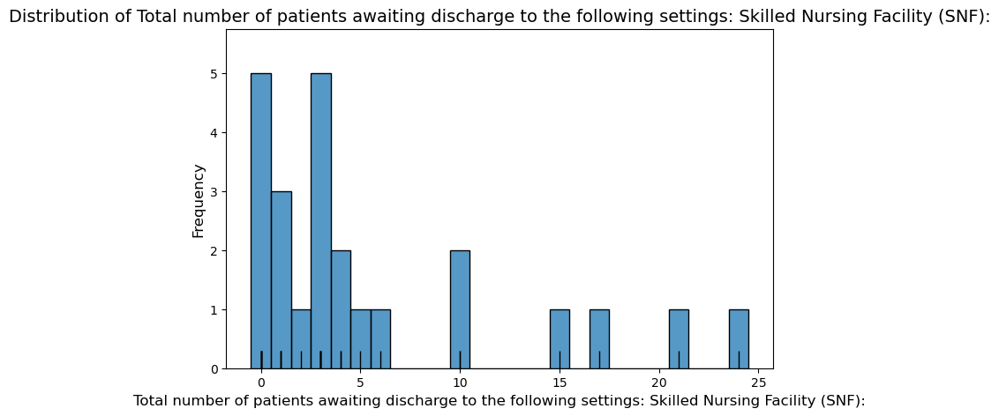

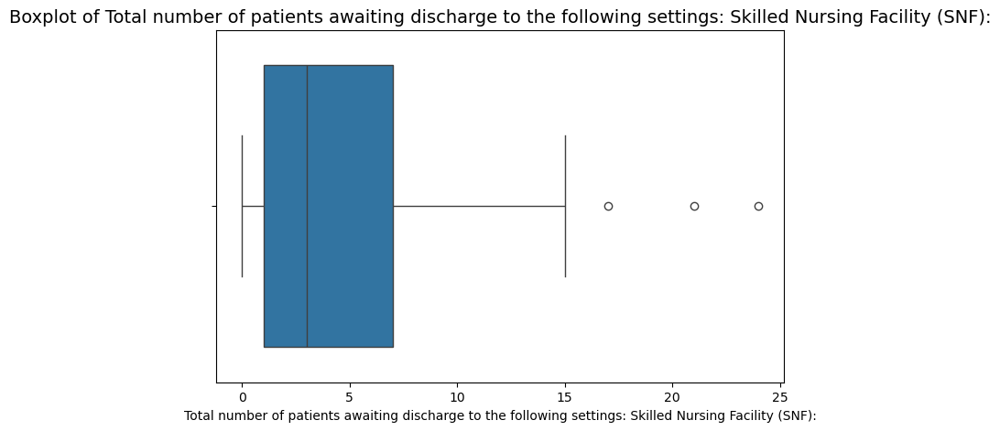

____________________________________________________________________________________________________
Attribute: Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    24.000000
mean      4.541667
std       7.040128
min       0.000000
25%       0.750000
50%       2.000000
75%       3.500000
max      23.000000
Name: Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Total number of patients awaiting discharge to ...                            
0.0                                                     6           

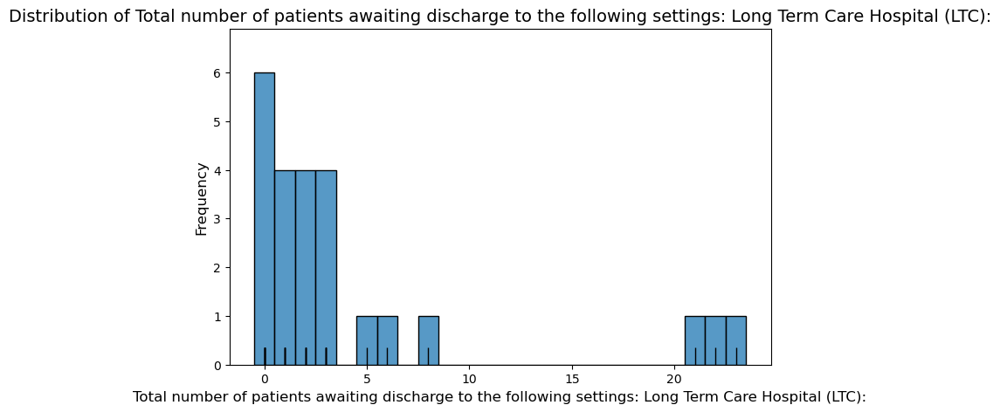

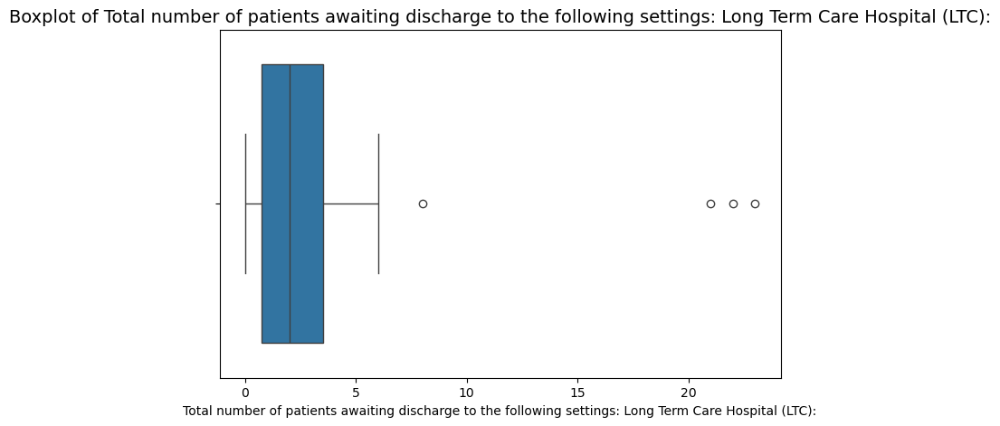

____________________________________________________________________________________________________
Attribute: Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    25.000000
mean      2.000000
std       2.929733
min       0.000000
25%       0.000000
50%       1.000000
75%       3.000000
max      12.000000
Name: Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Total number of patients awaiting discharge to ...                            
0.0                                                    10     

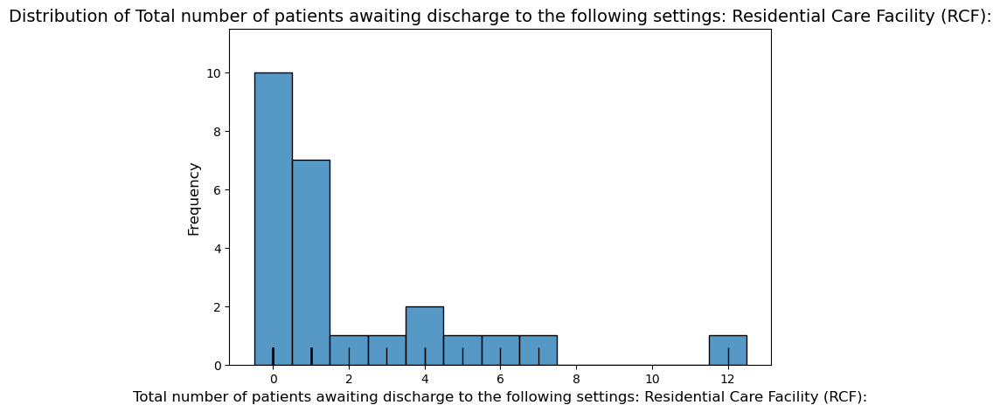

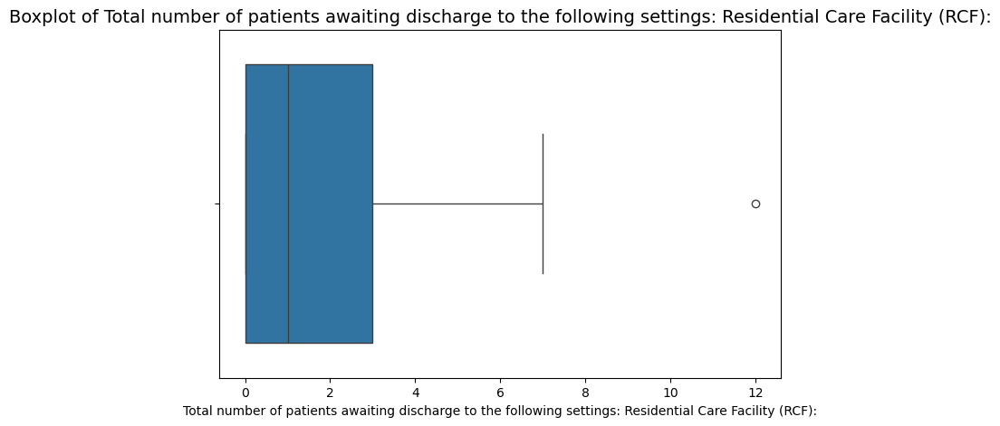

____________________________________________________________________________________________________
Attribute: Total number of patients awaiting discharge to the following settings: Home Health:
____________________________________________________________________________________________________
count    24.000000
mean      3.125000
std       7.176729
min       0.000000
25%       0.000000
50%       0.500000
75%       2.000000
max      27.000000
Name: Total number of patients awaiting discharge to the following settings: Home Health:, dtype: float64


Frequency Distribution for Total number of patients awaiting discharge to the following settings: Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Total number of patients awaiting discharge to ...                            
0.0                                                    12                 50.0
2.0                                        

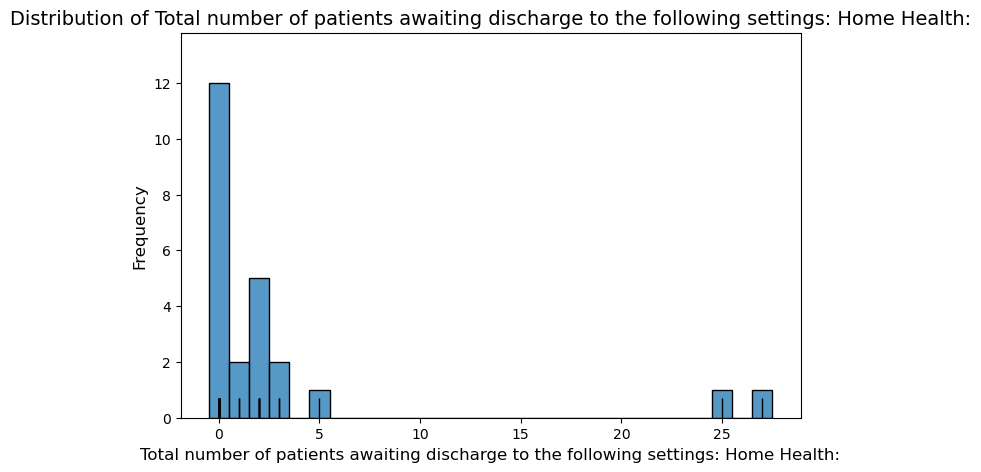

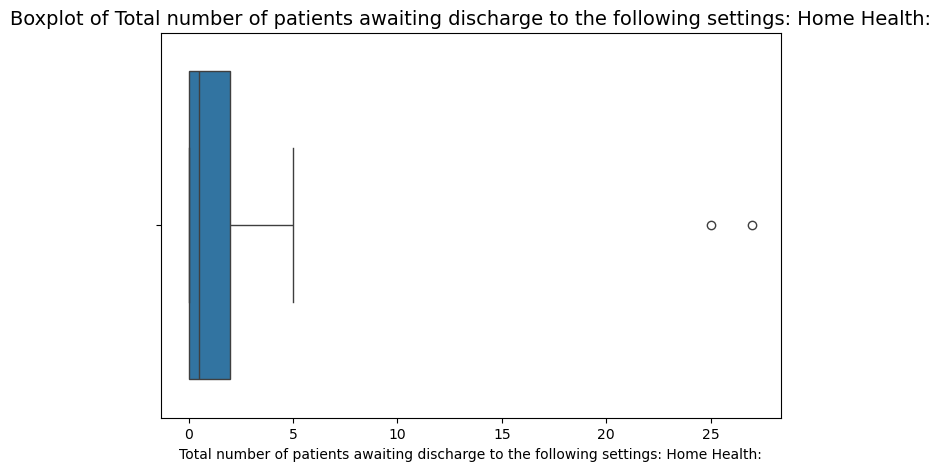

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    22.000000
mean      0.454545
std       1.335496
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       6.000000
Name: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.

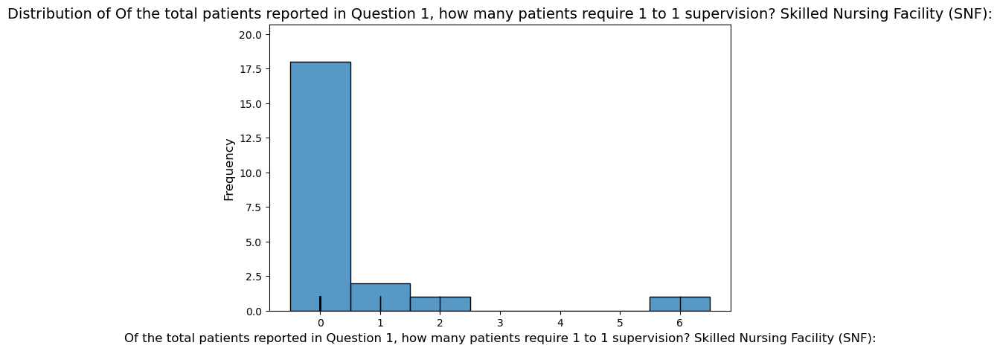

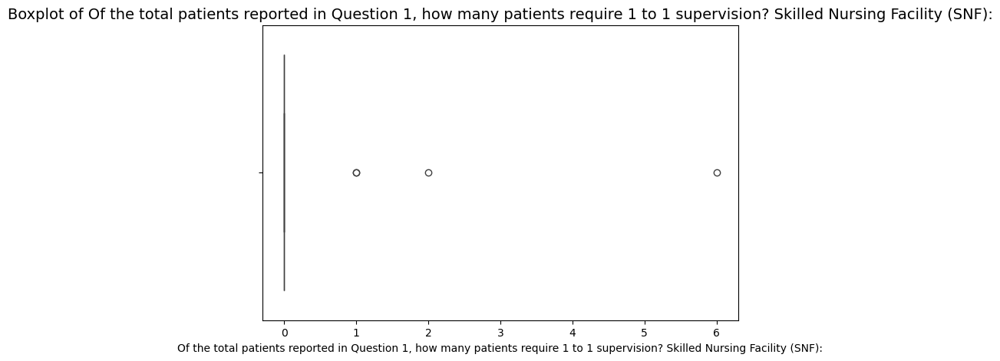

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    23.000000
mean      0.521739
std       0.897956
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0  

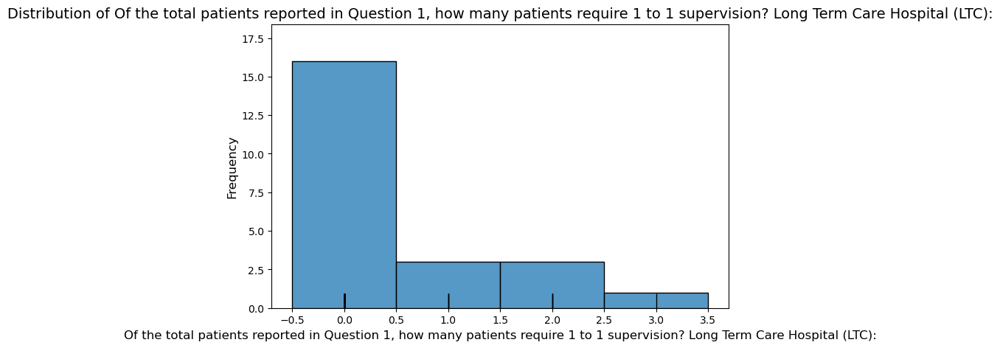

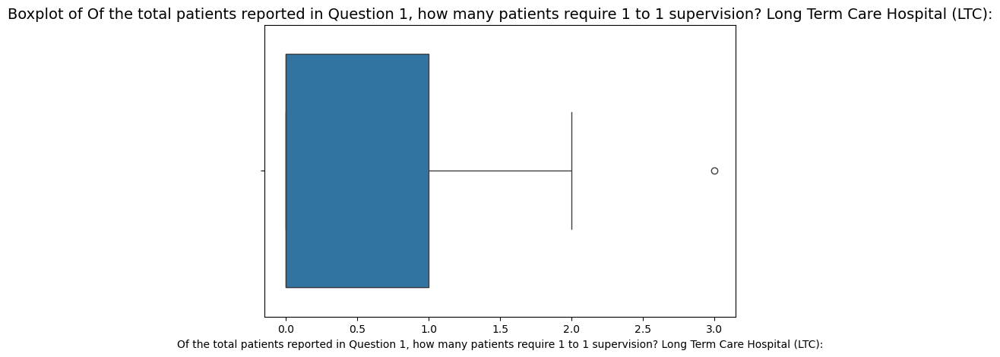

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    23.000000
mean      0.260870
std       0.751809
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       3.000000
Name: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            

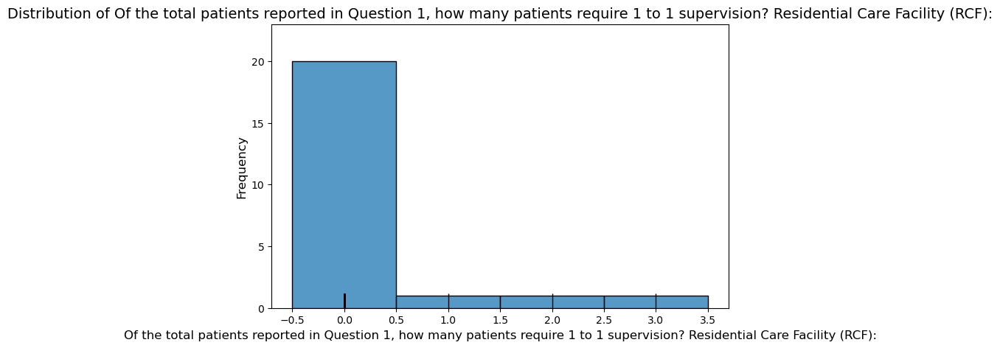

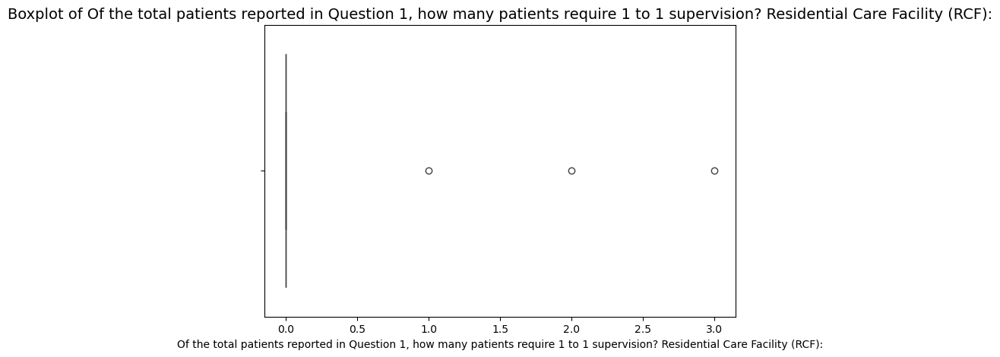

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:
____________________________________________________________________________________________________
count    23.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0                                                    23                100.0 


No significant ou

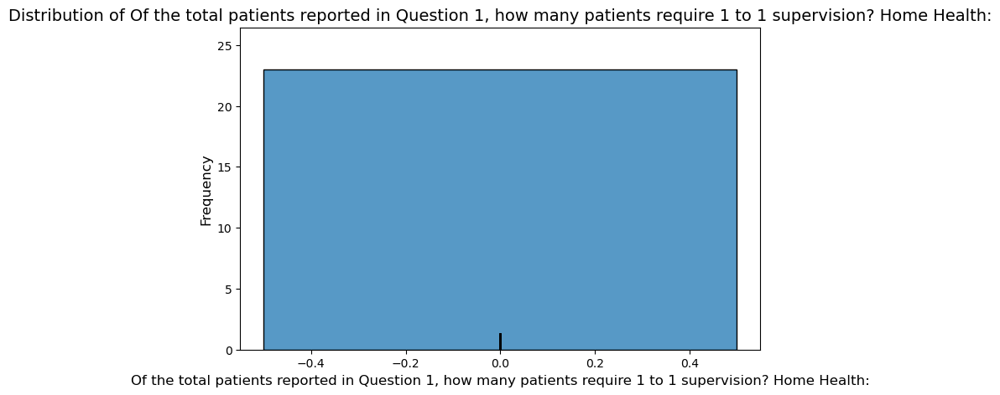

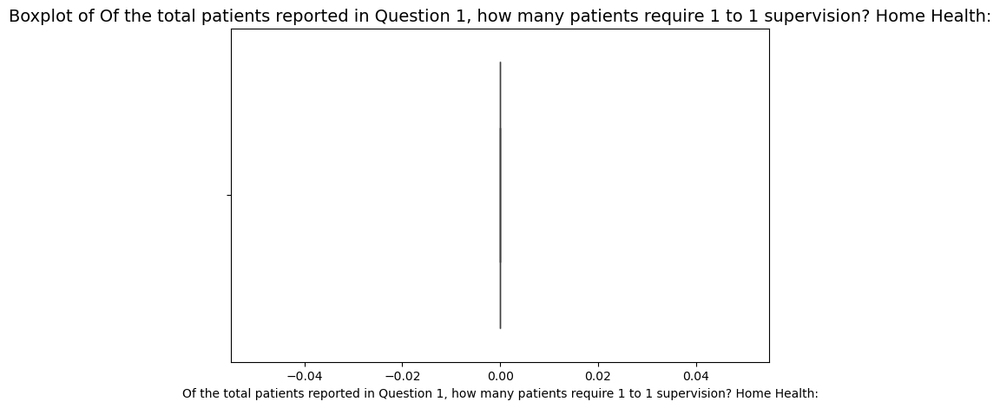

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    22.000000
mean      0.090909
std       0.294245
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled

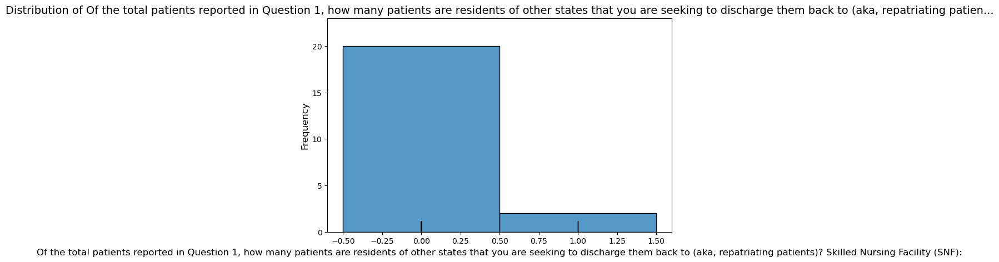

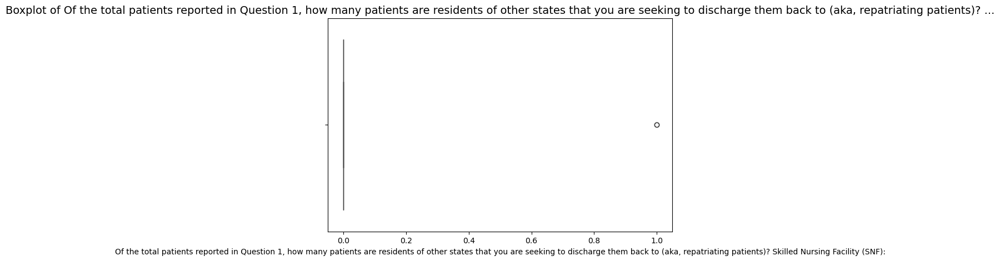

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    22.000000
mean      0.045455
std       0.213201
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Long Term

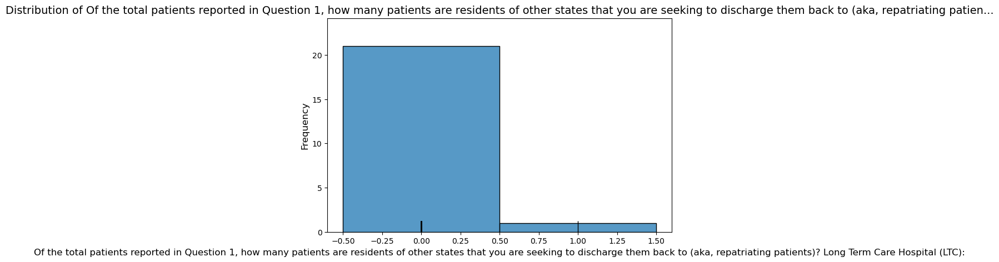

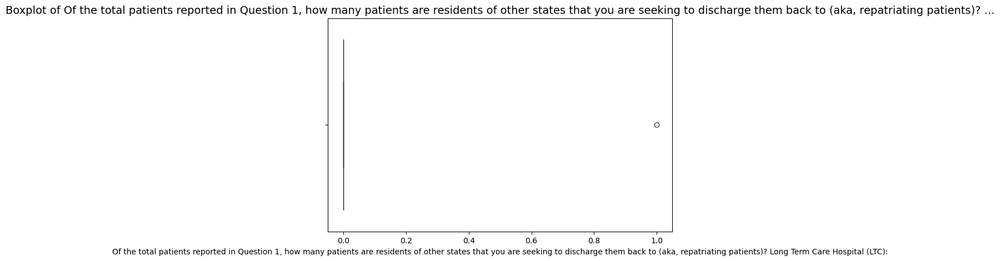

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    22.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Residential Care Facility (RCF)::
___________

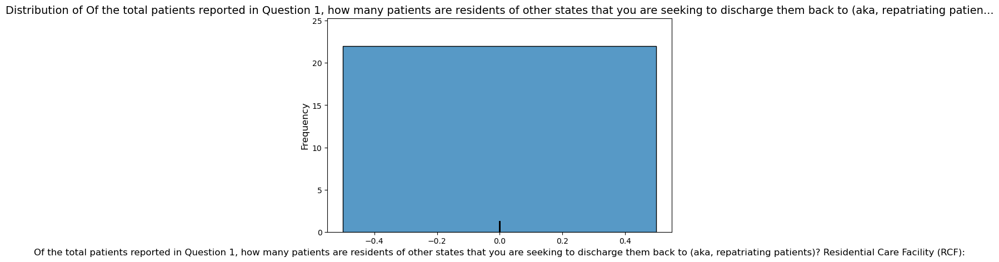

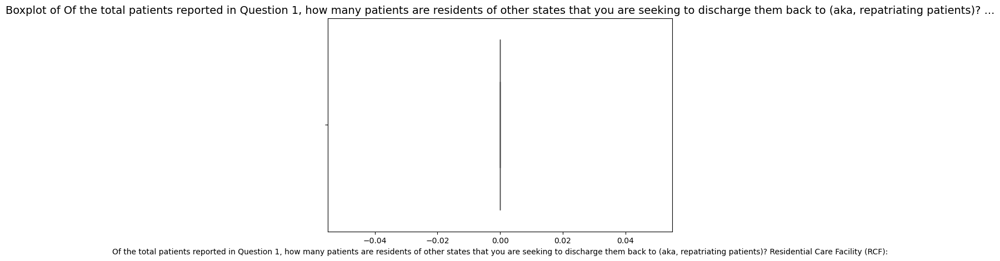

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Home Health:
____________________________________________________________________________________________________
count    22.000000
mean      0.136364
std       0.467563
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Home Health::
_______________________________

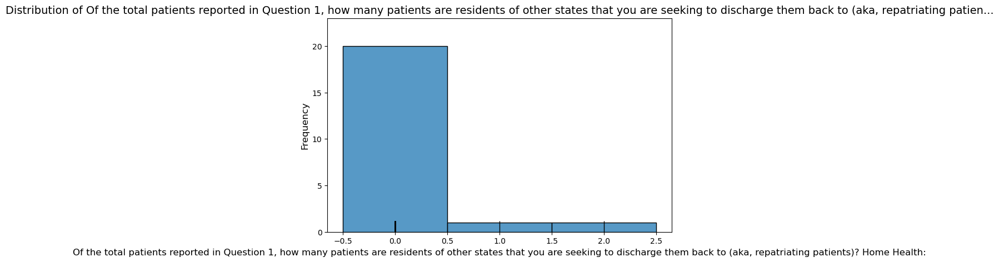

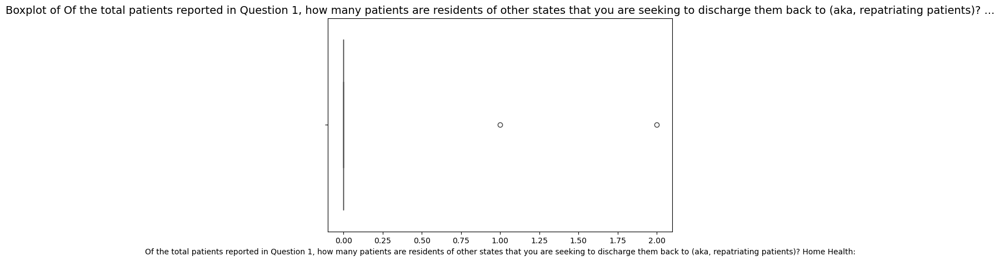

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    22.000000
mean      1.772727
std       2.706814
min       0.000000
25%       0.000000
50%       1.000000
75%       2.000000
max      10.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in

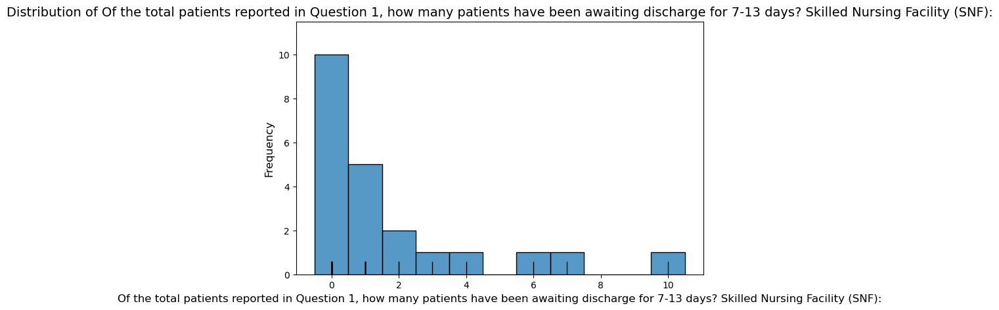

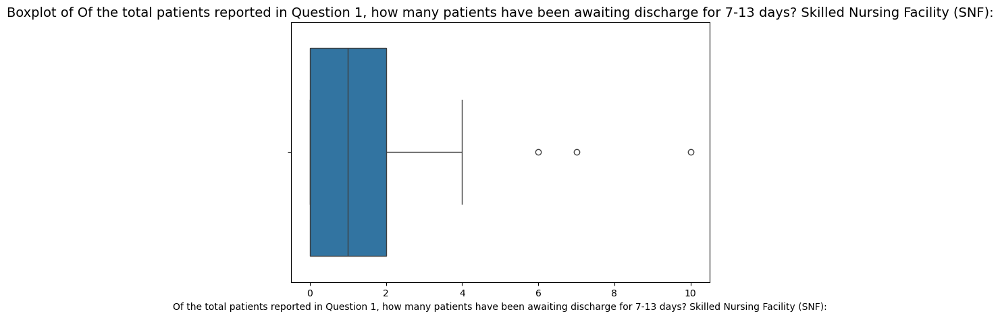

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    21.000000
mean      0.952381
std       1.465476
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       6.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Qu

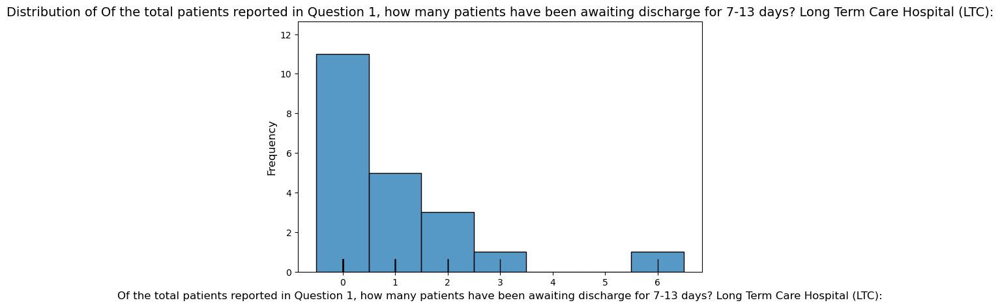

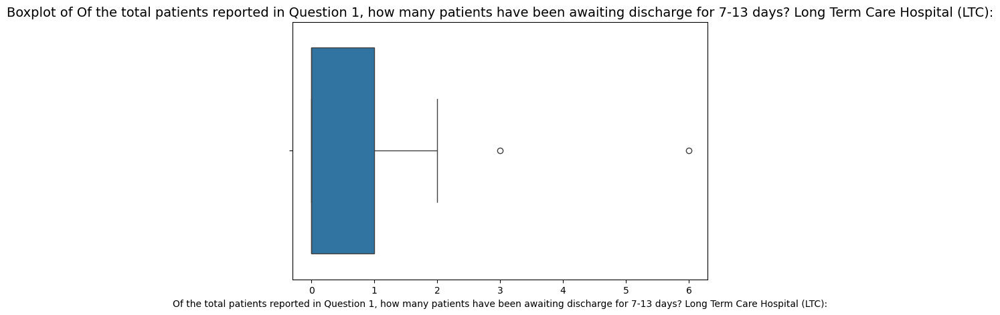

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    21.000000
mean      1.285714
std       2.326862
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      10.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported

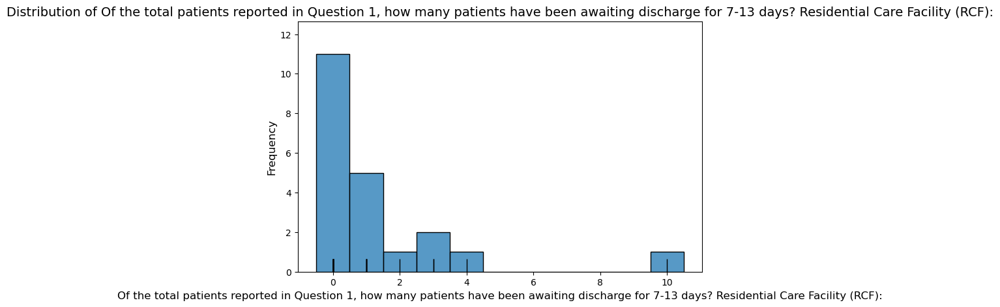

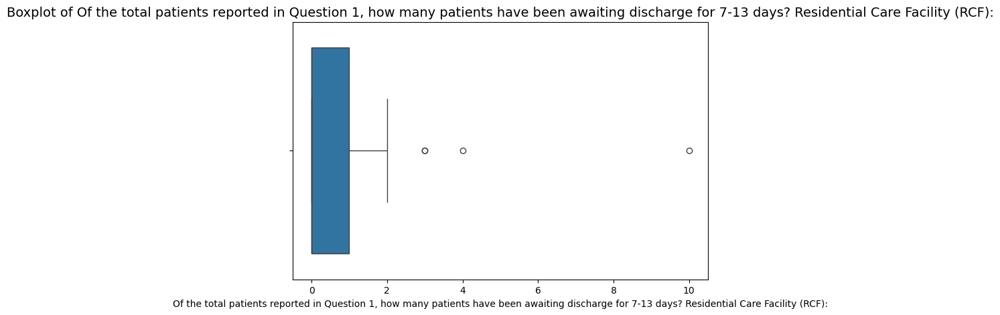

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Home Health:
____________________________________________________________________________________________________
count    21.000000
mean      1.238095
std       4.158182
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      19.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0        

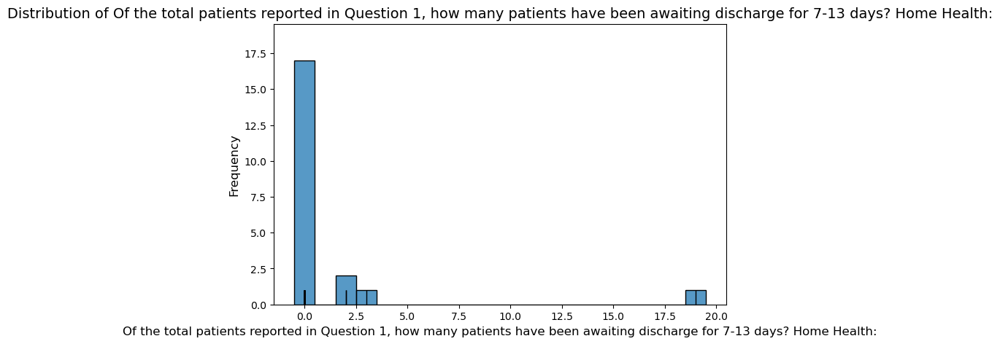

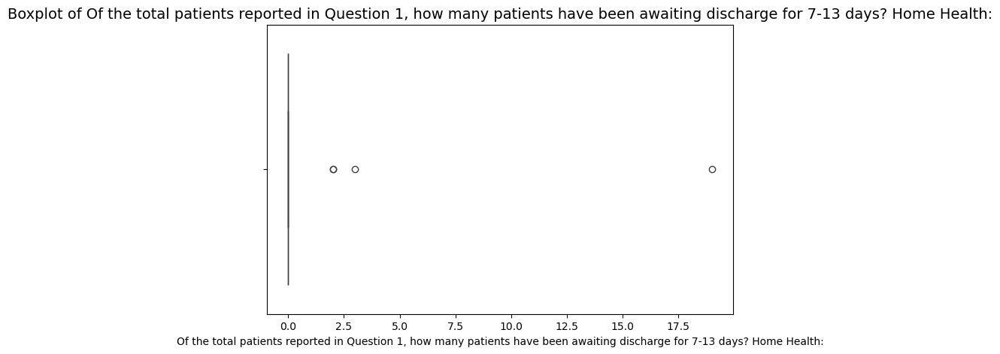

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    21.000000
mean      1.190476
std       2.482318
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      10.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported

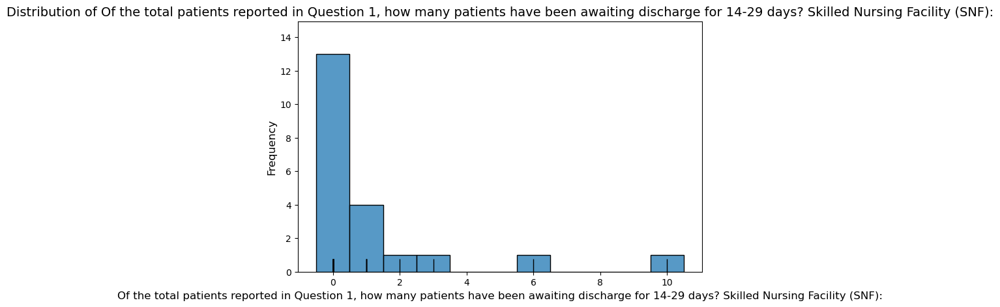

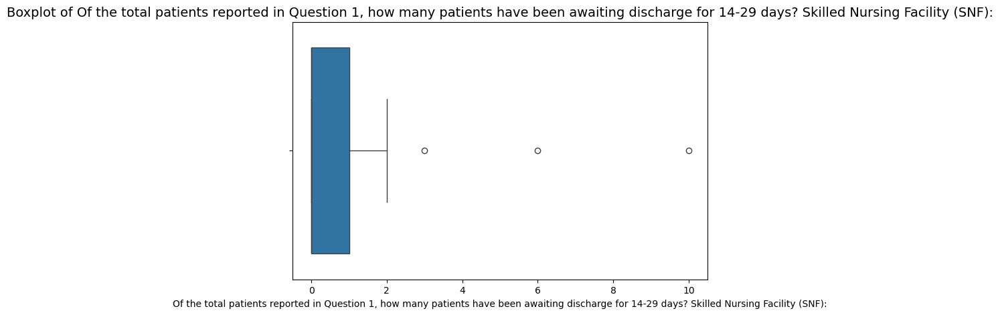

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    21.000000
mean      0.952381
std       1.499206
min       0.000000
25%       0.000000
50%       0.000000
75%       2.000000
max       6.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in

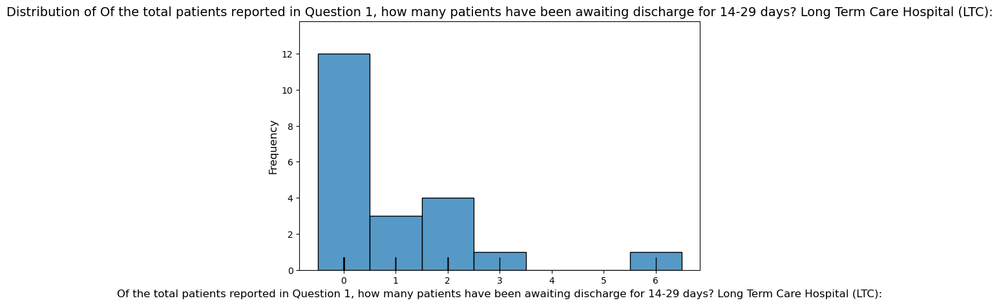

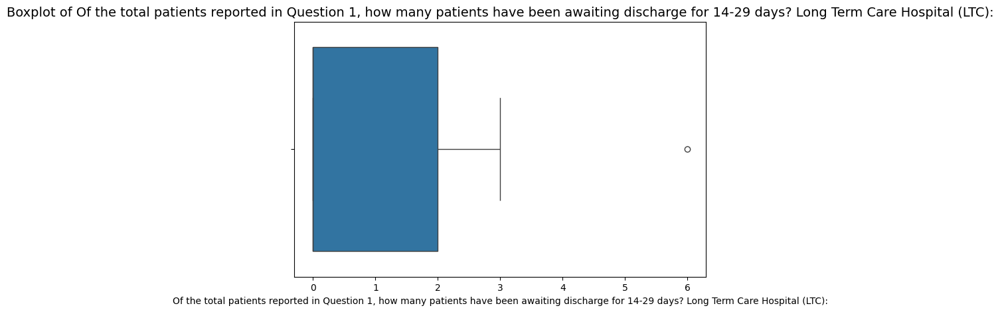

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    21.000000
mean      1.142857
std       2.351291
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      10.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients repor

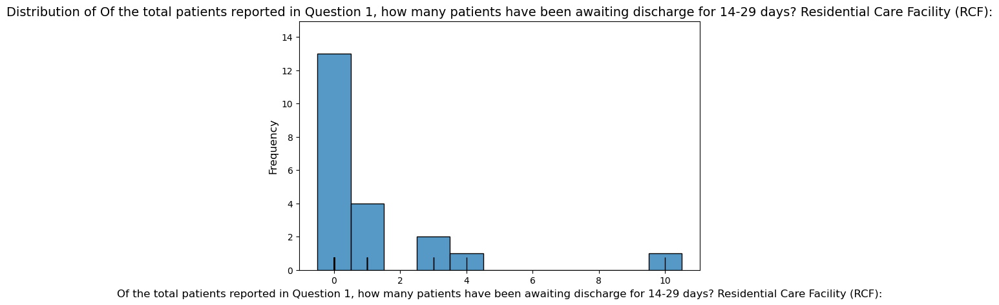

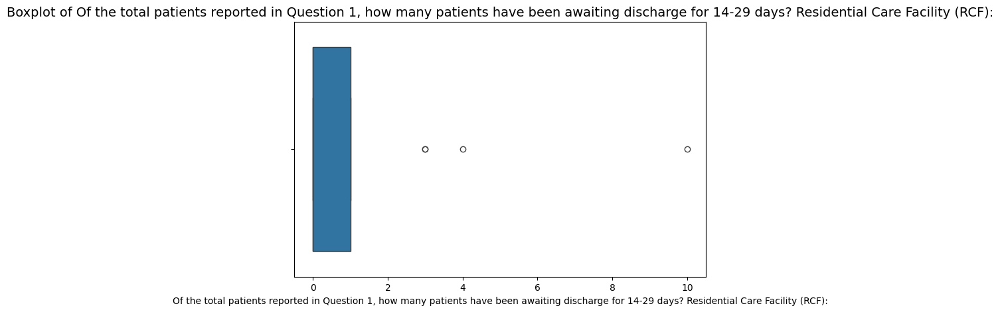

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Home Health:
____________________________________________________________________________________________________
count    21.000000
mean      0.285714
std       0.717137
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0     

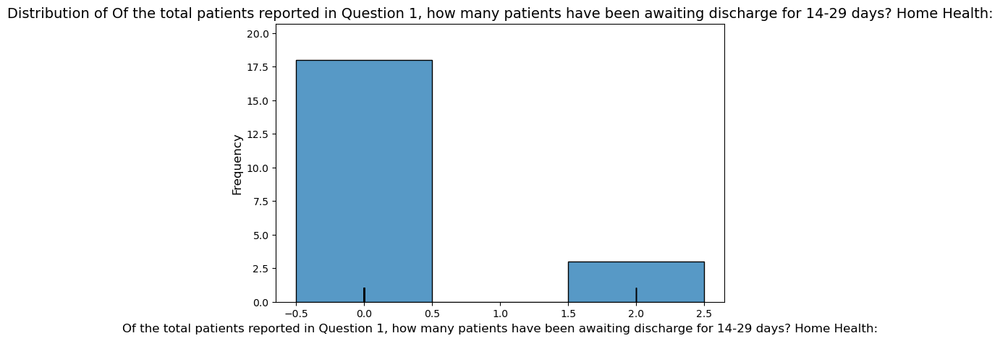

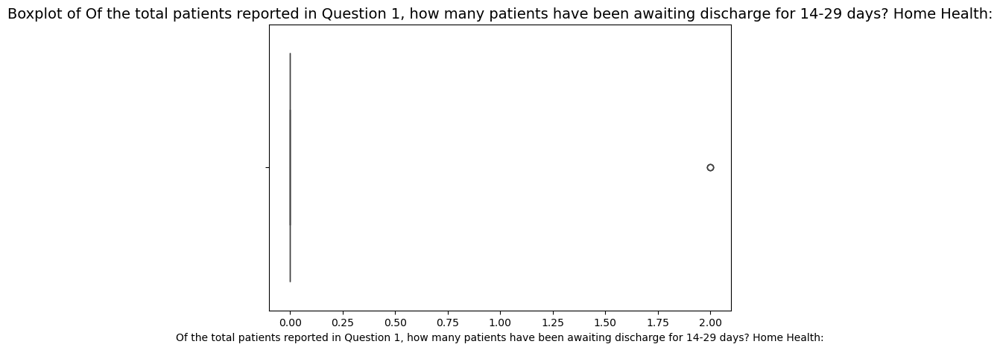

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    20.00000
mean      1.10000
std       2.04939
min       0.00000
25%       0.00000
50%       0.00000
75%       1.25000
max       8.00000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Skilled Nursing Facility (SNF)::
__________________________________________________
                           

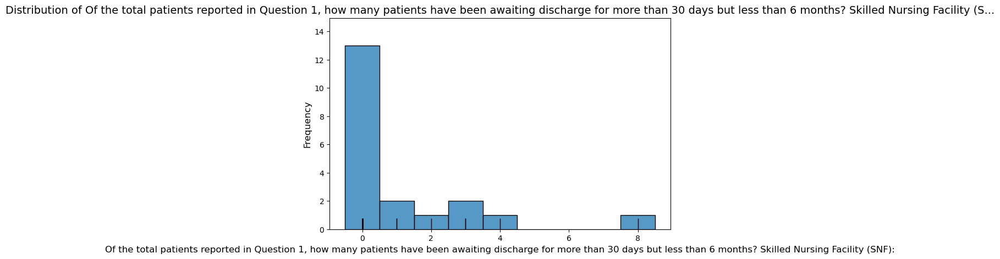

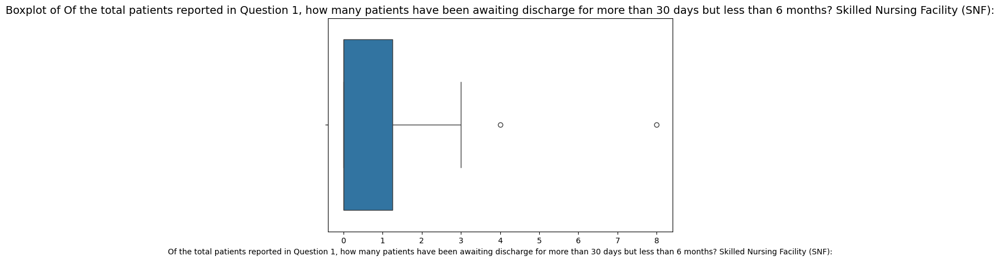

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    22.000000
mean      2.954545
std       5.524640
min       0.000000
25%       0.000000
50%       1.000000
75%       3.000000
max      20.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Long Term Care Hospital (LTC)::
__________________________________________________
                      

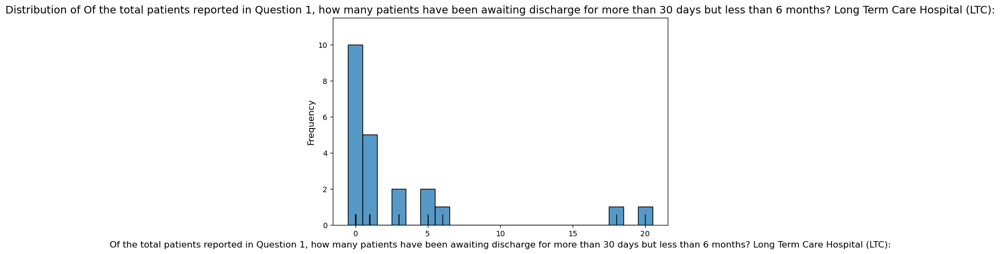

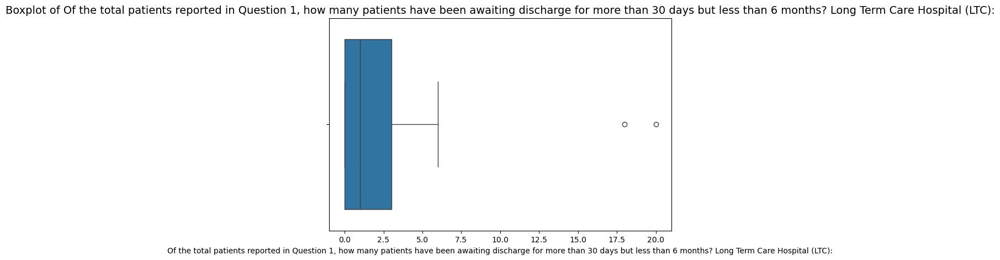

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    21.000000
mean      1.333333
std       2.105548
min       0.000000
25%       0.000000
50%       0.000000
75%       3.000000
max       8.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Residential Care Facility (RCF)::
__________________________________________________
                

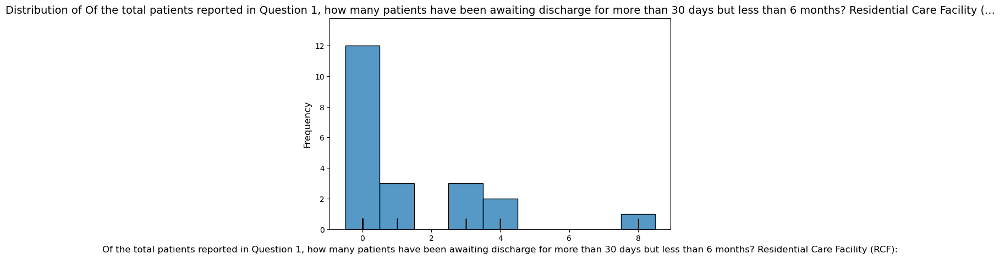

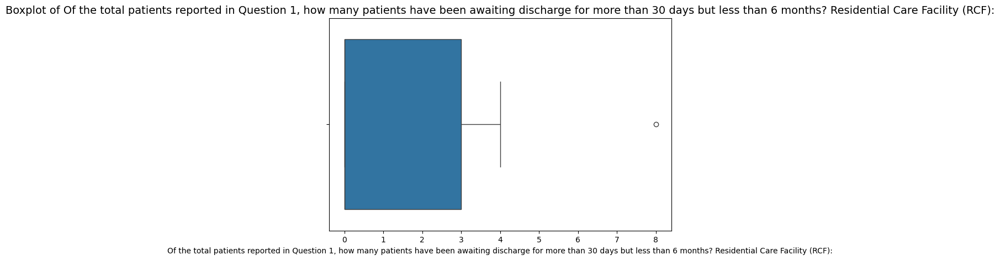

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Home Health:
____________________________________________________________________________________________________
count    21.000000
mean      0.095238
std       0.436436
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (

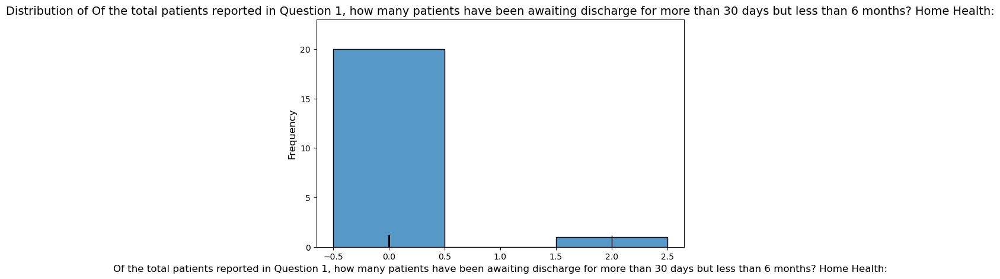

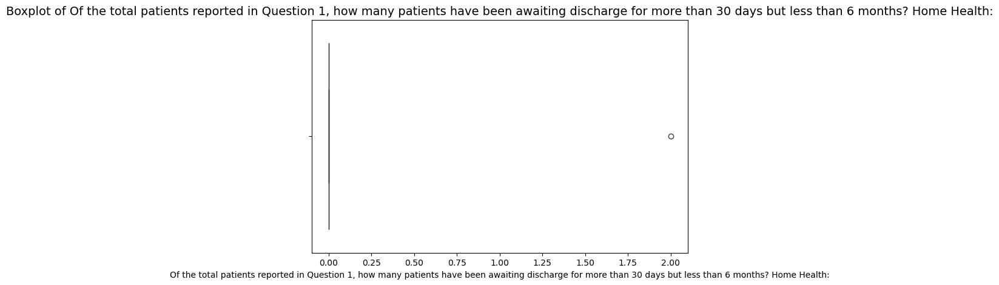

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    21.000000
mean      0.190476
std       0.511766
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the

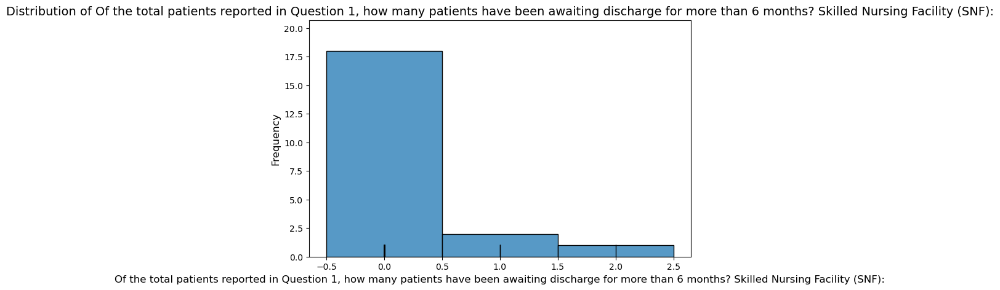

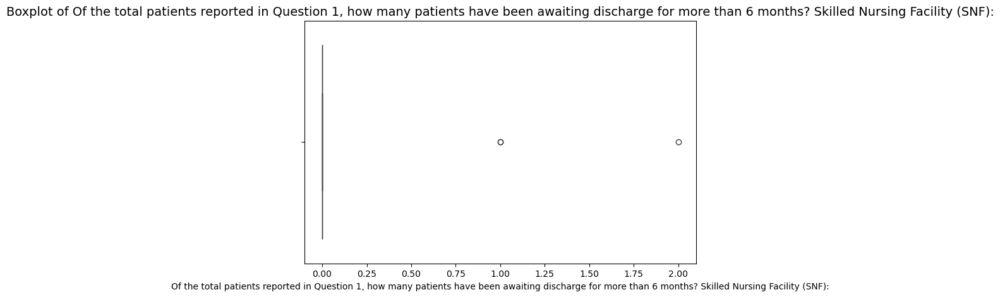

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    21.000000
mean      0.476190
std       0.980767
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       3.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the to

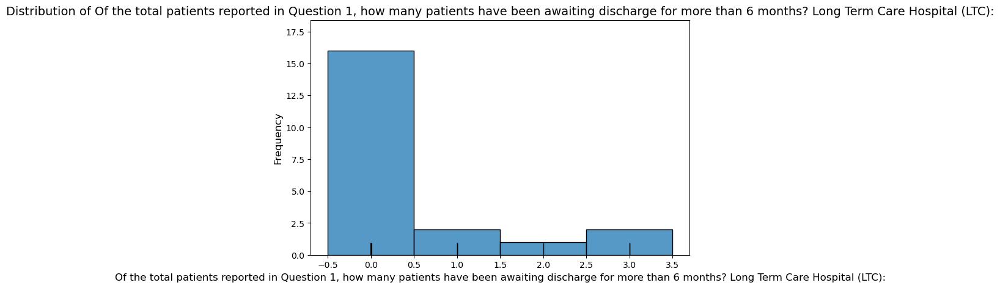

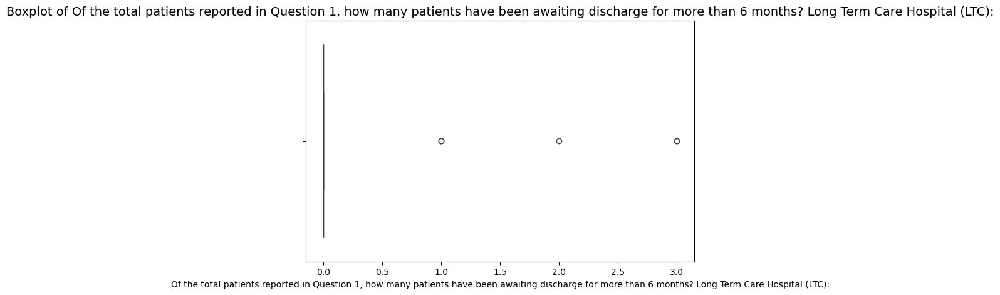

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    22.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 

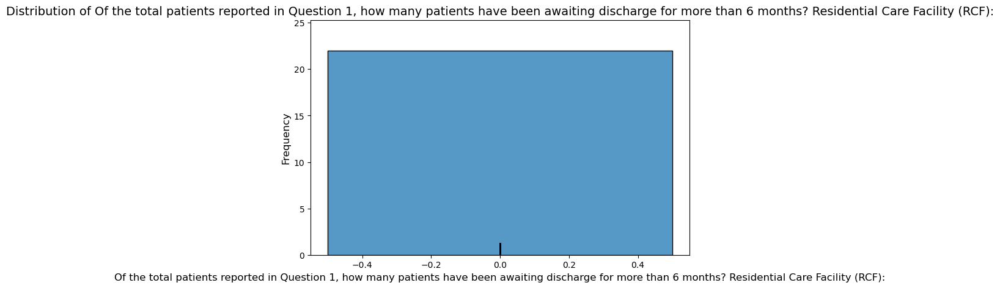

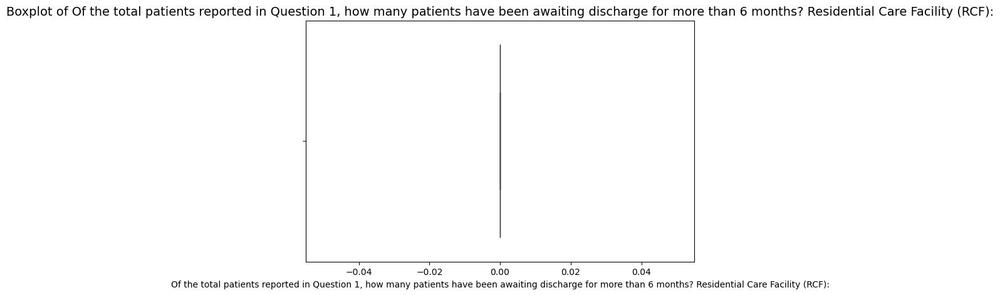

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Home Health:
____________________________________________________________________________________________________
count    22.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0                     

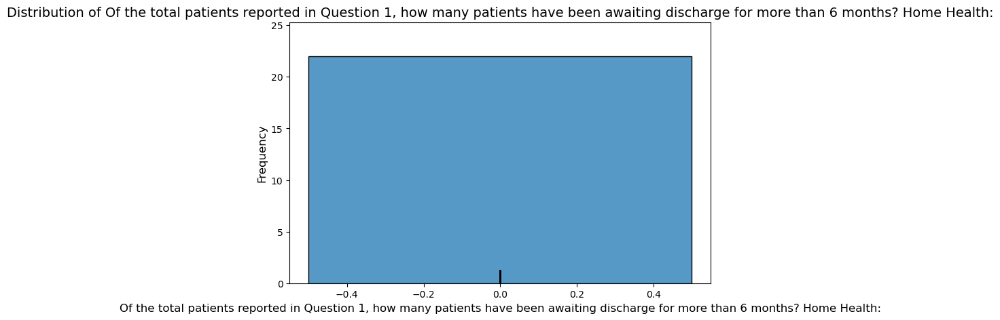

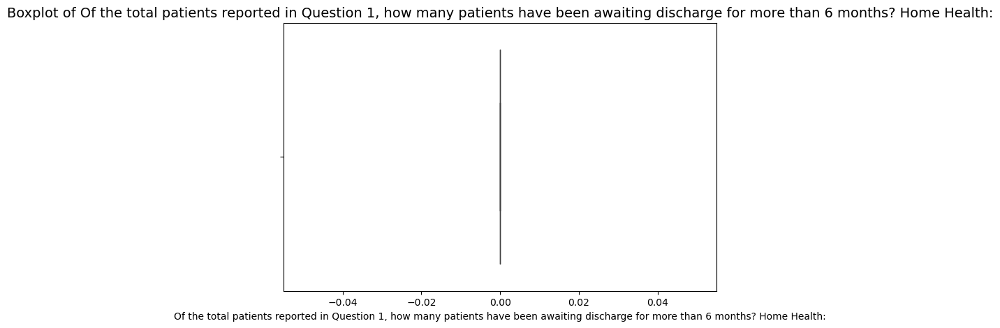

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many require short-term rehabilitation beds in SNFs? Open-Ended Response
____________________________________________________________________________________________________
count    24.000000
mean      3.250000
std       5.118169
min       0.000000
25%       0.000000
50%       1.500000
75%       4.000000
max      24.000000
Name: Of the total patients reported in Question 1, how many require short-term rehabilitation beds in SNFs? Open-Ended Response, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many require short-term rehabilitation beds in SNFs? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0  

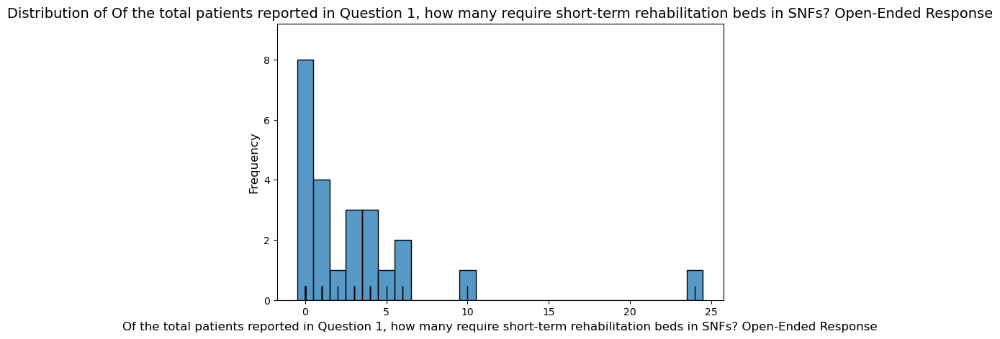

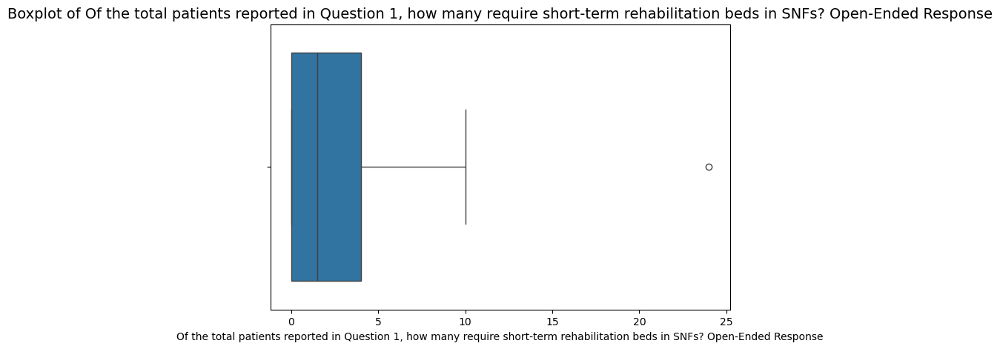

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many require the additional PT/OT before they can be discharged to a SNF/LTC/RCF/Home Care? Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      4.695652
std      11.395513
min       0.000000
25%       0.000000
50%       1.000000
75%       4.500000
max      55.000000
Name: Of the total patients reported in Question 1, how many require the additional PT/OT before they can be discharged to a SNF/LTC/RCF/Home Care? Open-Ended Response, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many require the additional PT/OT before they can be discharged to a SNF/LTC/RCF/Home Care? Open-Ended Response:
__________________________________________________
                                              

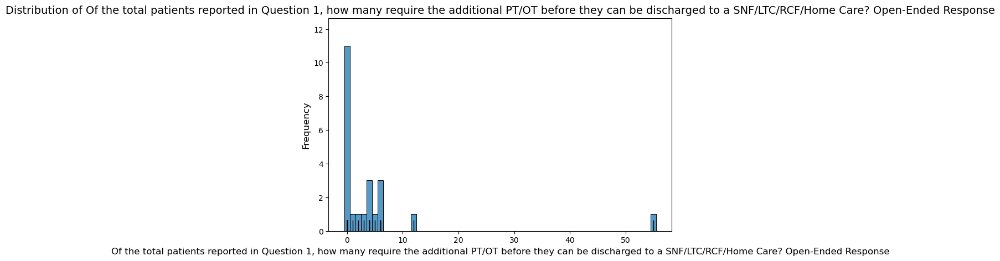

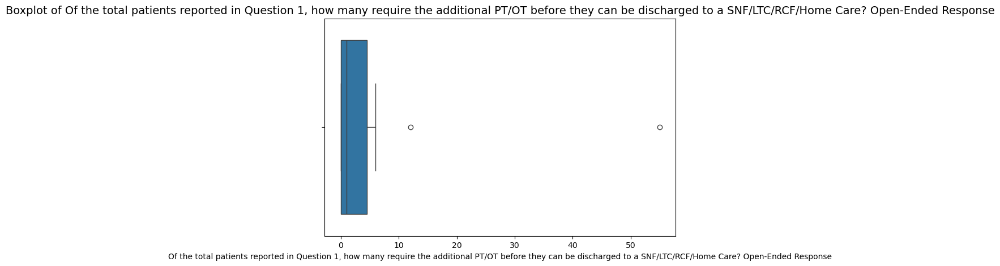

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many require long-term care beds in SNFs? Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      2.565217
std       3.244941
min       0.000000
25%       0.000000
50%       1.000000
75%       4.000000
max      11.000000
Name: Of the total patients reported in Question 1, how many require long-term care beds in SNFs? Open-Ended Response, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many require long-term care beds in SNFs? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0                                   

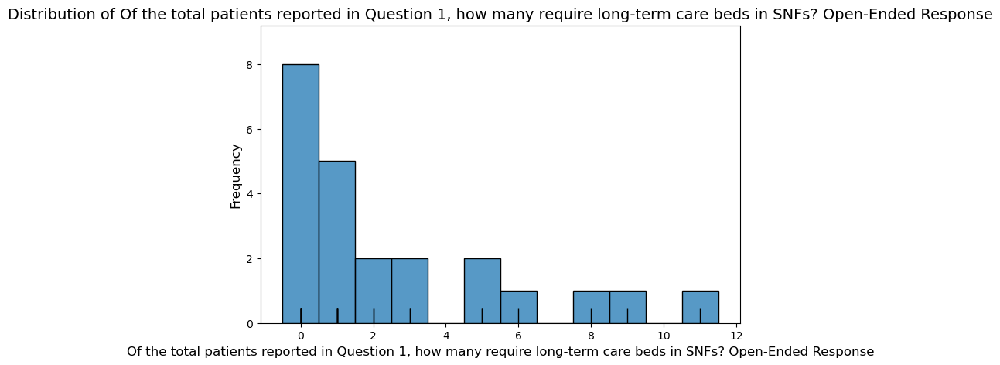

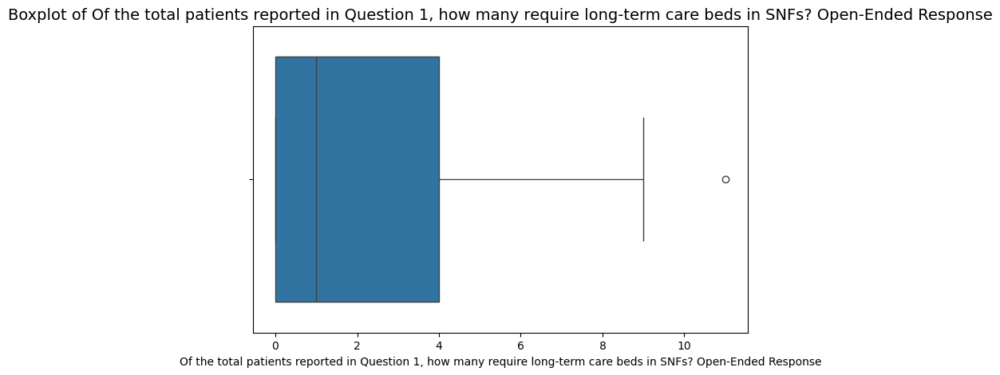

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to SNF beds with geri-psych capabilities: Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      0.695652
std       1.222322
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       5.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to SNF beds with geri-psych capabilities: Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number awaiting discharge to SNF beds with geri-psych capabilities: Open-Ended Response:
__________________________________________________
                                           

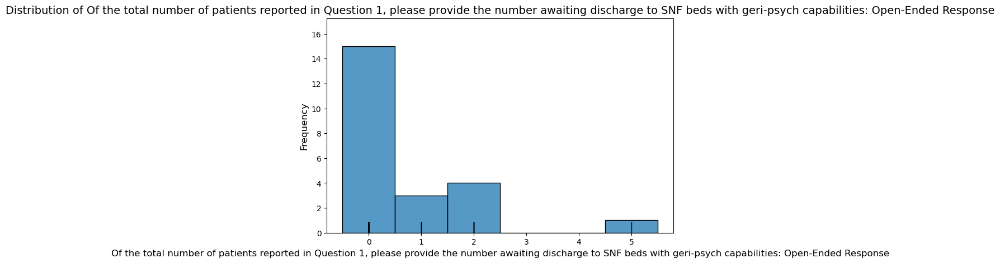

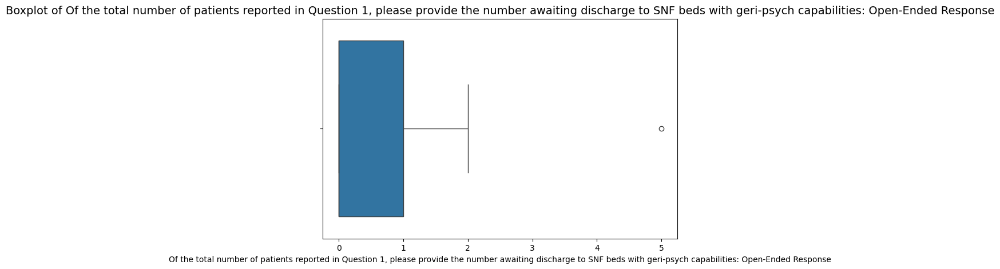

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge who require SNF care and tracheostomy and percutaneous endoscopic gastrostomy (ie. "trached & peged"): Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      0.260870
std       0.540824
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge who require SNF care and tracheostomy and percutaneous endoscopic gastrostomy (ie. "trached & peged"): Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge

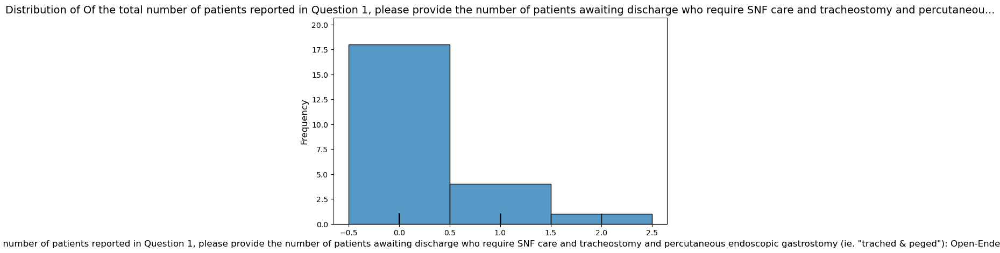

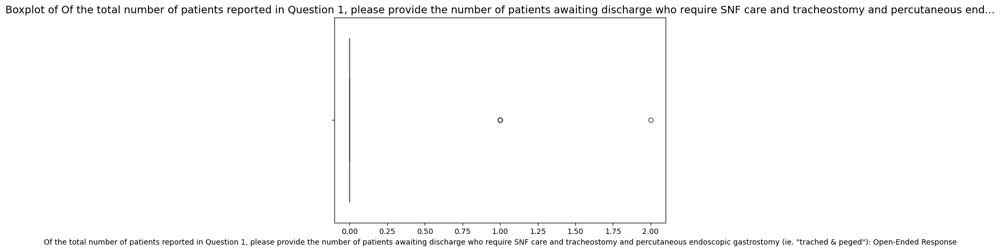

____________________________________________________________________________________________________
Attribute: Of the total number of patients report in Question 1, please provide the number of patients awaiting discharge who require SNF care and long-term management of a vent. Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      0.173913
std       0.491026
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total number of patients report in Question 1, please provide the number of patients awaiting discharge who require SNF care and long-term management of a vent. Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients report in Question 1, please provide the number of patients awaiting discharge who require SNF care and long-term management of a vent. Open-Ended Response:
___________________

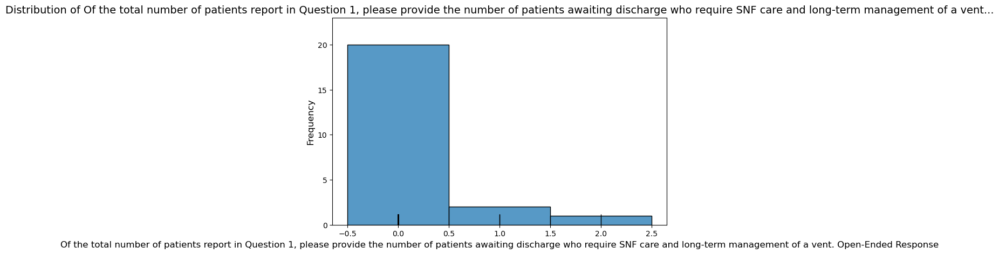

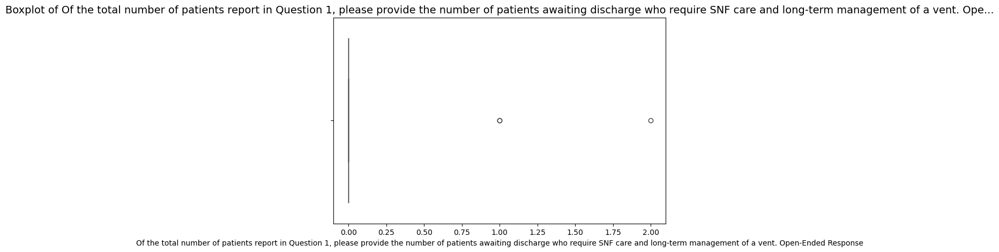

____________________________________________________________________________________________________
Attribute: Of the the total number of patients reported in Question 1, please provide the number of patients with bariatric concerns (>300lbs) awaiting discharge who require SNF care: Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      0.434783
std       0.992063
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       4.000000
Name: Of the the total number of patients reported in Question 1, please provide the number of patients with bariatric concerns (>300lbs) awaiting discharge who require SNF care: Open-Ended Response, dtype: float64


Frequency Distribution for Of the the total number of patients reported in Question 1, please provide the number of patients with bariatric concerns (>300lbs) awaiting discharge who require SNF care: Open-Ended Response:
____

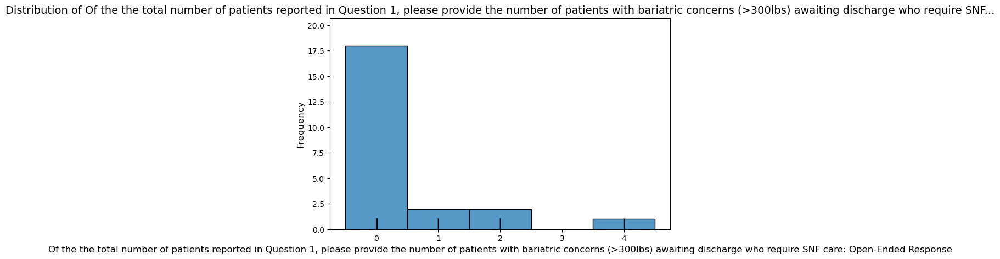

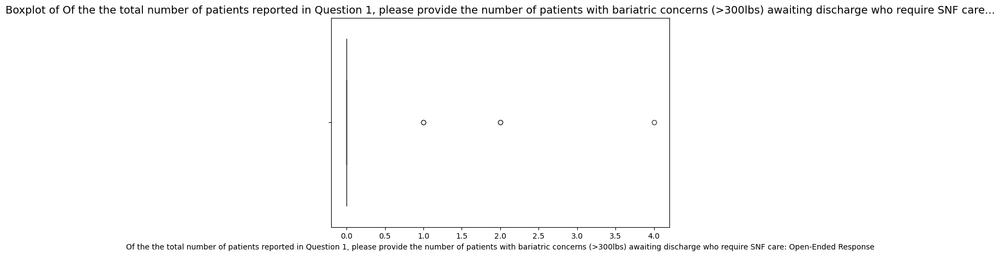

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients with dementia diagnoses awaiting discharge who require SNF care in a secure facility: Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      1.391304
std       1.644250
min       0.000000
25%       0.000000
50%       1.000000
75%       2.500000
max       5.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients with dementia diagnoses awaiting discharge who require SNF care in a secure facility: Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number of patients with dementia diagnoses awaiting discharge who require SNF care in a secure facility: Open

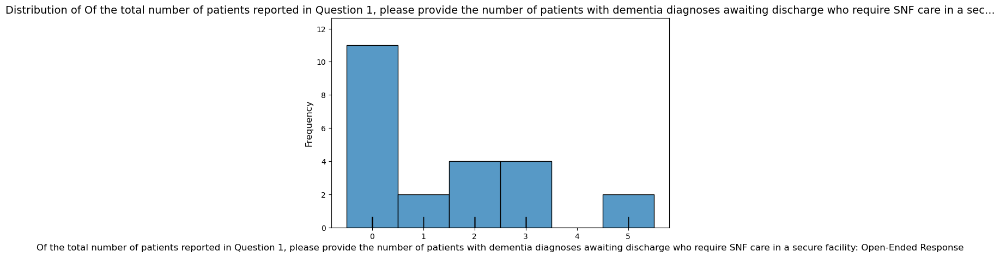

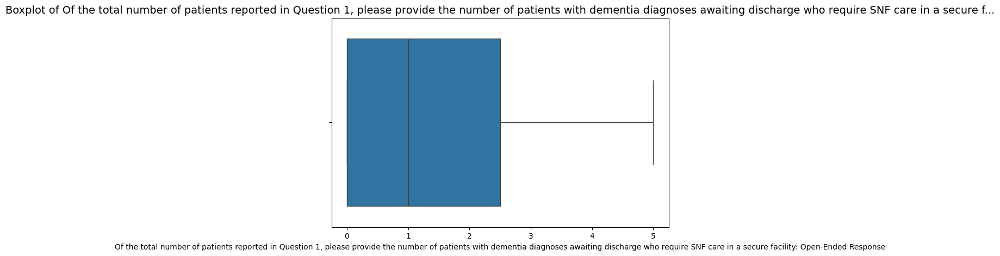

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients who are waiting for placement due to an inability to find an appropriate facility within their geographic area: Open-Ended Response
____________________________________________________________________________________________________
count    24.000000
mean      5.333333
std       7.636677
min       0.000000
25%       0.750000
50%       1.000000
75%       8.250000
max      24.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients who are waiting for placement due to an inability to find an appropriate facility within their geographic area: Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number of patients who are waiting for placement due to a

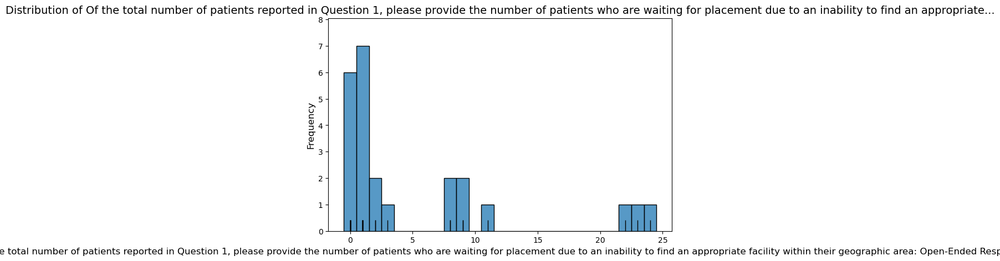

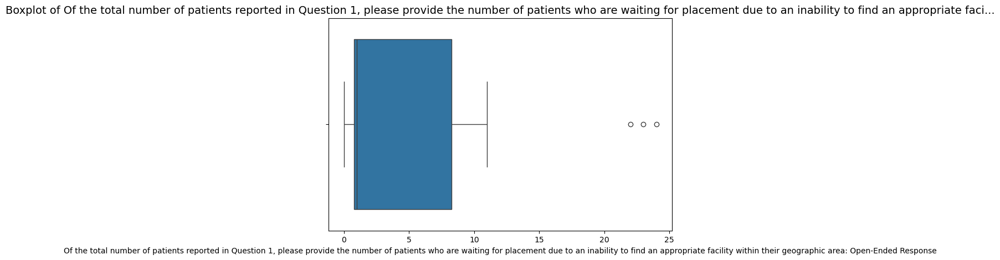

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    23.000000
mean      0.086957
std       0.288104
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Skilled Nursing Facility (SNF):, dtype: float64


Frequency

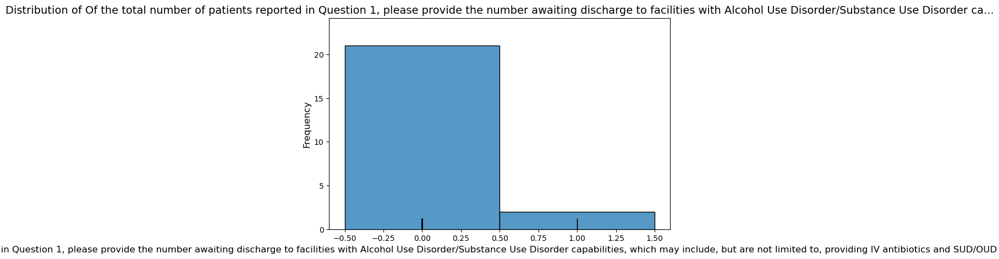

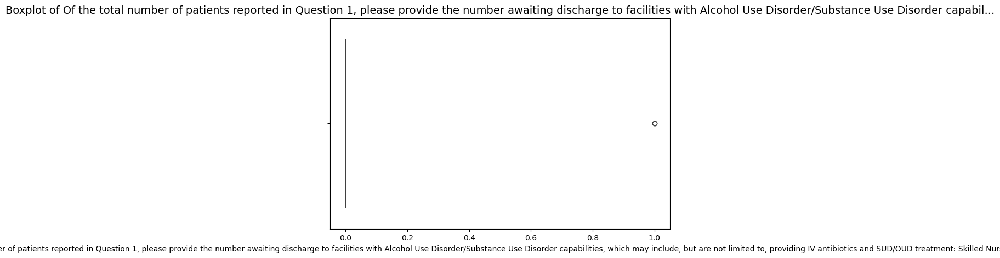

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    21.000000
mean      0.142857
std       0.478091
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Long Term Care Hospital (LTC):, dtype: float64


Frequency D

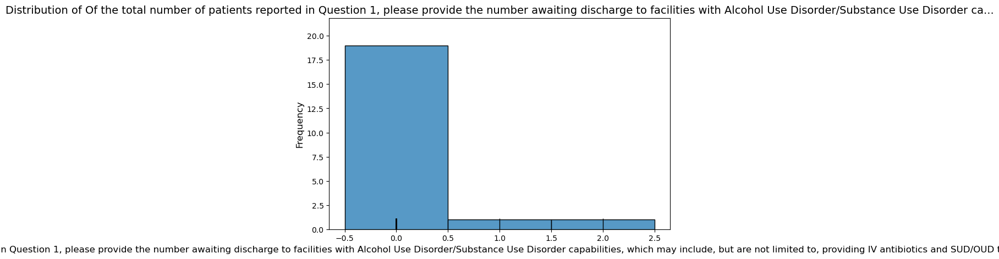

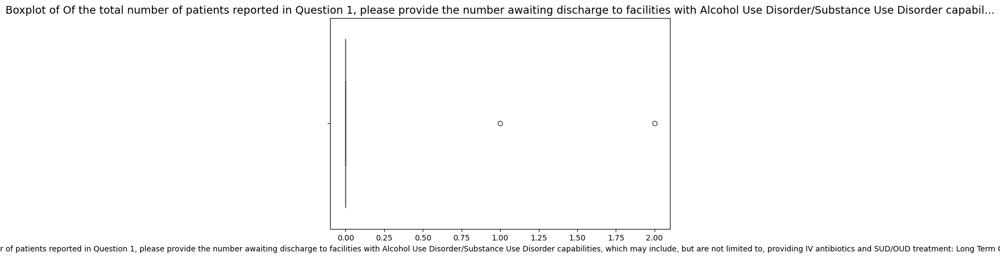

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    22.000000
mean      0.272727
std       0.767297
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       3.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Residential Care Facility (RCF):, dtype: float64


Frequen

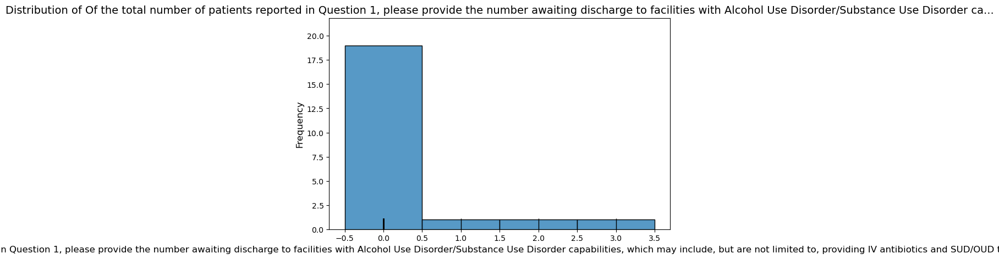

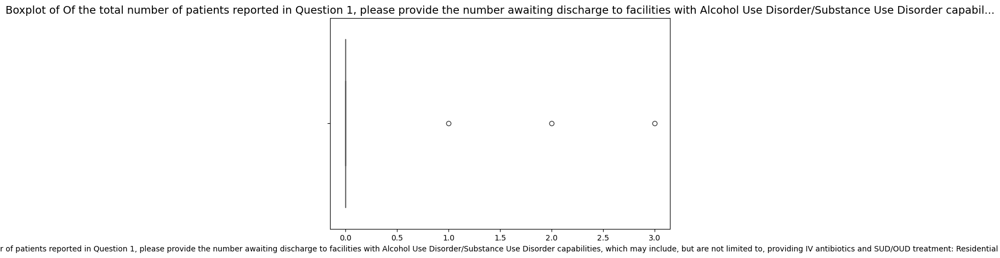

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Home Health:
____________________________________________________________________________________________________
count    21.000000
mean      0.047619
std       0.218218
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Home Health:, dtype: float64


Frequency Distribution for Of the total number 

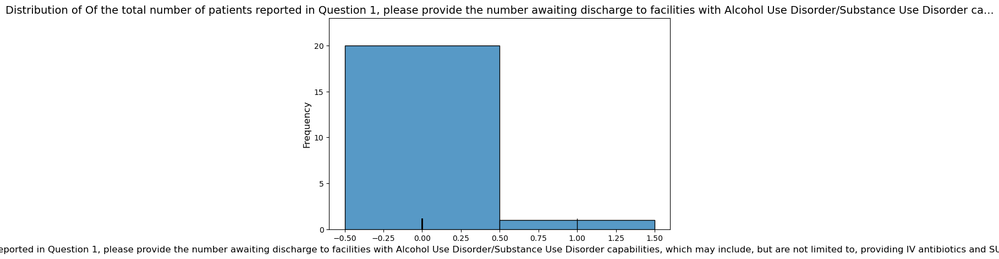

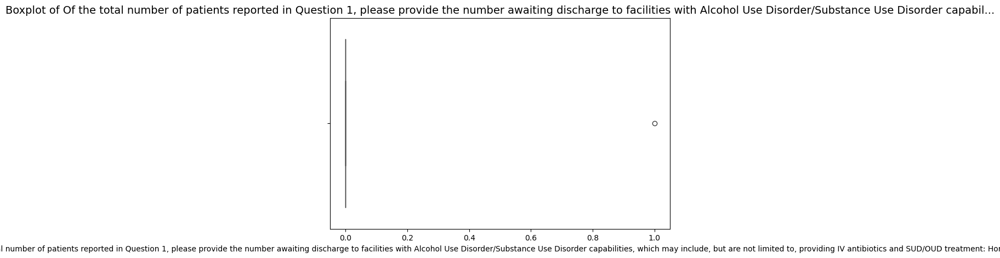

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    23.000000
mean      0.086957
std       0.288104
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total number of p

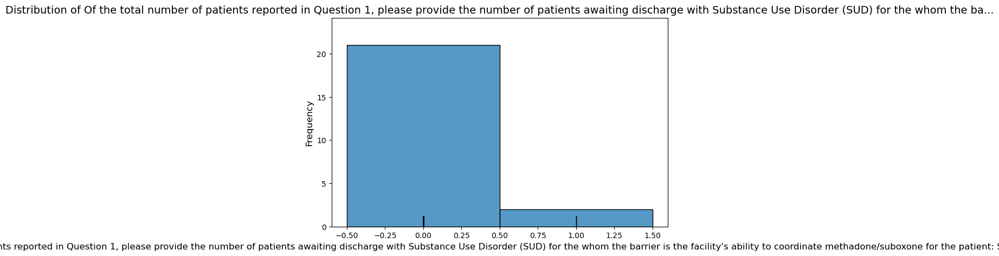

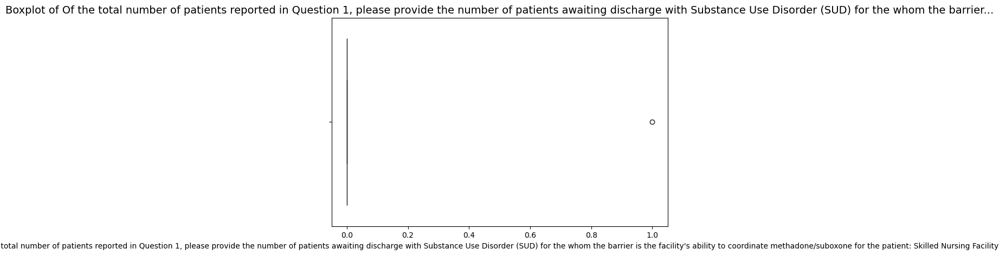

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    21.000000
mean      0.095238
std       0.300793
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total number of pat

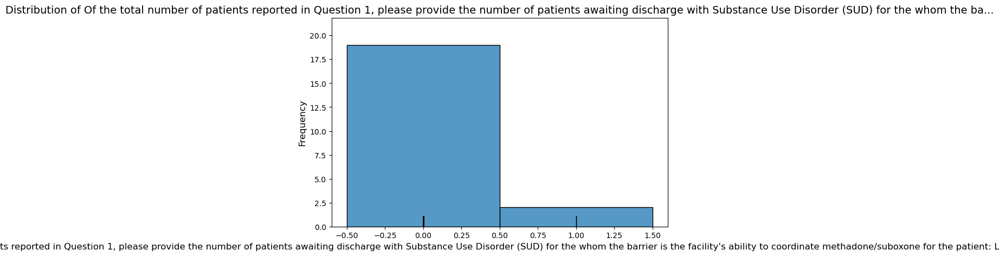

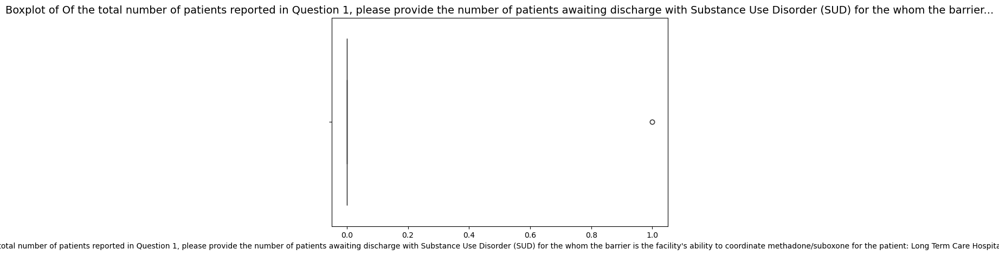

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    22.000000
mean      0.045455
std       0.213201
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total number of

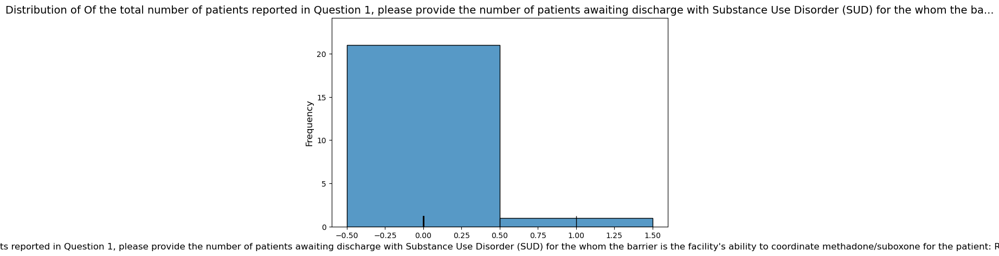

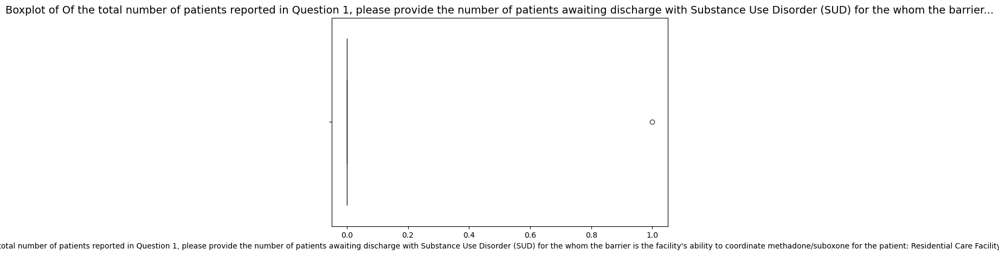

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Home Health:
____________________________________________________________________________________________________
count    22.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Home Health:, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number of patients awaiting

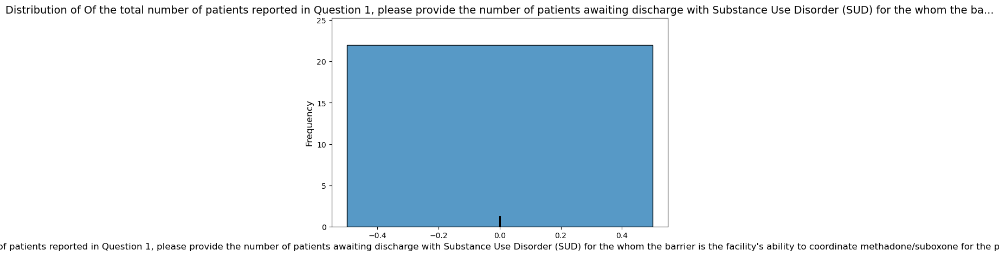

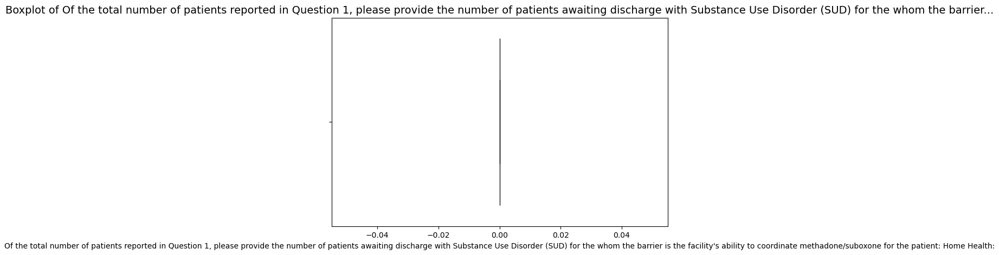

____________________________________________________________________________________________________
Attribute: Of the number of patients awaiting discharge to SNFs reported in Question 1, what is the number of patients with confirmed* COVID-19?* Confirmed COVID-19: Patients who had a positive COVID-19 PCR test or antigen test. Please include both patients who were admitted with a primary COVID-19 diagnosis, as well as patients with an incidental COVID diagnosis (i.e., admitted for a Maine Hospital Association Patient Throughput Survey Section 1: Questions Related to Patients Awaiting Discharge to SNF, LTC, RCF, and Home Health different reason but subsequently tested positive). Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      0.391304
std       0.891328
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       3.000000
Name: Of the number of patients awaitin

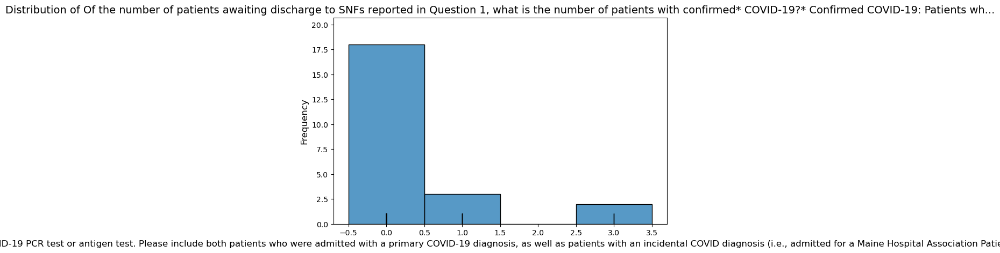

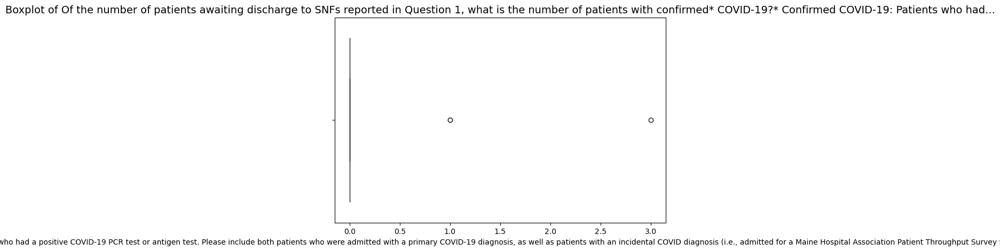

____________________________________________________________________________________________________
Attribute: Of the number of patients awaiting discharge to SNFs reported in Question 1, what is the total number of patients who are COVID-19 recovered awaiting discharge to SNFs: Open-Ended Response
____________________________________________________________________________________________________
count    23.000000
mean      0.217391
std       0.421741
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the number of patients awaiting discharge to SNFs reported in Question 1, what is the total number of patients who are COVID-19 recovered awaiting discharge to SNFs: Open-Ended Response, dtype: float64


Frequency Distribution for Of the number of patients awaiting discharge to SNFs reported in Question 1, what is the total number of patients who are COVID-19 recovered awaiting discharge to SNFs: Open-Ended Response:
________________

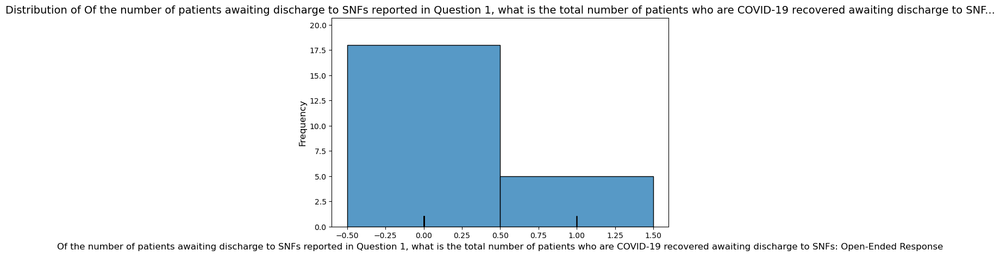

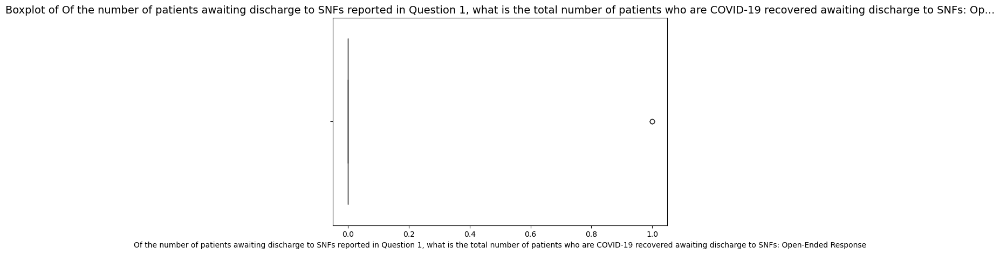

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Denial of request for authorization from insurer
____________________________________________________________________________________________________
count    25.000000
mean      4.840000
std       3.171225
min       1.000000
25%       2.000000
50%       4.000000
75%       5.000000
max      11.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Denial of request fo

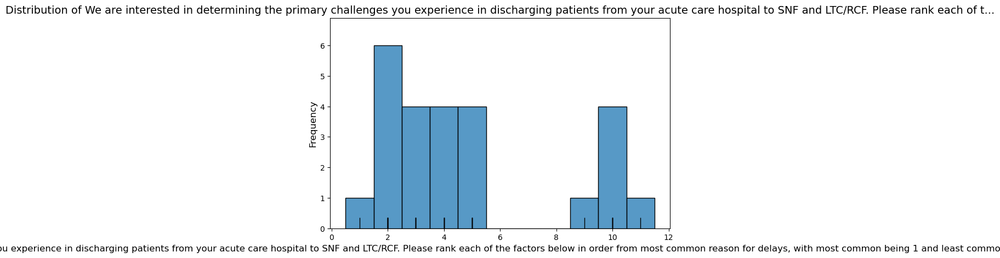

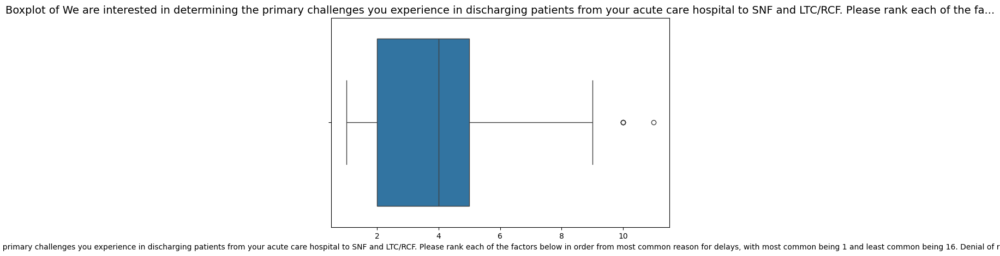

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Delayed response from insurer
____________________________________________________________________________________________________
count    25.000000
mean      5.280000
std       4.026164
min       1.000000
25%       2.000000
50%       4.000000
75%       7.000000
max      14.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Delayed response from insurer, dtype: f

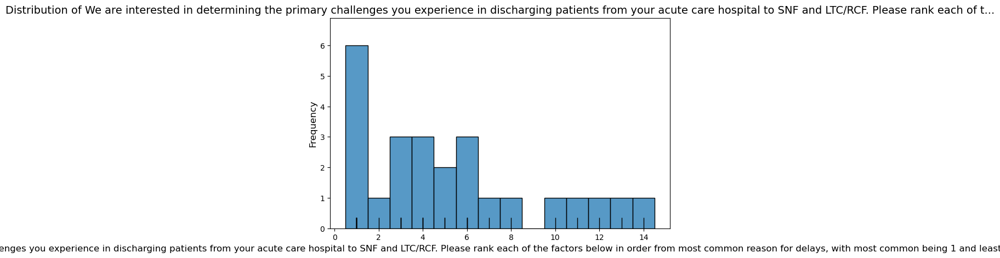

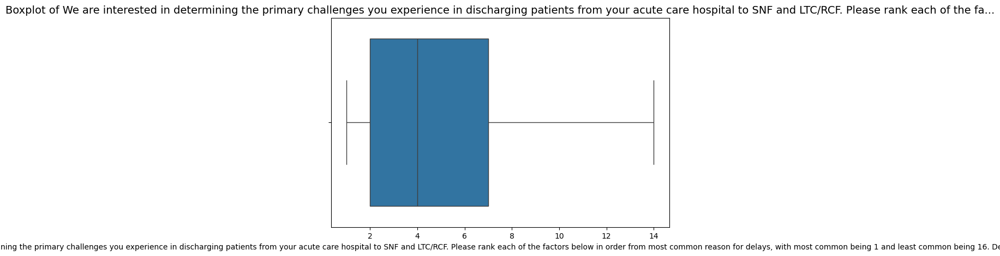

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Inadequate post-acute network
____________________________________________________________________________________________________
count    25.000000
mean      5.680000
std       3.325658
min       1.000000
25%       3.000000
50%       5.000000
75%       8.000000
max      12.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Inadequate post-acute network, dtype: f

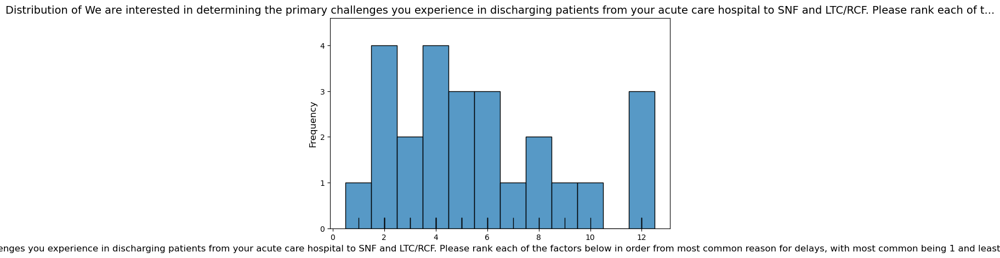

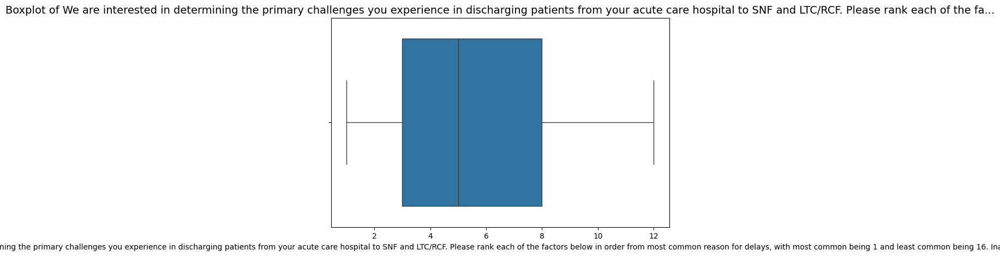

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Insurer does not provide post-acute coverage
____________________________________________________________________________________________________
count    25.000000
mean      8.400000
std       3.796929
min       1.000000
25%       6.000000
50%       8.000000
75%      11.000000
max      15.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Insurer does not provide

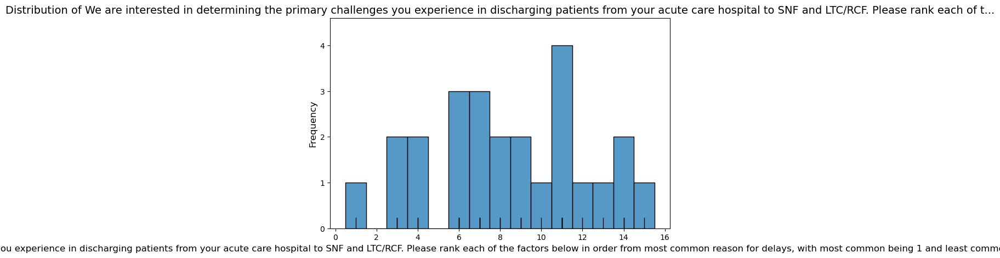

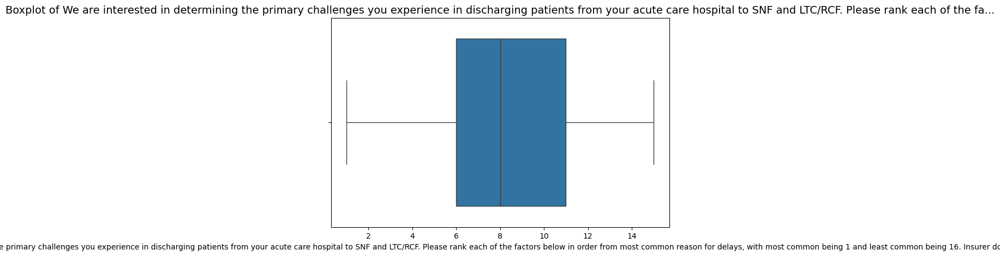

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. COVID+ status
____________________________________________________________________________________________________
count    25.000000
mean     10.960000
std       3.984135
min       4.000000
25%       7.000000
50%      12.000000
75%      14.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. COVID+ status, dtype: float64


Frequency Distribution 

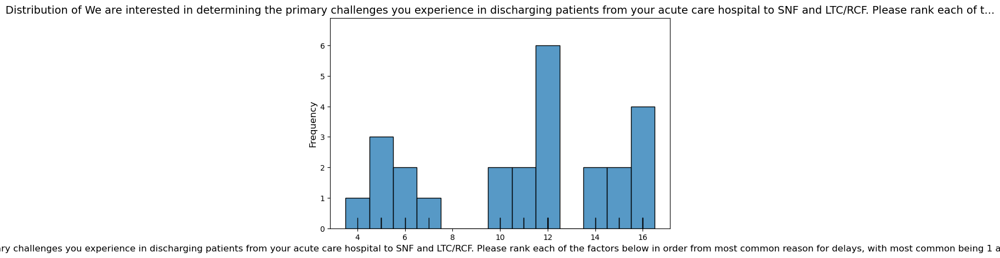

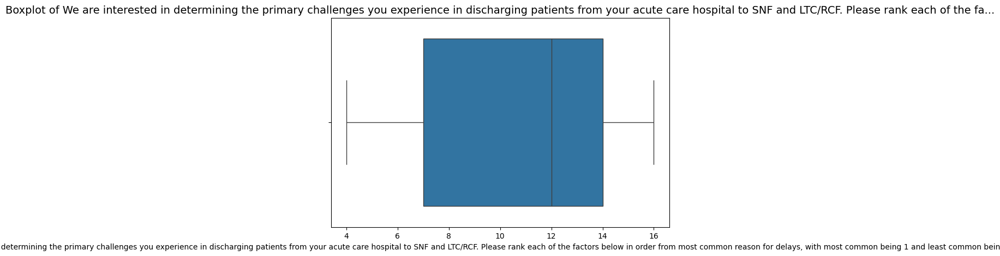

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. COVID recovered status
____________________________________________________________________________________________________
count    25.00000
mean     12.20000
std       3.21455
min       6.00000
25%      11.00000
50%      13.00000
75%      15.00000
max      16.00000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. COVID recovered status, dtype: float64


Frequency Dis

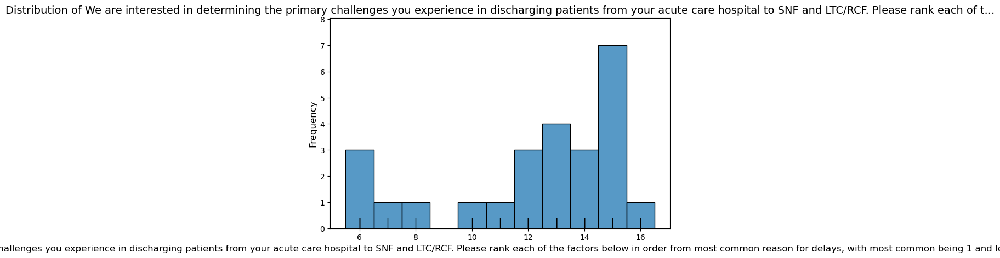

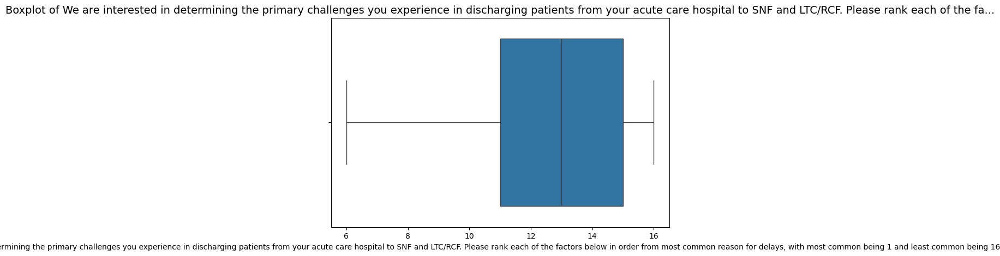

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Unvaccinated status
____________________________________________________________________________________________________
count    25.000000
mean     13.240000
std       2.919475
min       7.000000
25%      12.000000
50%      14.000000
75%      16.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Unvaccinated status, dtype: float64


Frequency D

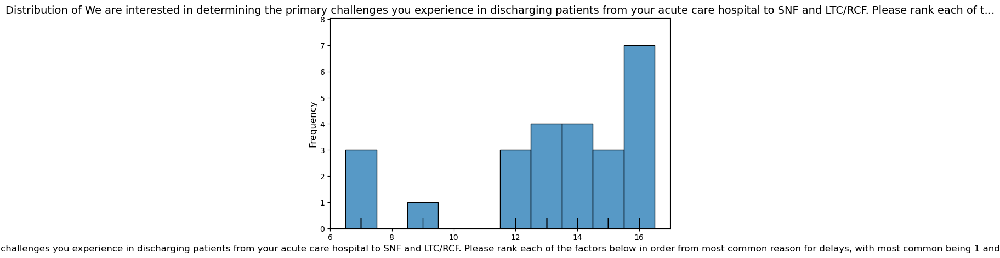

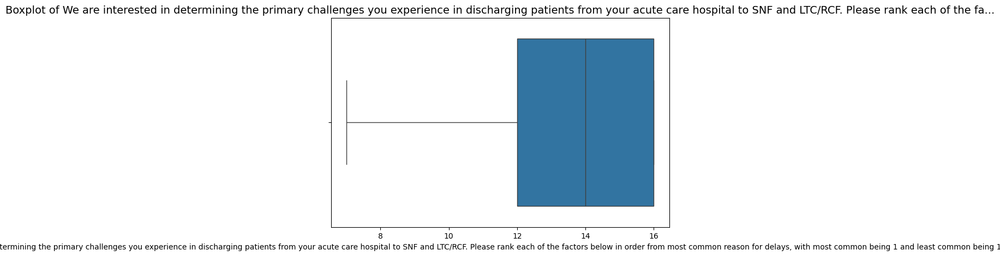

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Staffing/capacity constraints at post-acute care facilities
____________________________________________________________________________________________________
count    25.000000
mean      5.560000
std       3.536477
min       1.000000
25%       3.000000
50%       4.000000
75%       8.000000
max      15.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Staffing/

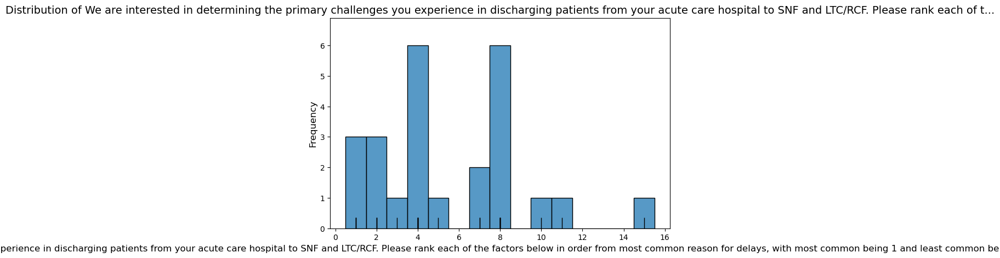

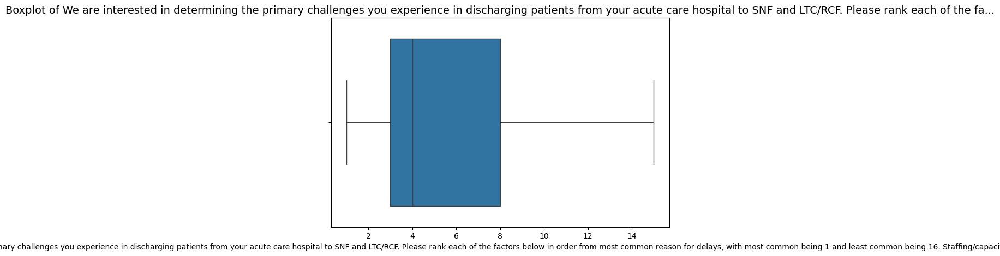

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Need for specialized BH/SUD services
____________________________________________________________________________________________________
count    25.000000
mean      8.640000
std       3.806573
min       1.000000
25%       6.000000
50%       9.000000
75%      12.000000
max      14.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Need for specialized BH/SUD serv

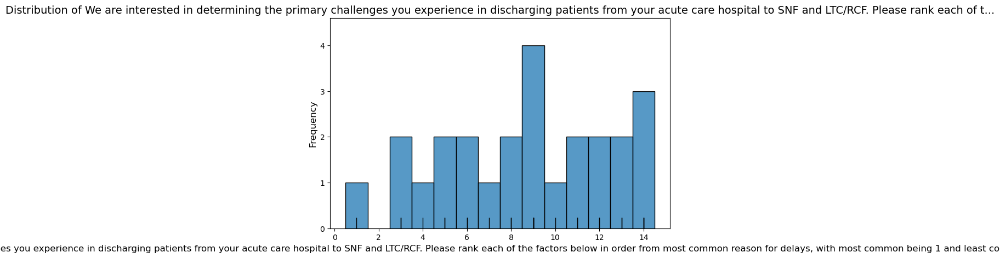

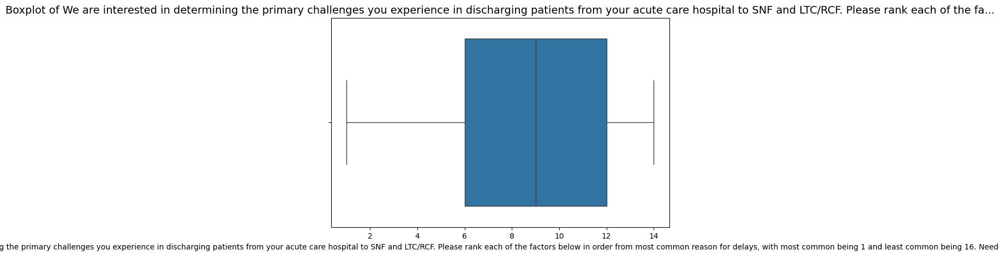

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Transportation unavailable
____________________________________________________________________________________________________
count    25.000000
mean      9.560000
std       3.001111
min       4.000000
25%       7.000000
50%      10.000000
75%      10.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Transportation unavailable, dtype: float64

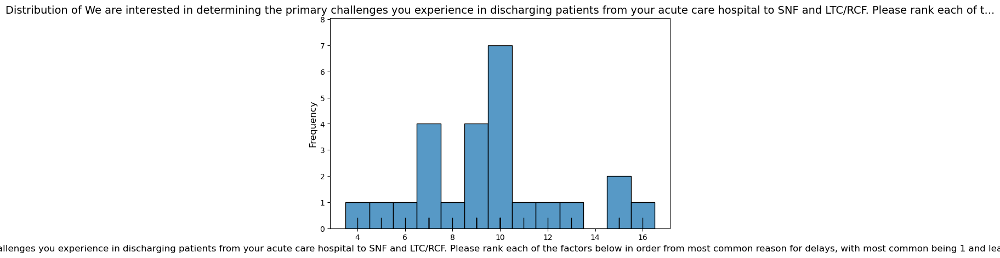

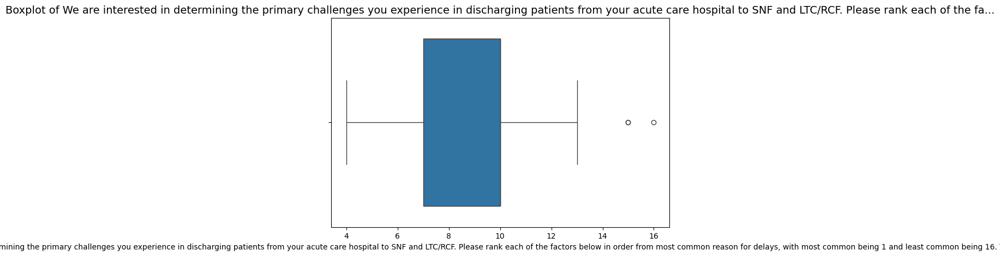

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of facility within patients desired geographic area.
____________________________________________________________________________________________________
count    25.000000
mean      6.000000
std       3.829708
min       1.000000
25%       3.000000
50%       5.000000
75%       9.000000
max      13.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of fac

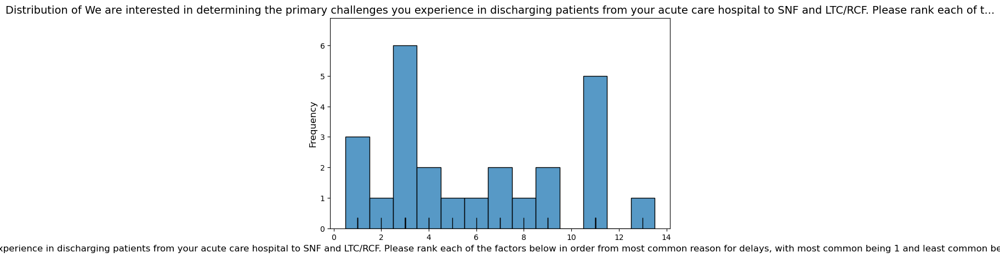

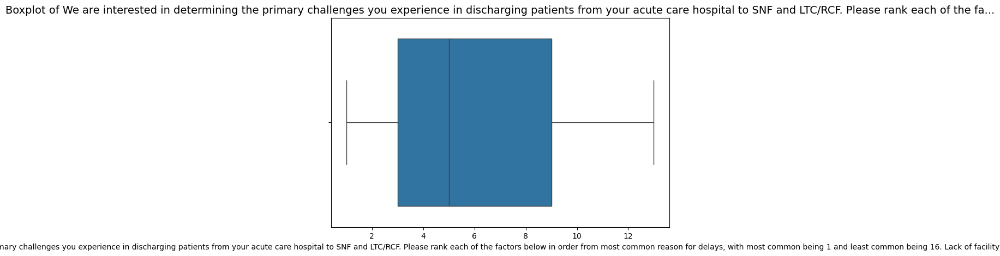

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of access to necessary community services
____________________________________________________________________________________________________
count    25.000000
mean      8.280000
std       3.780653
min       1.000000
25%       5.000000
50%       8.000000
75%      12.000000
max      15.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of access to nece

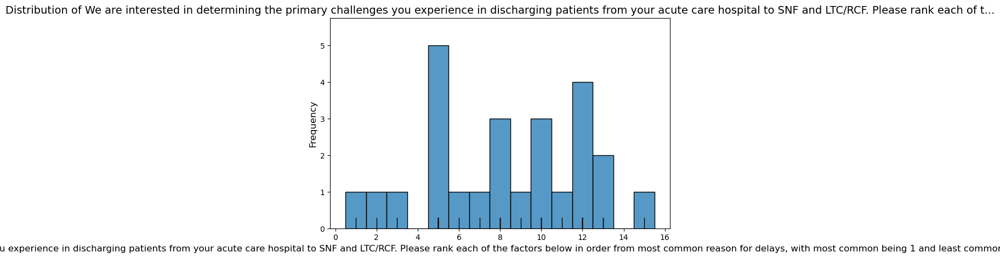

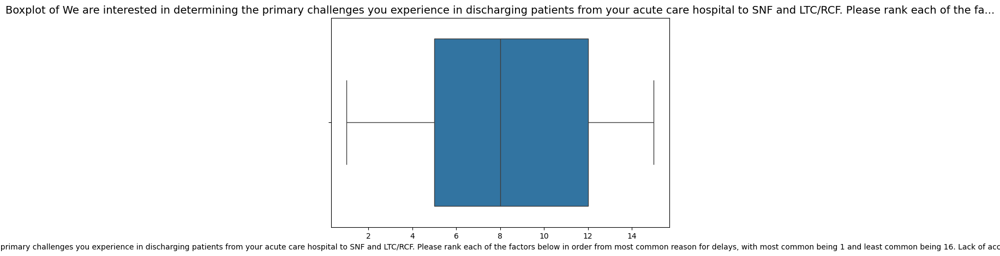

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of guardianship/conservatorship/healthcare proxy
____________________________________________________________________________________________________
count    25.000000
mean      7.520000
std       3.720663
min       2.000000
25%       5.000000
50%       8.000000
75%      10.000000
max      13.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of guardia

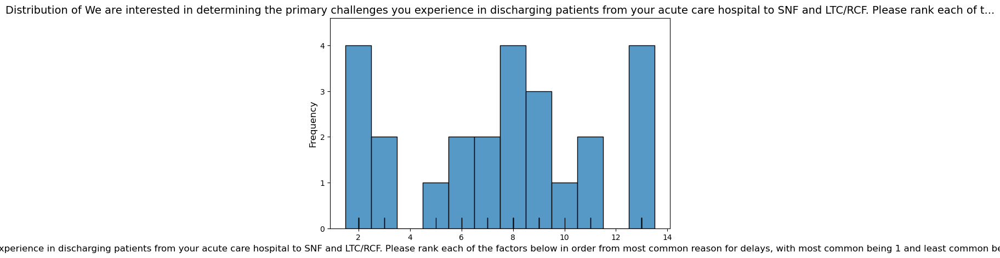

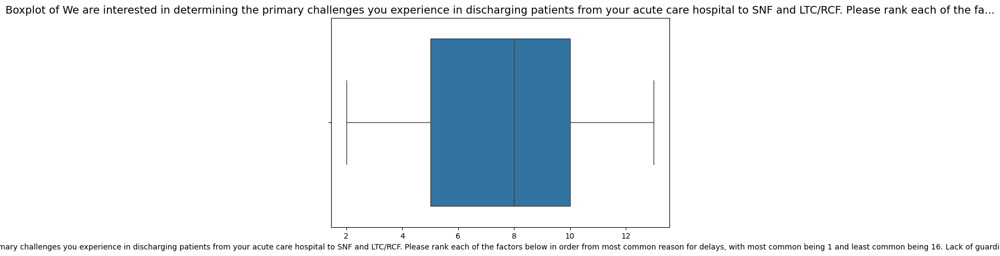

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of secondary insurance
____________________________________________________________________________________________________
count    25.000000
mean     11.640000
std       3.729164
min       1.000000
25%      10.000000
50%      13.000000
75%      14.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of secondary insurance, dtype: float

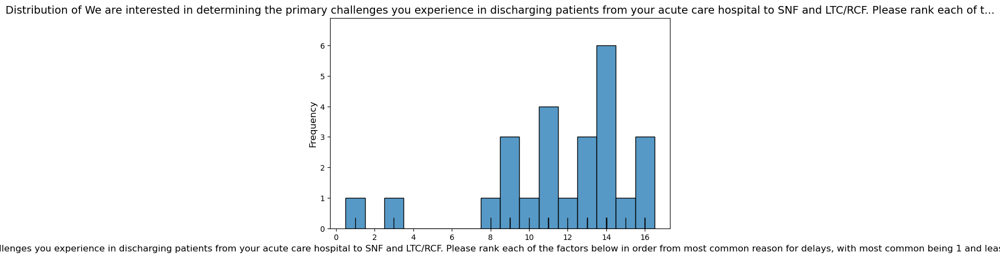

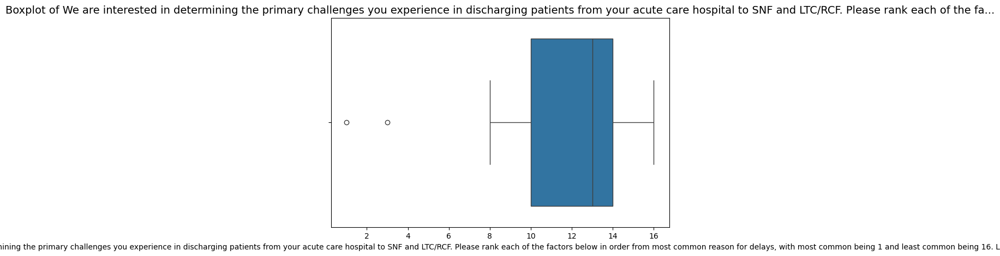

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Waiting for LTC Maine Care (Medicaid) approval
____________________________________________________________________________________________________
count    25.000000
mean      5.280000
std       4.826317
min       1.000000
25%       2.000000
50%       4.000000
75%       7.000000
max      15.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Waiting for LTC Maine 

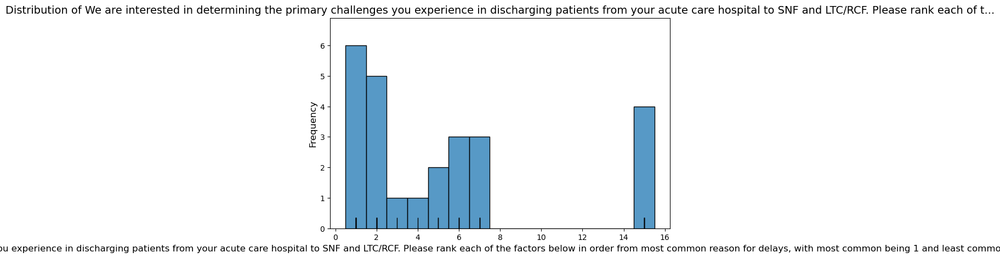

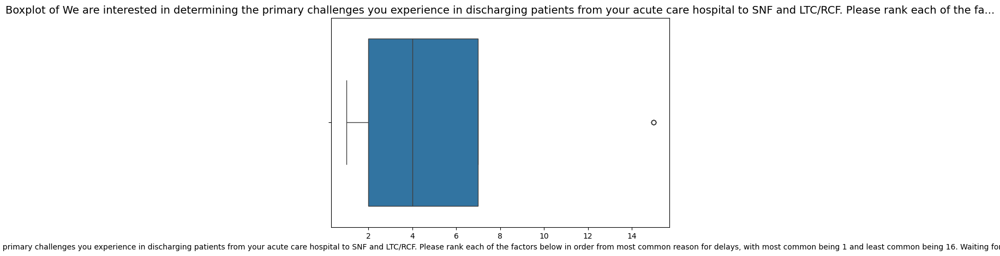

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Patient has criminal history and/or is a registered sex offender
____________________________________________________________________________________________________
count    25.000000
mean     12.920000
std       3.936157
min       1.000000
25%      10.000000
50%      14.000000
75%      16.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Pati

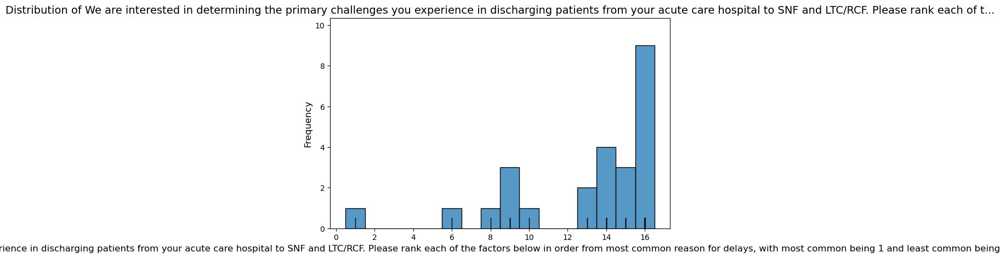

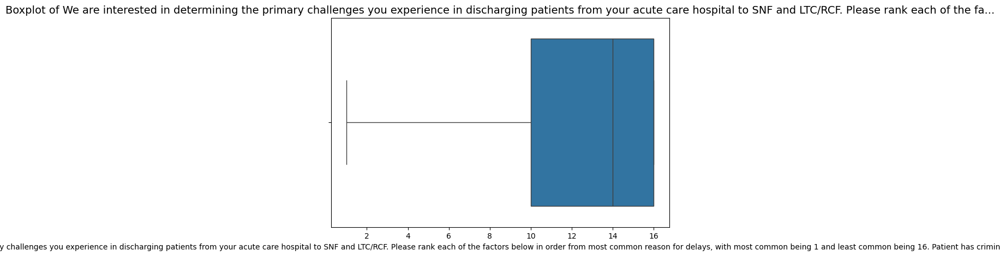

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

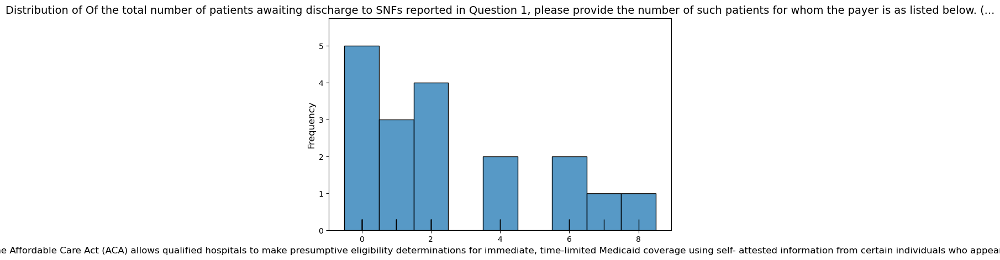

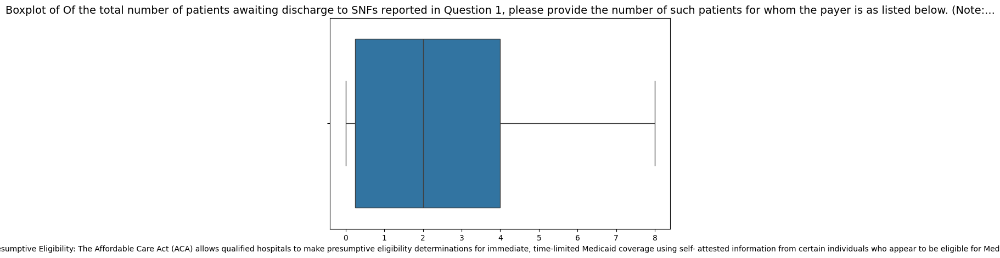

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

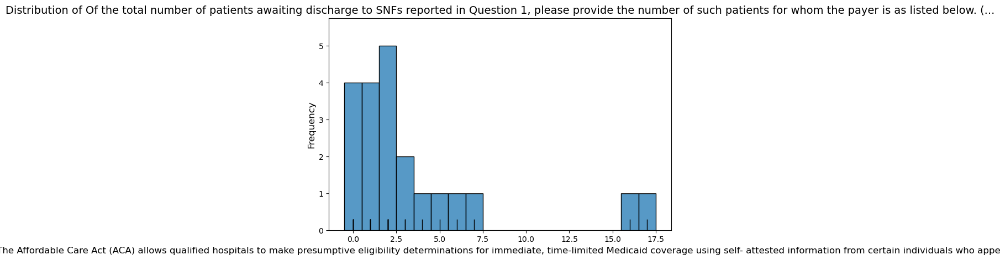

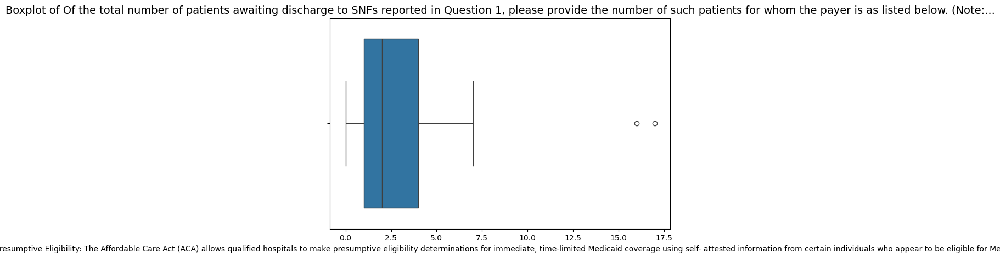

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

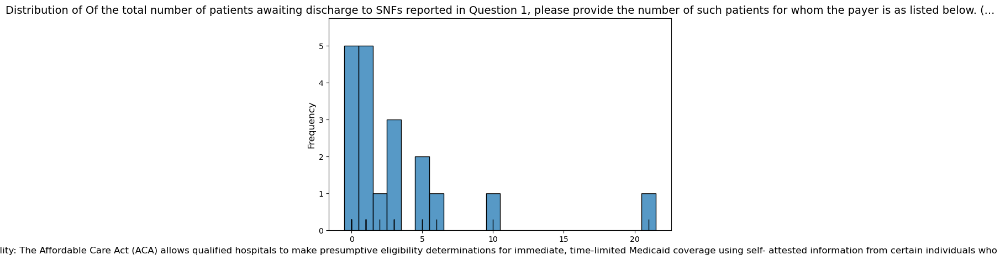

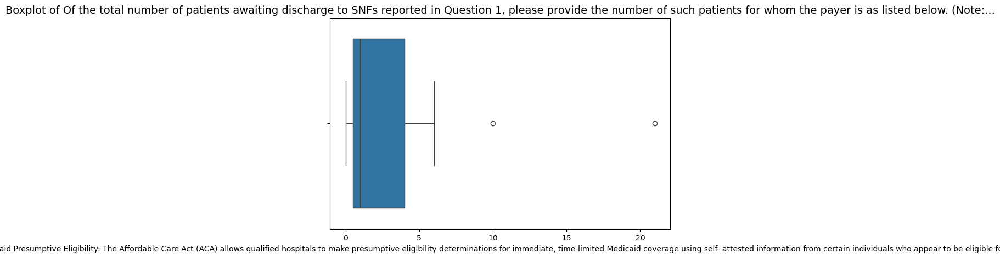

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

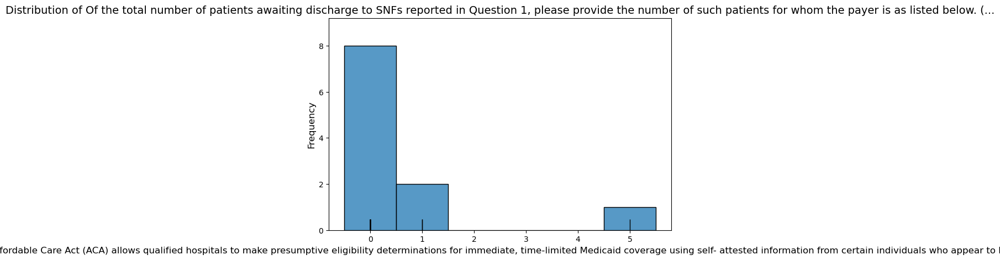

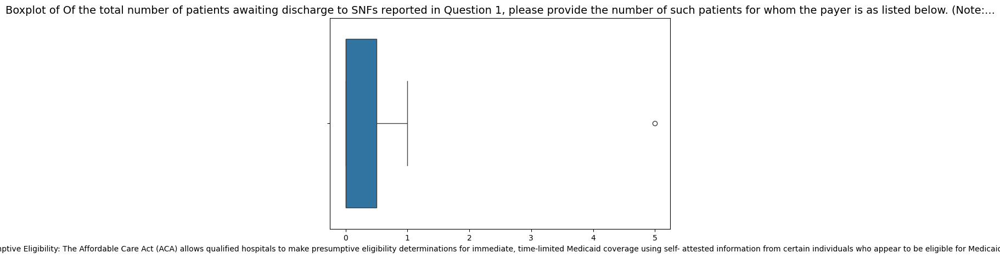

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

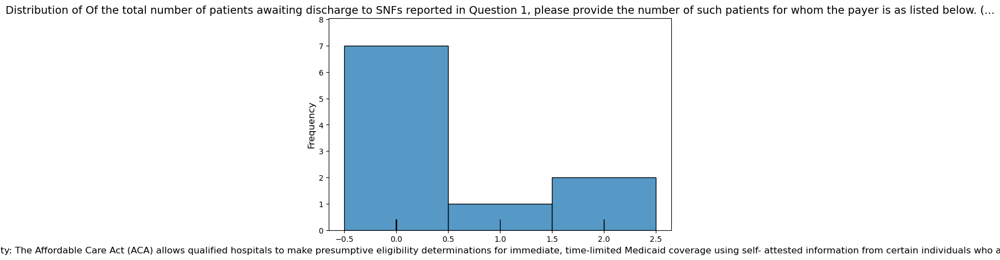

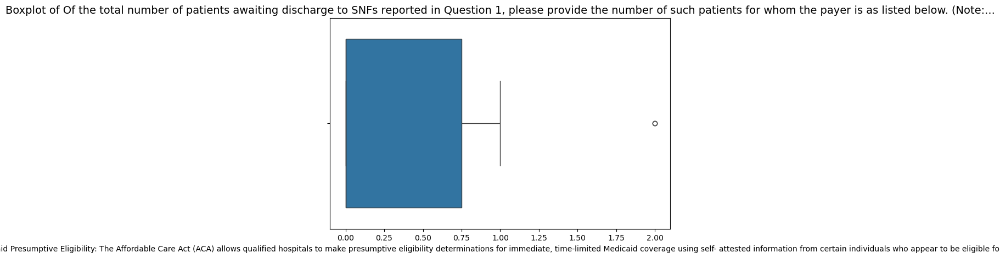

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

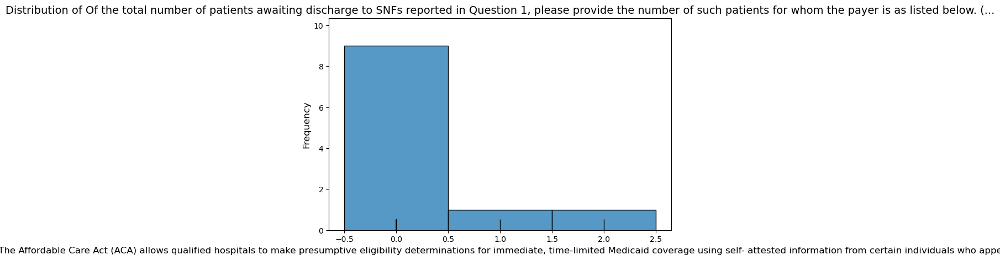

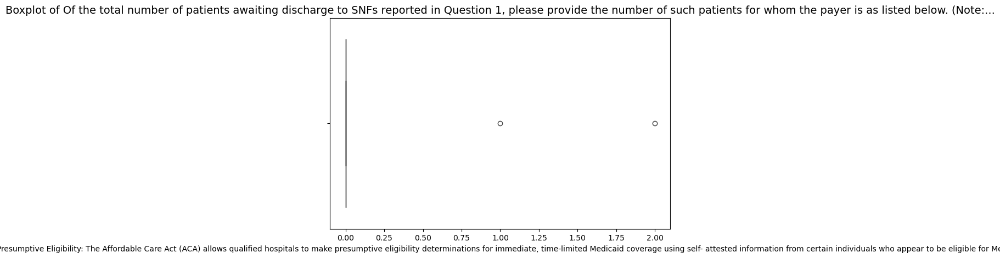

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

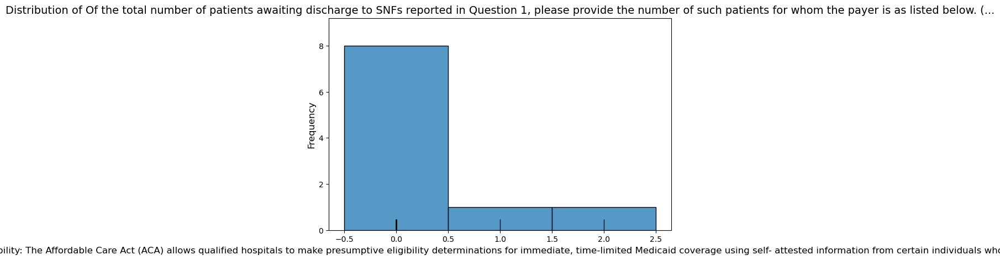

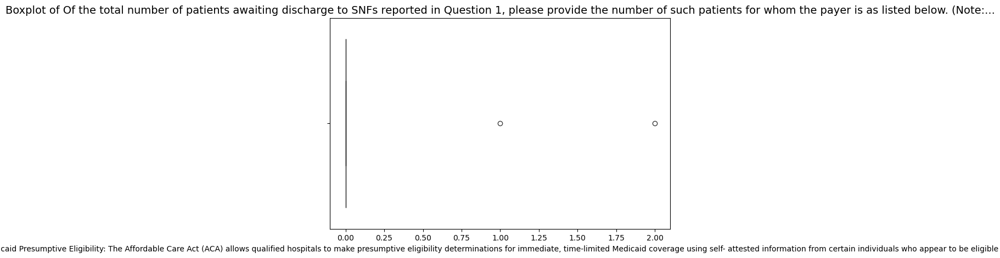

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

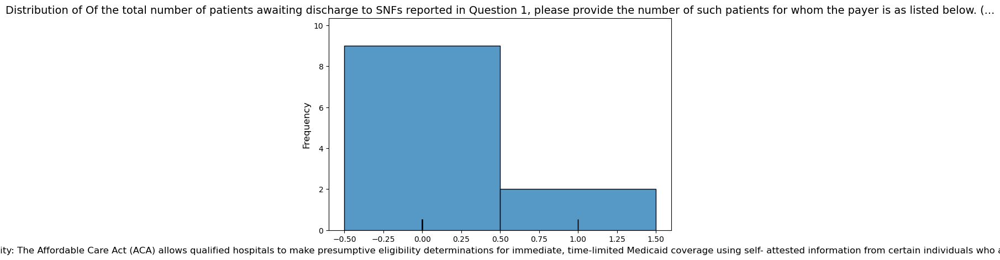

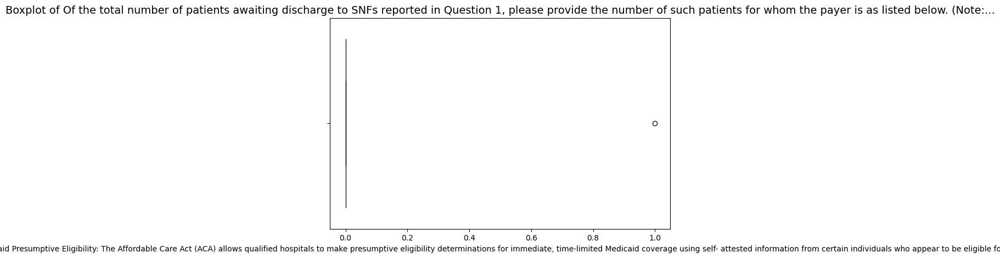

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

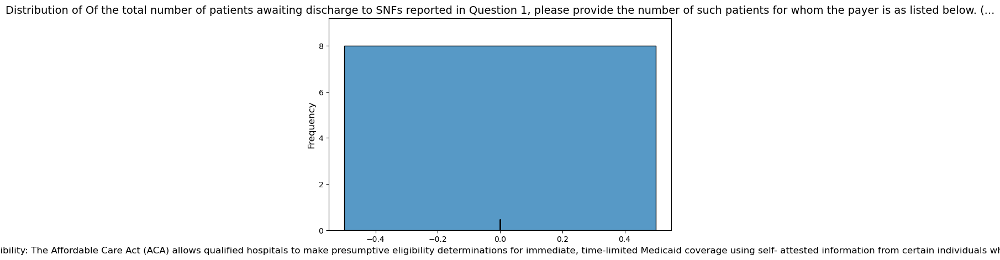

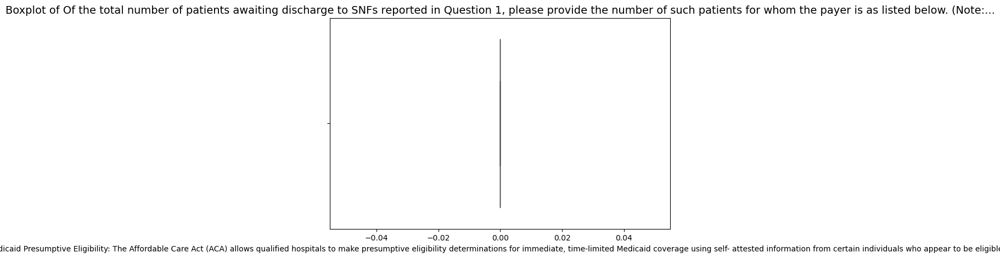

____________________________________________________________________________________________________
Attribute: Please provide the number of homeless or housing unstable inpatients awaiting discharge to shelters: Open-Ended Response
____________________________________________________________________________________________________
count    21.000000
mean      1.476190
std       3.385543
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      13.000000
Name: Please provide the number of homeless or housing unstable inpatients awaiting discharge to shelters: Open-Ended Response, dtype: float64


Frequency Distribution for Please provide the number of homeless or housing unstable inpatients awaiting discharge to shelters: Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Please provide the number of homeless or housin...                            
0.0        

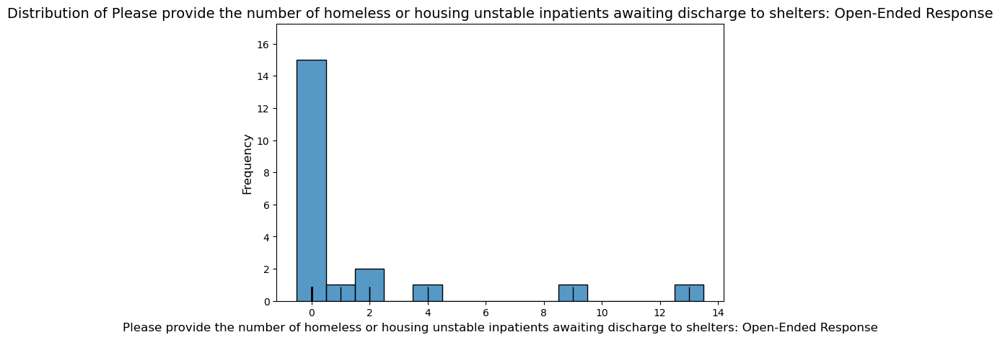

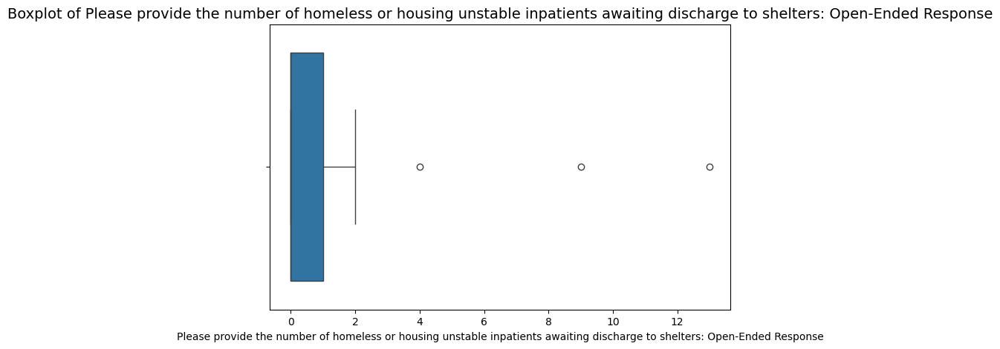

____________________________________________________________________________________________________
Attribute: Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting discharge to shelters), please provide the number of patients that have been awaiting discharge for more than 7 days: Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean      0.800000
std       1.852452
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       8.000000
Name: Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting discharge to shelters), please provide the number of patients that have been awaiting discharge for more than 7 days: Open-Ended Response, dtype: float64


Frequency Distribution for Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable i

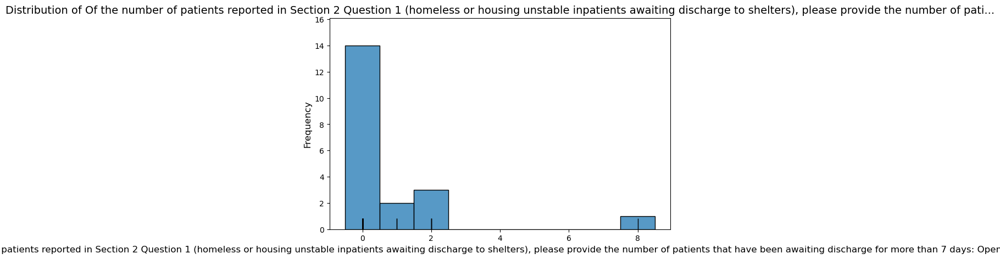

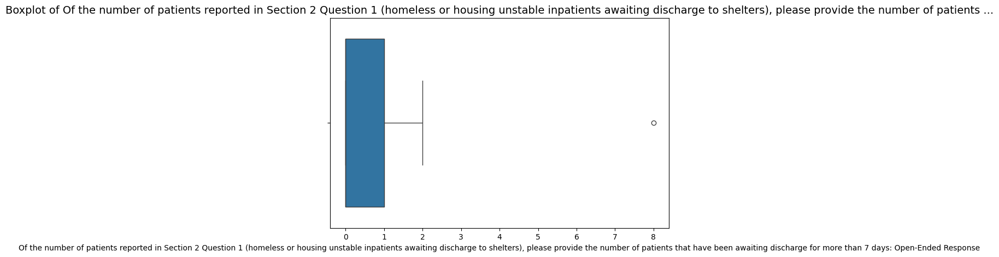

____________________________________________________________________________________________________
Attribute: Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting discharge to shelters), how many patients have behavioral health issues or substance use disorder (SUD)? Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean      1.900000
std       3.537766
min       0.000000
25%       0.000000
50%       0.000000
75%       1.250000
max      13.000000
Name: Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting discharge to shelters), how many patients have behavioral health issues or substance use disorder (SUD)? Open-Ended Response, dtype: float64


Frequency Distribution for Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting dischar

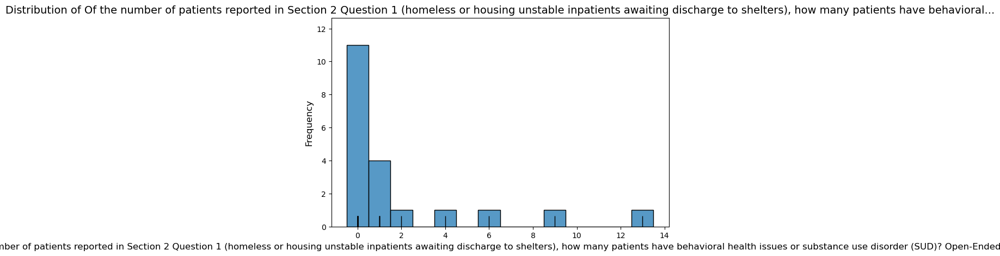

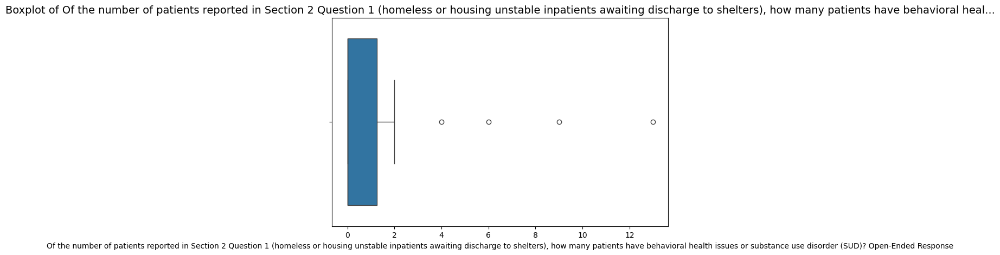

____________________________________________________________________________________________________
Attribute: Please provide the number of patients who are medically cleared for discharge (to any setting) who remain in your facility SOLELY due to lack of transportation (i.e., bed available, transportation unavailable): Open-Ended Response
____________________________________________________________________________________________________
count    21.000000
mean      0.428571
std       1.535299
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       7.000000
Name: Please provide the number of patients who are medically cleared for discharge (to any setting) who remain in your facility SOLELY due to lack of transportation (i.e., bed available, transportation unavailable): Open-Ended Response, dtype: float64


Frequency Distribution for Please provide the number of patients who are medically cleared for discharge (to any setting) who remain in your facility

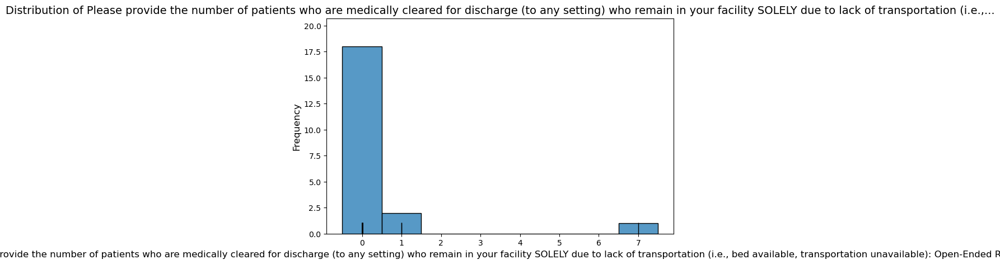

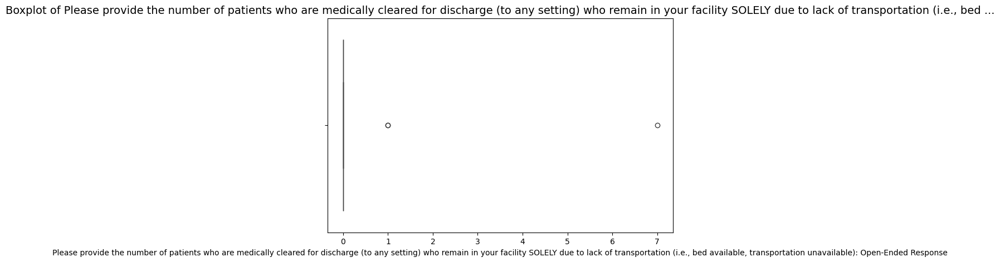

____________________________________________________________________________________________________
Attribute: For patients who are medically cleared for discharge but awaiting transportation, what is the maximum time that a patient at your facility has waited for transportation in the past two weeks? Open-Ended Response
____________________________________________________________________________________________________
count    21.000000
mean      1.619048
std       3.570381
min       0.000000
25%       0.000000
50%       0.000000
75%       2.000000
max      12.000000
Name: For patients who are medically cleared for discharge but awaiting transportation, what is the maximum time that a patient at your facility has waited for transportation in the past two weeks? Open-Ended Response, dtype: float64


Frequency Distribution for For patients who are medically cleared for discharge but awaiting transportation, what is the maximum time that a patient at your facility has waited for transp

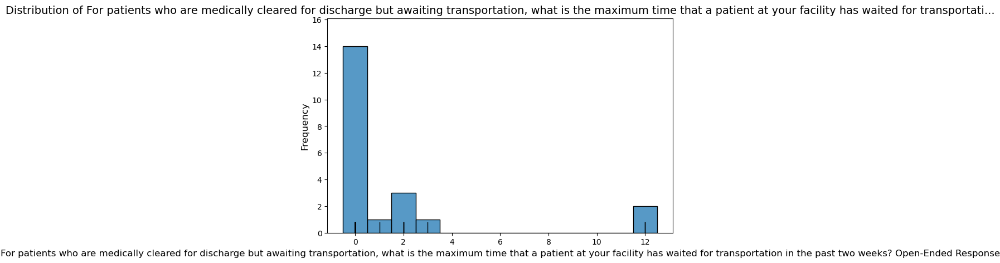

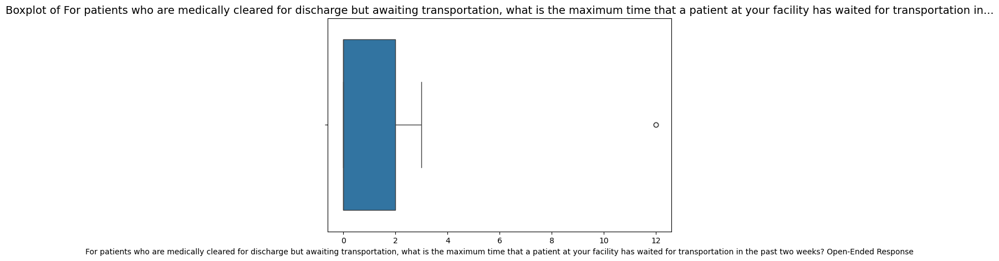

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to any setting, please provide the number of patients unable to find a bed due to lack of reimbursement for outpatient hemodialysis transportation and/or lack of available dialysis treatment chair: Open-Ended Response
____________________________________________________________________________________________________
count    21.000000
mean      0.238095
std       0.436436
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients awaiting discharge to any setting, please provide the number of patients unable to find a bed due to lack of reimbursement for outpatient hemodialysis transportation and/or lack of available dialysis treatment chair: Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients awaiting disch

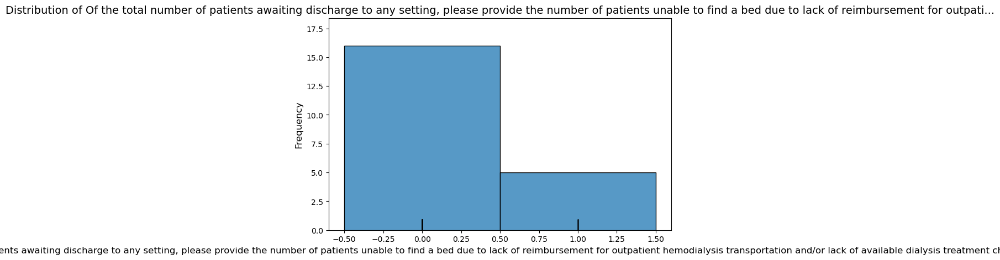

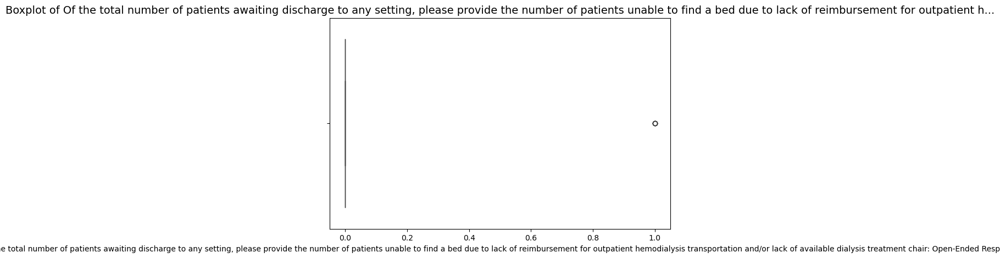

____________________________________________________________________________________________________
Attribute: How many licensed ED beds are in your hospital? Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean     23.263158
std      22.047530
min       0.000000
25%      10.000000
50%      15.000000
75%      32.000000
max      92.000000
Name: How many licensed ED beds are in your hospital? Open-Ended Response, dtype: float64


Frequency Distribution for How many licensed ED beds are in your hospital? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
How many licensed ED beds are in your hospital?...                            
10.0                                                    3                 15.8
45.0                                                    2                 10.5
32.0        

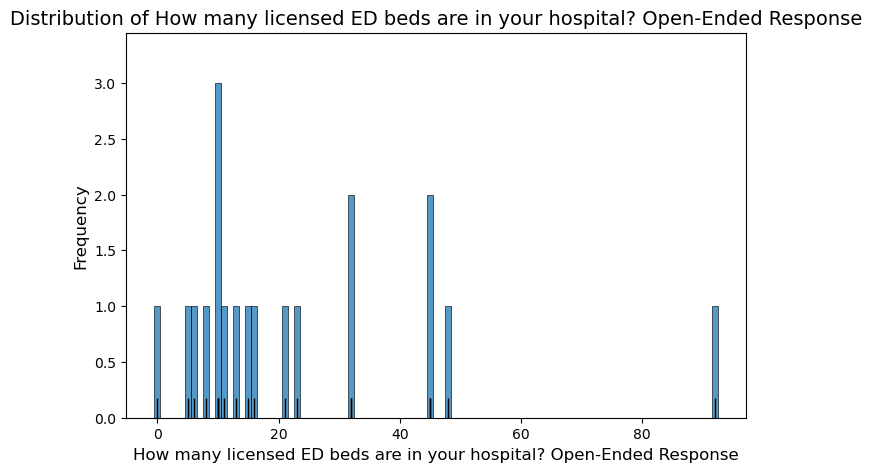

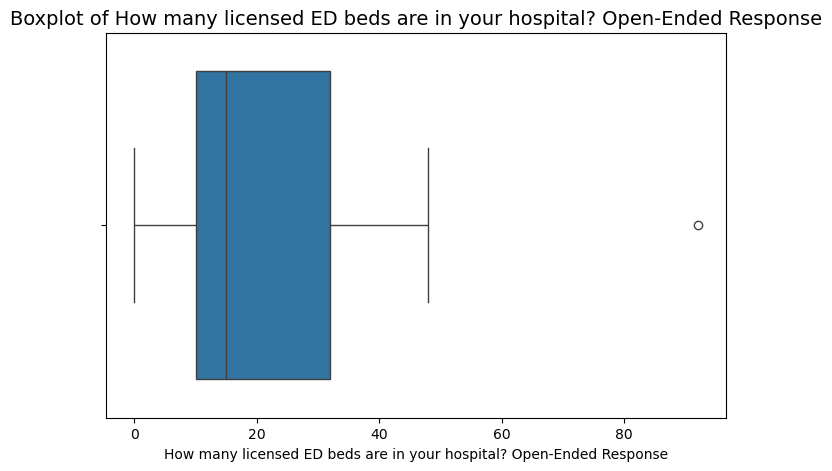

____________________________________________________________________________________________________
Attribute: How many of your licensed ED beds are staffed in your hospital? Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean     18.600000
std      13.339297
min       0.000000
25%       9.500000
50%      14.000000
75%      27.500000
max      45.000000
Name: How many of your licensed ED beds are staffed in your hospital? Open-Ended Response, dtype: float64


Frequency Distribution for How many of your licensed ED beds are staffed in your hospital? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
How many of your licensed ED beds are staffed i...                            
10.0                                                    3                 15.0
45.0                                       

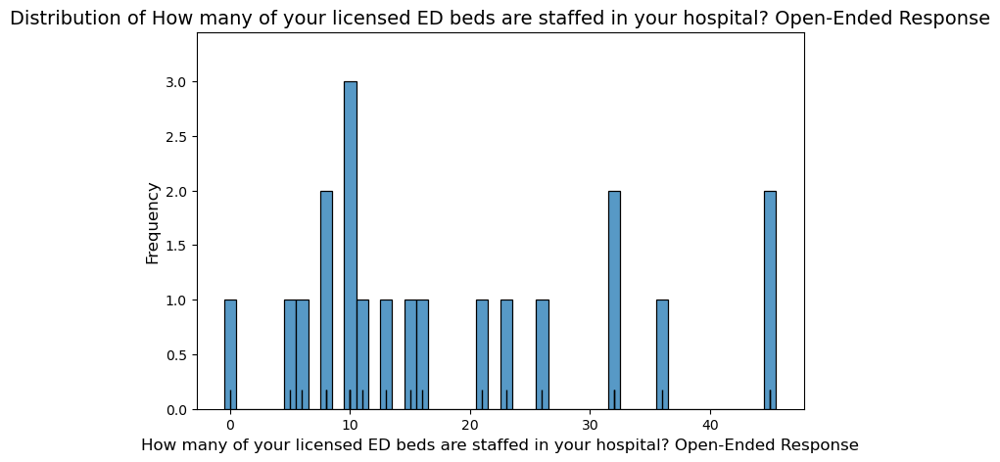

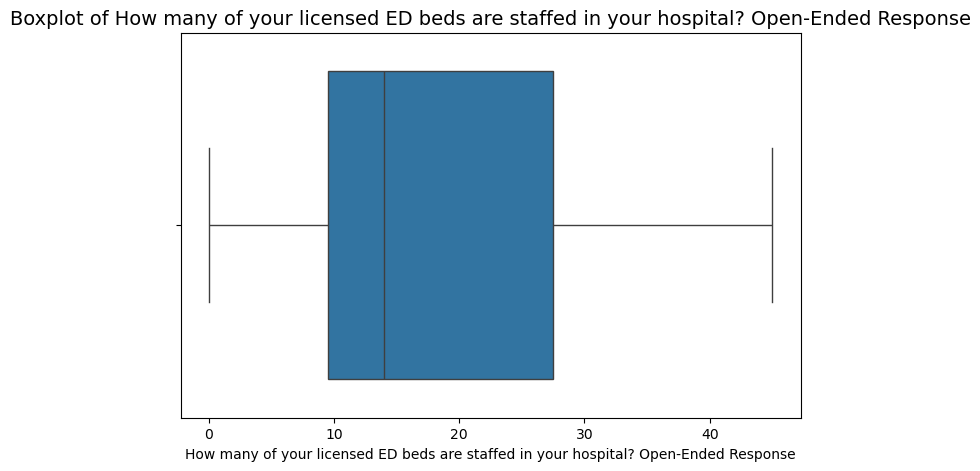

____________________________________________________________________________________________________
Attribute: How many patients are currently in your ED? Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean     20.700000
std      16.861978
min       0.000000
25%       8.750000
50%      14.000000
75%      26.750000
max      60.000000
Name: How many patients are currently in your ED? Open-Ended Response, dtype: float64


Frequency Distribution for How many patients are currently in your ED? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
How many patients are currently in your ED? Ope...                            
25.0                                                    2                 10.0
14.0                                                    2                 10.0
51.0                    

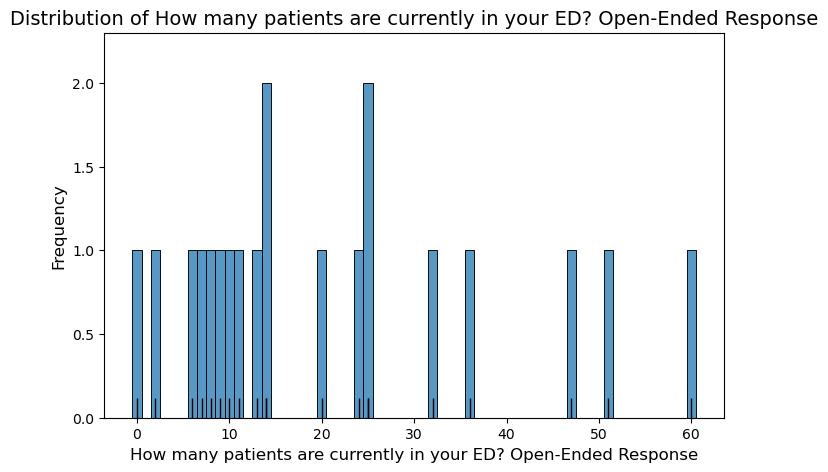

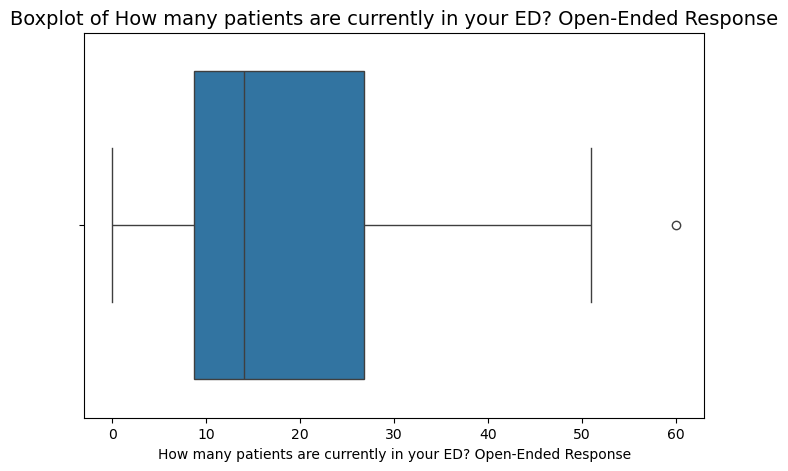

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 3, how many are age 17 or younger? Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean      1.300000
std       1.031095
min       0.000000
25%       0.750000
50%       1.000000
75%       2.000000
max       3.000000
Name: Of those patients reported in question 3, how many are age 17 or younger? Open-Ended Response, dtype: float64


Frequency Distribution for Of those patients reported in question 3, how many are age 17 or younger? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 3, how m...                            
1.0                                                     7                 35.0
2.0          

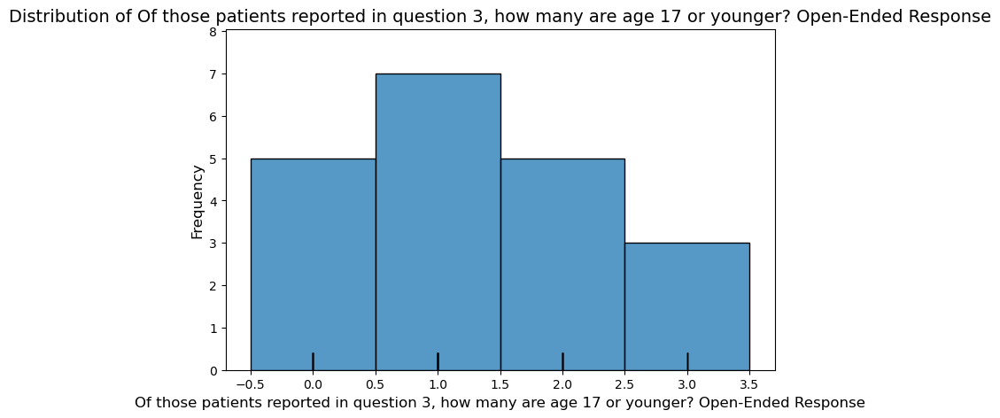

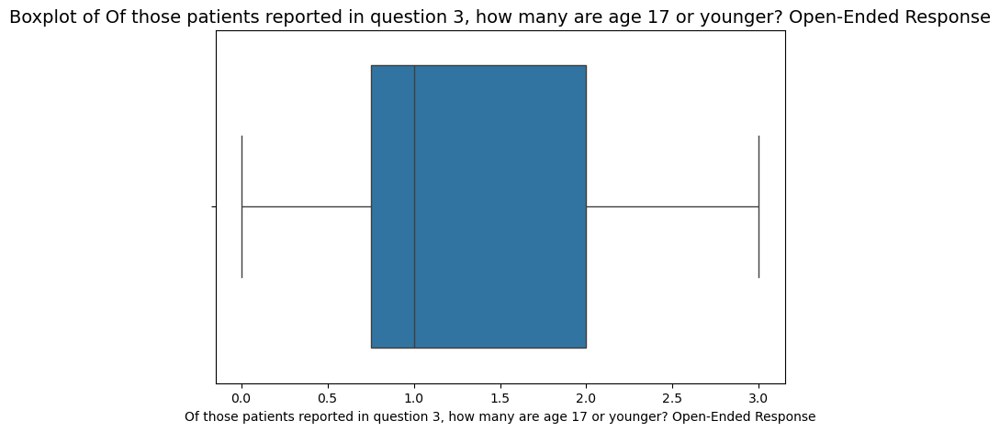

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 48 hours
____________________________________________________________________________________________________
count    16.00000
mean      0.25000
std       0.57735
min       0.00000
25%       0.00000
50%       0.00000
75%       0.00000
max       2.00000
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 48 hours, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 48 hours:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0                      

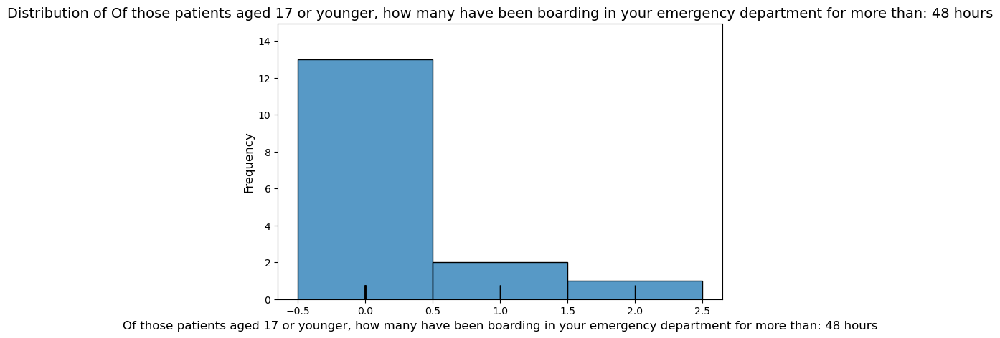

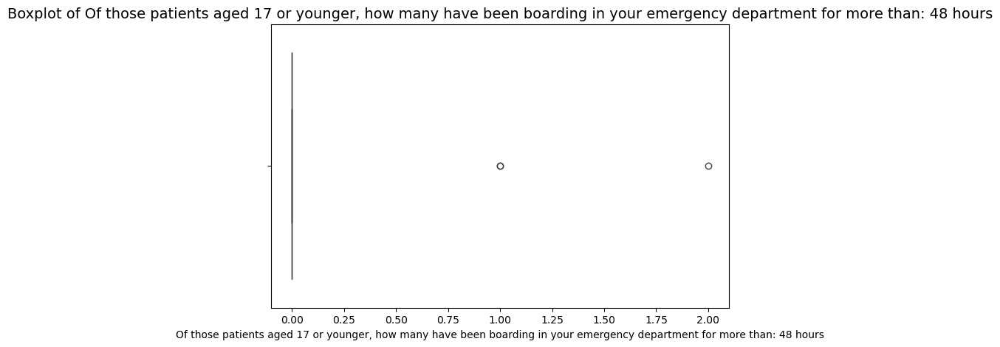

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >48 hours but less than one week
____________________________________________________________________________________________________
count    14.000000
mean      0.214286
std       0.425815
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >48 hours but less than one week, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >48 hours but less than one week:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 1

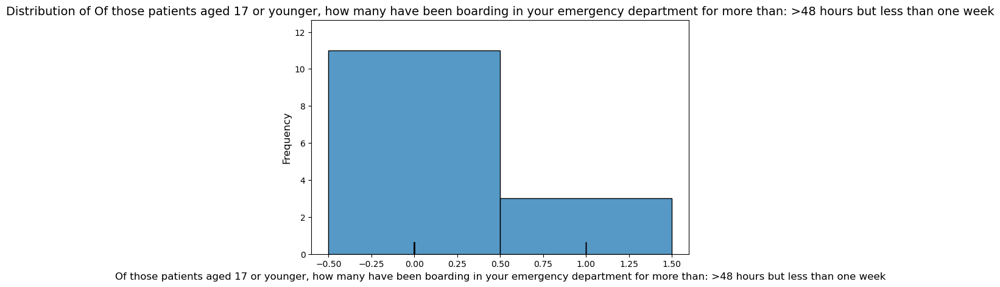

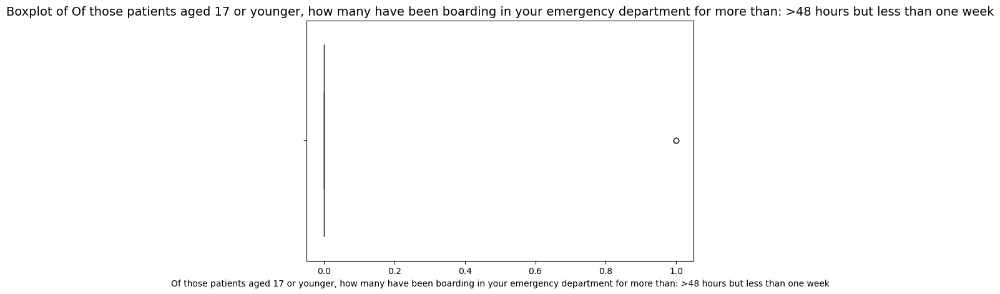

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 7 to 14 days
____________________________________________________________________________________________________
count    14.000000
mean      0.142857
std       0.363137
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 7 to 14 days, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 7 to 14 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0  

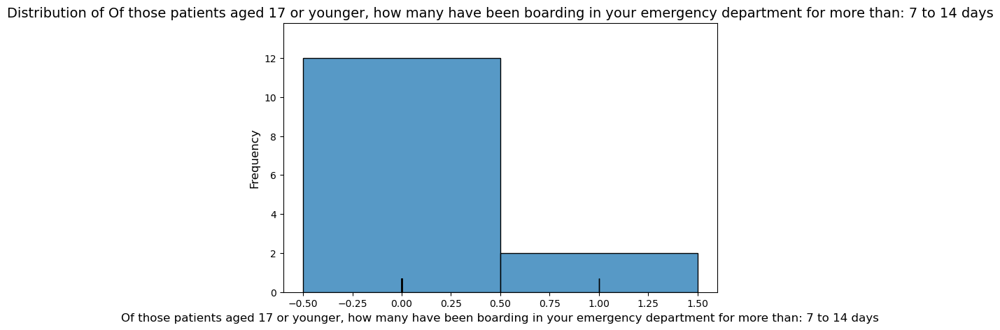

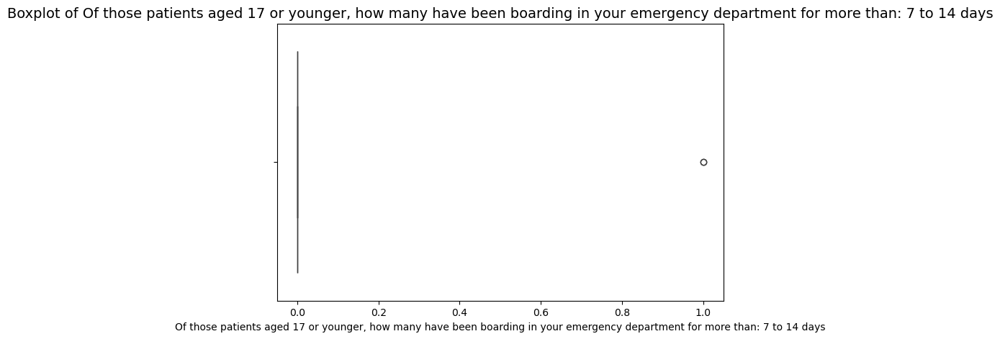

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 15 to 30 days
____________________________________________________________________________________________________
count    14.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 15 to 30 days, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 15 to 30 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0                                       

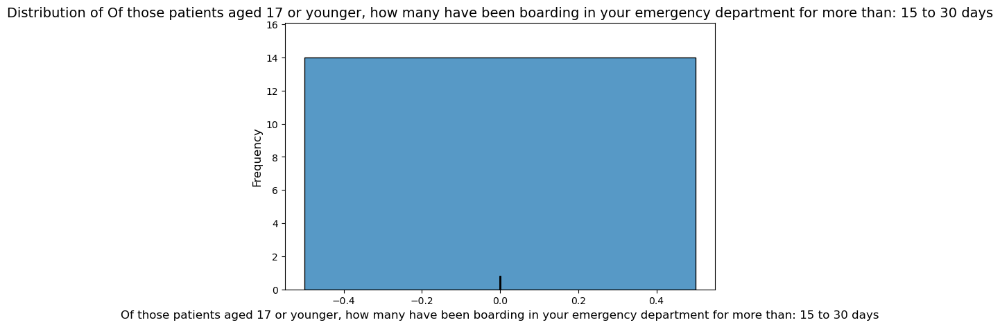

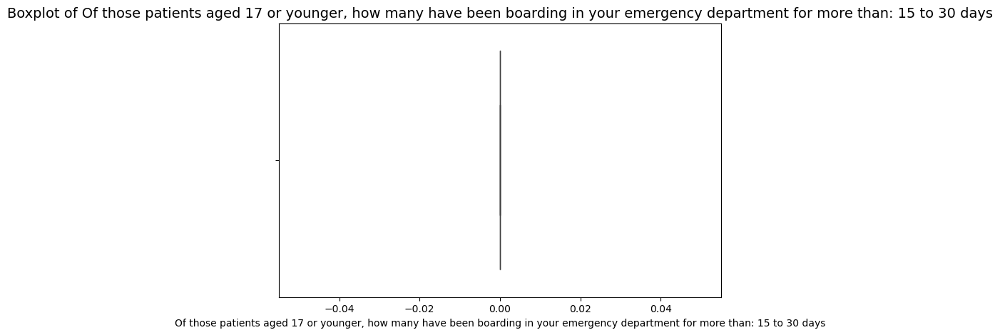

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 31 to 60 days
____________________________________________________________________________________________________
count    14.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 31 to 60 days, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 31 to 60 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0                                       

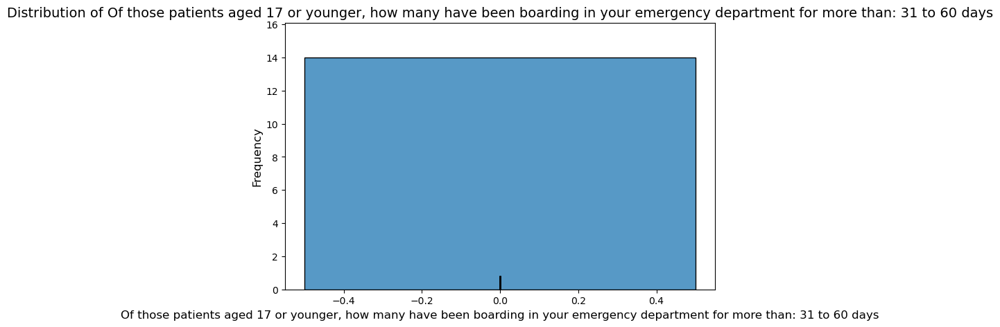

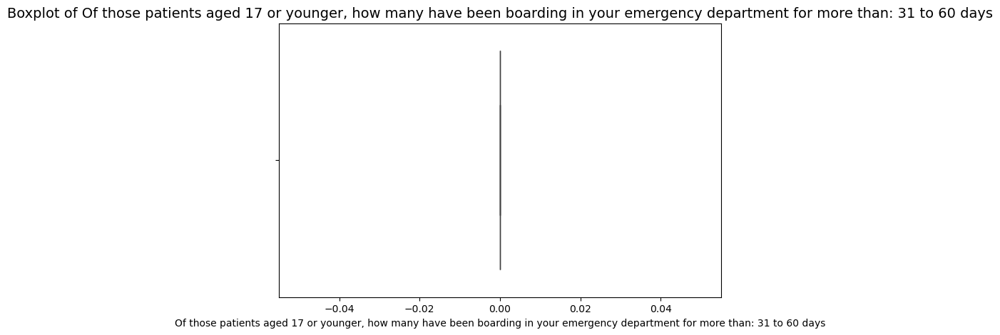

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 61 to 120 days
____________________________________________________________________________________________________
count    14.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 61 to 120 days, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 61 to 120 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0                                    

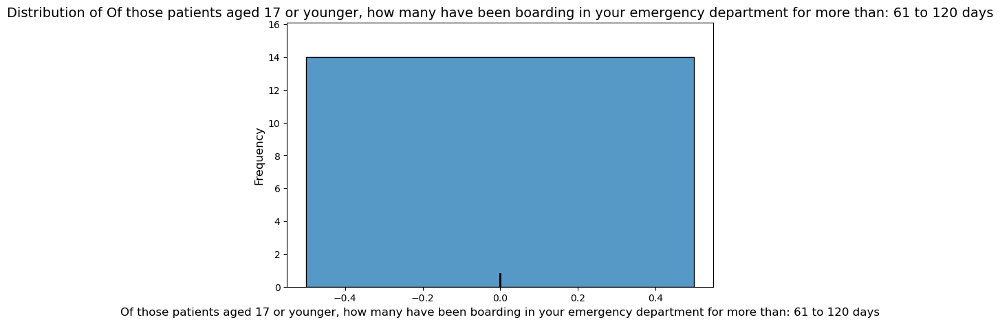

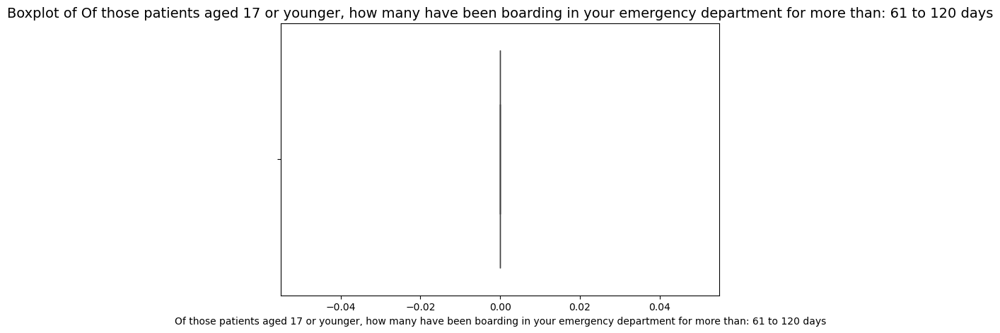

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >3 months
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >3 months, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >3 months:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0           

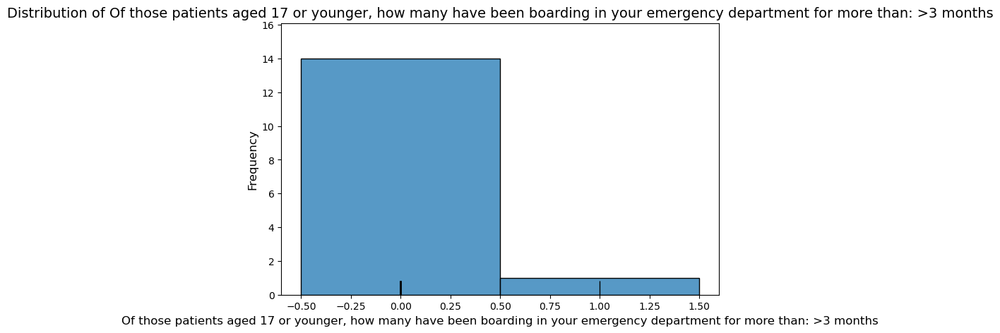

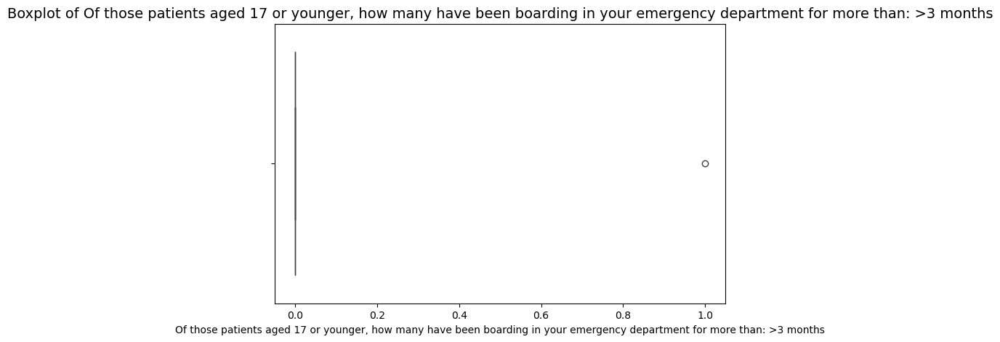

____________________________________________________________________________________________________
Attribute: Of those reported in question 4, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response
____________________________________________________________________________________________________
count    16.000000
mean      0.437500
std       0.629153
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       2.000000
Name: Of those reported in question 4, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response, dtype: float64


Frequency Distribution for Of those reported in question 4, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those reported in question 4, how many have ...                            
0.0  

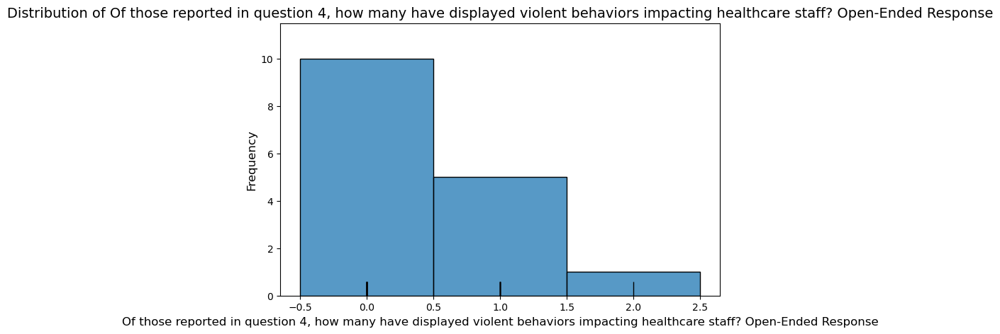

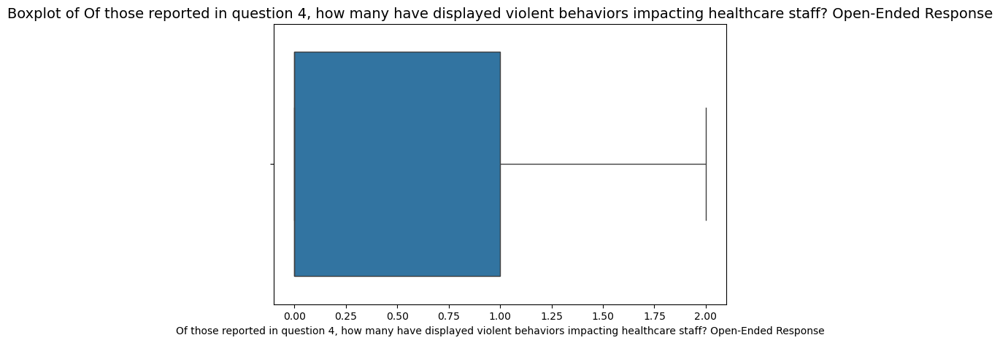

____________________________________________________________________________________________________
Attribute: If Yes, how many have been impacted in the past week? Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean      2.650000
std       2.924938
min       0.000000
25%       0.750000
50%       2.000000
75%       3.250000
max      10.000000
Name: If Yes, how many have been impacted in the past week? Open-Ended Response, dtype: float64


Frequency Distribution for If Yes, how many have been impacted in the past week? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
If Yes, how many have been impacted in the past...                            
0.0                                                     5                 25.0
2.0                                                     4                

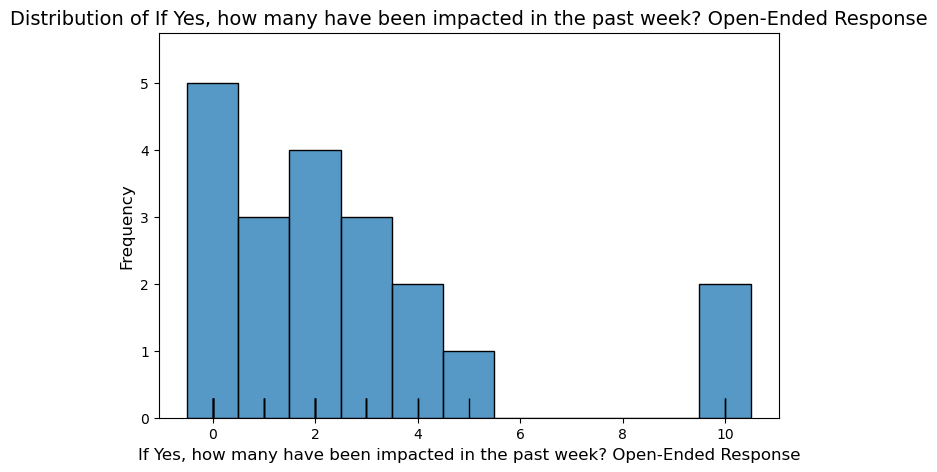

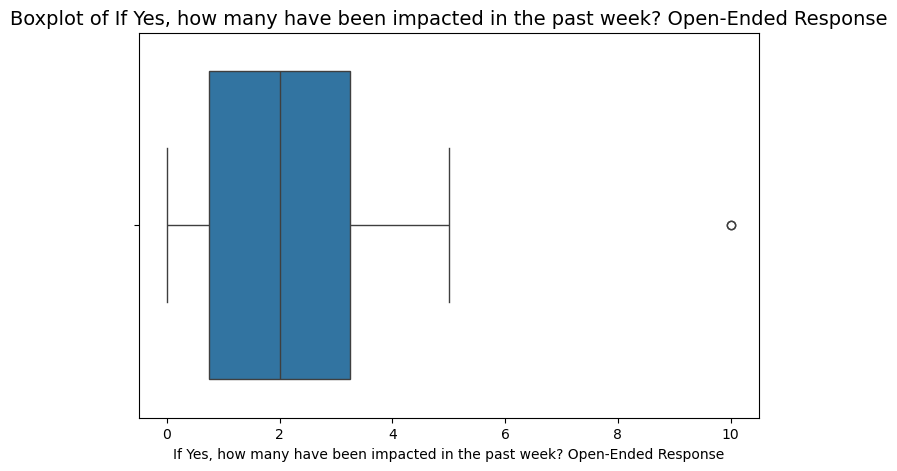

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Abandoned by Guardian:
____________________________________________________________________________________________________
count    15.000000
mean      0.266667
std       0.457738
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Abandoned by Guardian:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Abandoned by Guardian::
__________________________________________________
                                                    Cou

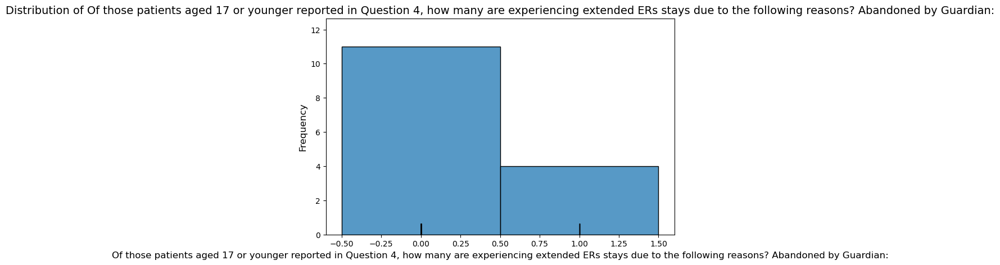

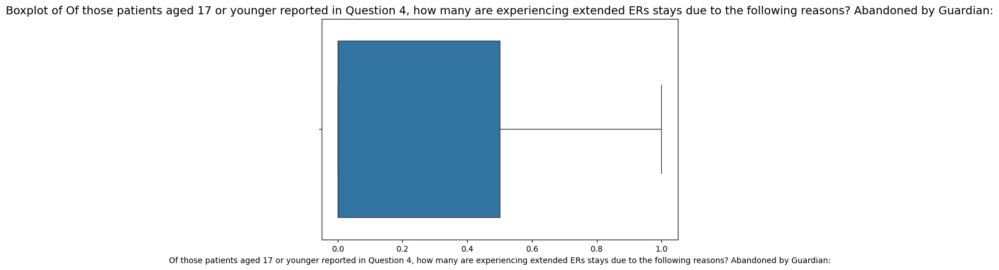

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Ambulance/transport Unavailable:
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Ambulance/transport Unavailable:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Ambulance/transport Unavailable::
__________________________________________________
                         

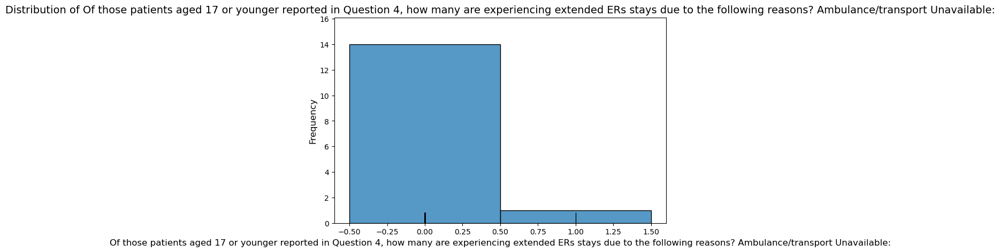

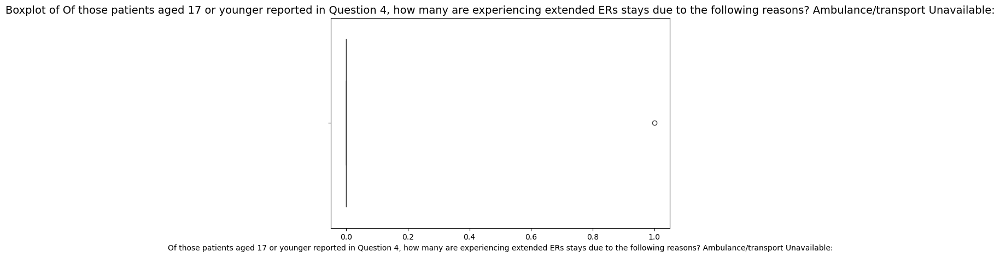

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of CCSU bed:
____________________________________________________________________________________________________
count    15.000000
mean      0.133333
std       0.351866
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of CCSU bed:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of CCSU bed::
__________________________________________________
                                              

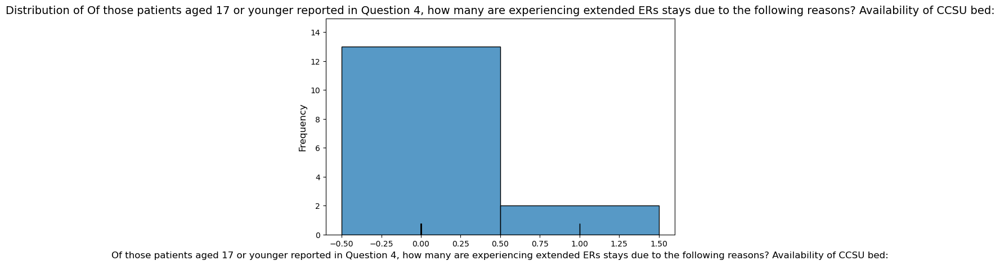

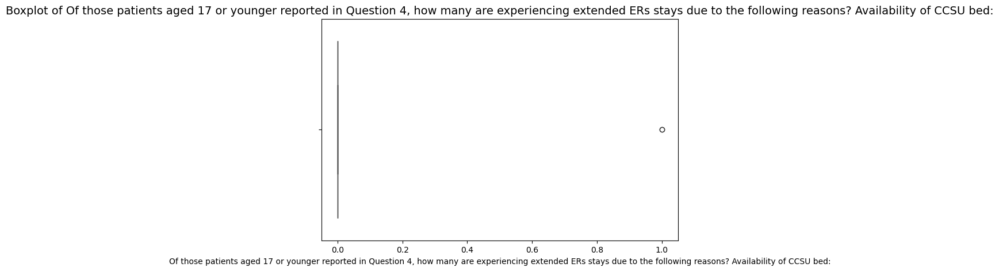

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Community Services:
____________________________________________________________________________________________________
count    15.000000
mean      0.133333
std       0.351866
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Community Services:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Community Services::
__________________________________________________
                

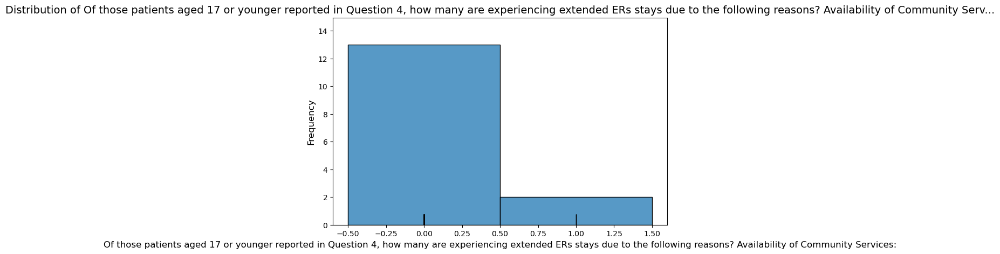

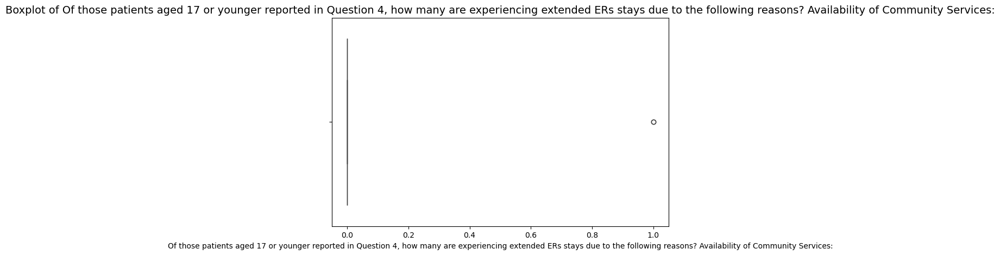

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Inpatient Bed:
____________________________________________________________________________________________________
count    16.000000
mean      0.125000
std       0.341565
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Inpatient Bed:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Inpatient Bed::
__________________________________________________
                               

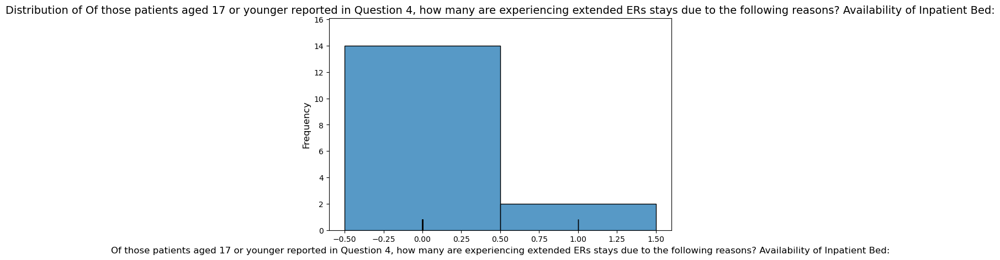

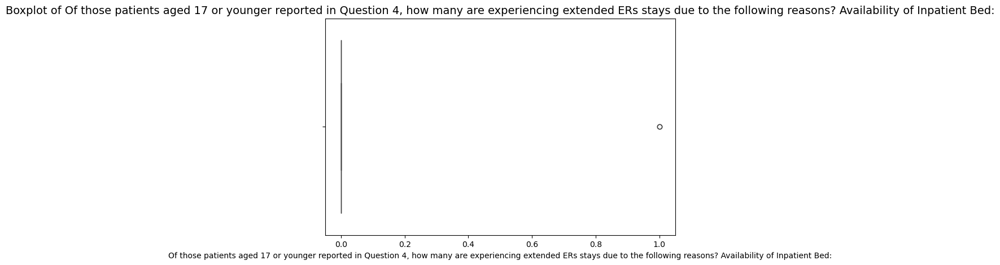

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement:
____________________________________________________________________________________________________
count    16.000000
mean      0.312500
std       0.478714
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement::
_____________________________________

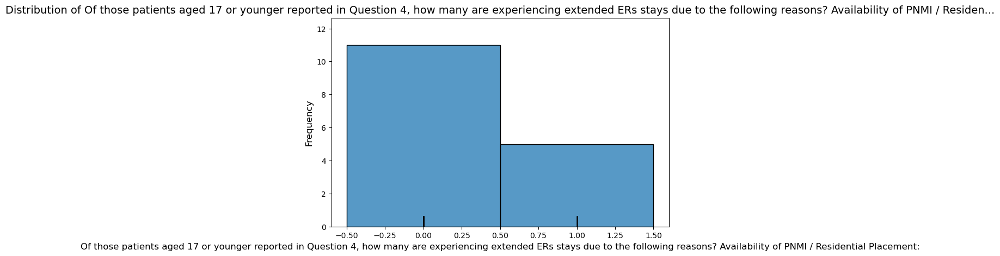

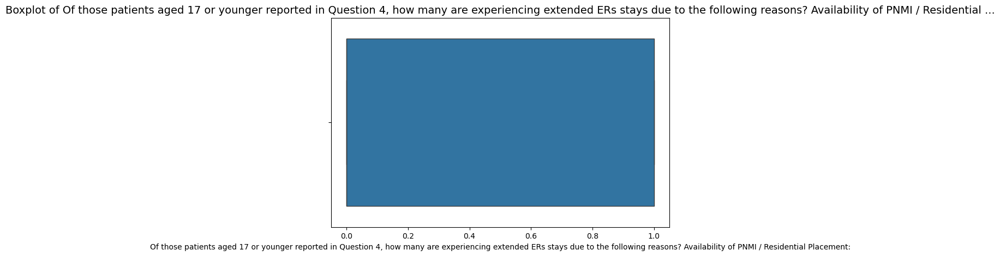

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Resource (Foster) Home Placement:
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Resource (Foster) Home Placement:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Resource (Foster) Home Placement::
__________________________________________________
              

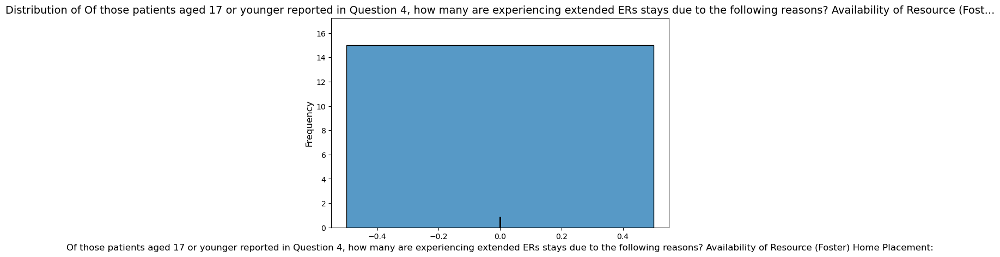

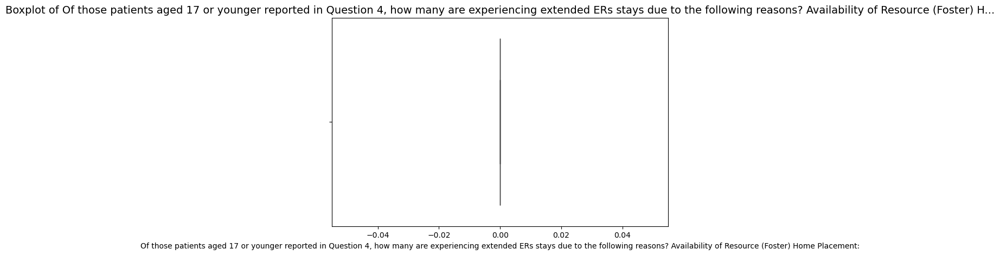

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? DHHS Guardian Unable to Secure Alternate Placement:
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? DHHS Guardian Unable to Secure Alternate Placement:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? DHHS Guardian Unable to Secure Alternate Placement::
___________________

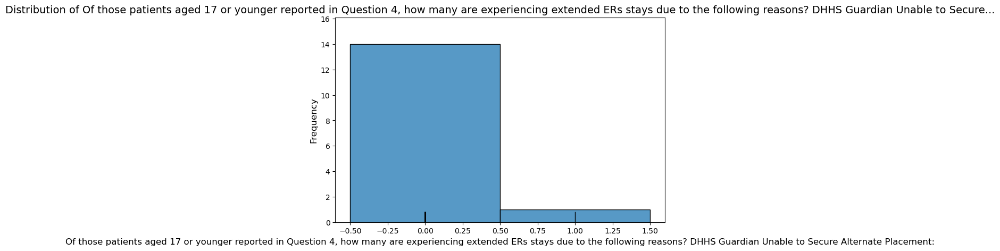

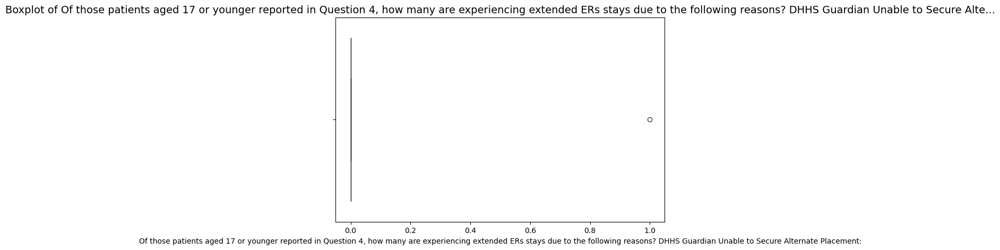

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Does Not Wish for Youth to Return to Their Home:
____________________________________________________________________________________________________
count    15.000000
mean      0.333333
std       0.617213
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max       2.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Does Not Wish for Youth to Return to Their Home:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Does Not Wish for Youth to Return to Their Home::
_

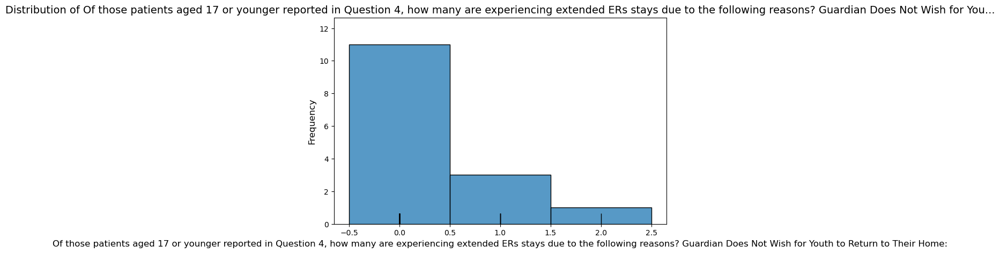

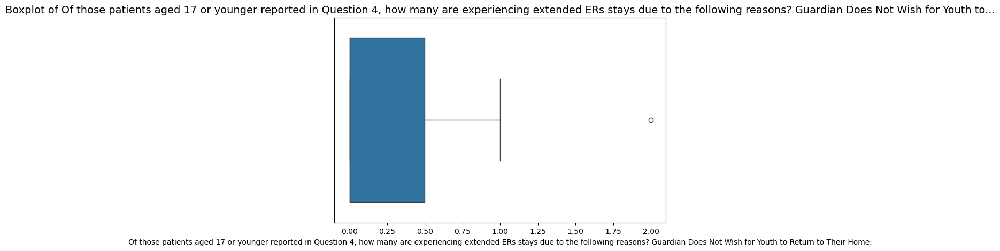

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Unwilling to Accept Discharge Recommendation:
____________________________________________________________________________________________________
count    15.000000
mean      0.200000
std       0.560612
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Unwilling to Accept Discharge Recommendation:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Unwilling to Accept Discharge Recommendation::
__________

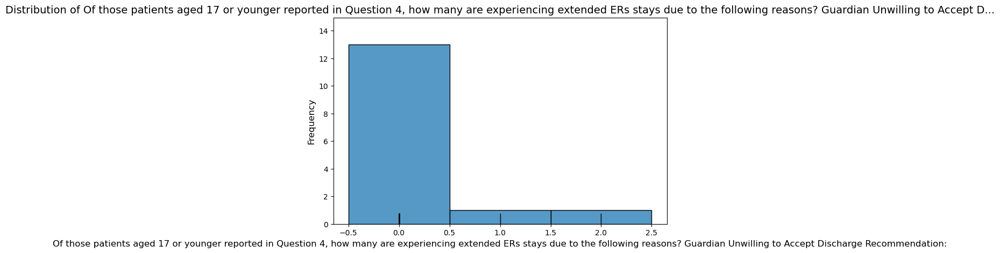

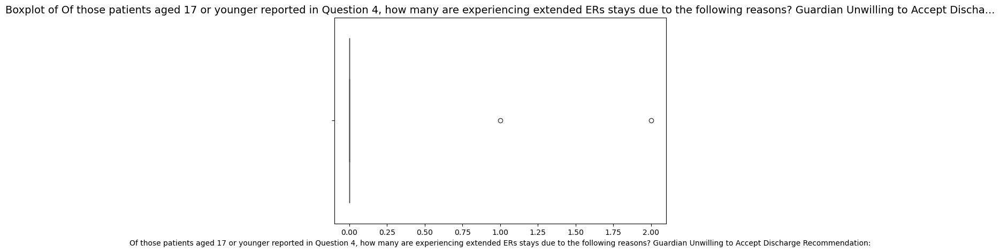

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient bed for medical management
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient bed for medical management, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient bed for medical management:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those pati

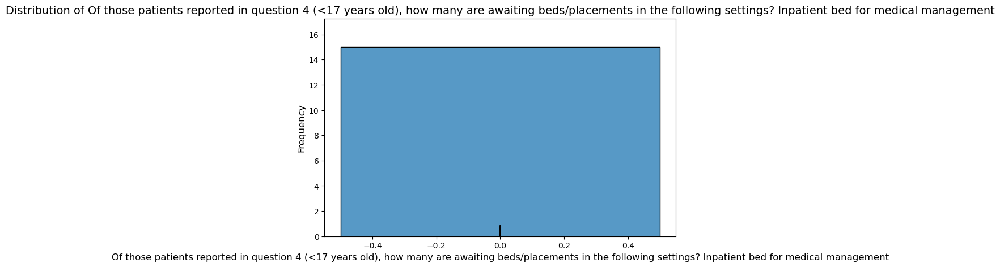

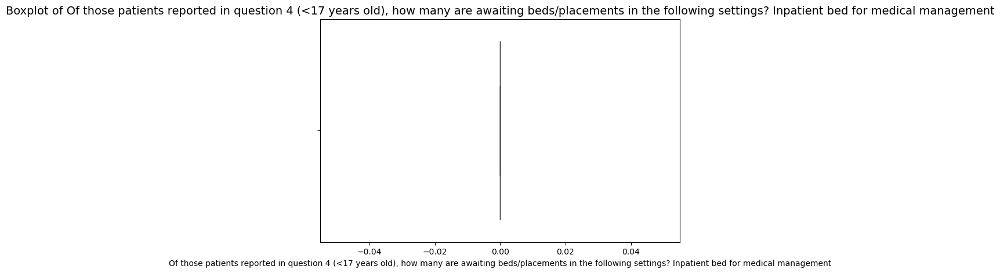

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 4 (<17 

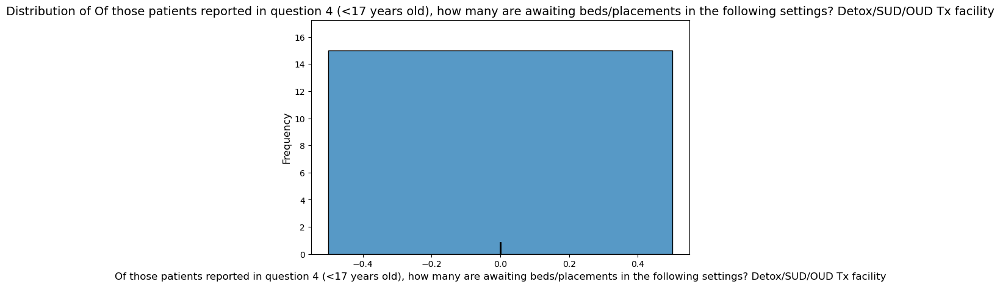

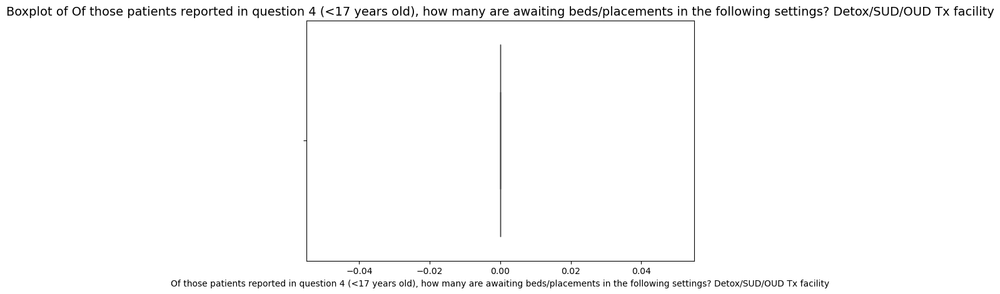

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient psychiatric
____________________________________________________________________________________________________
count    16.000000
mean      0.187500
std       0.403113
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient psychiatric, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient psychiatric:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients 

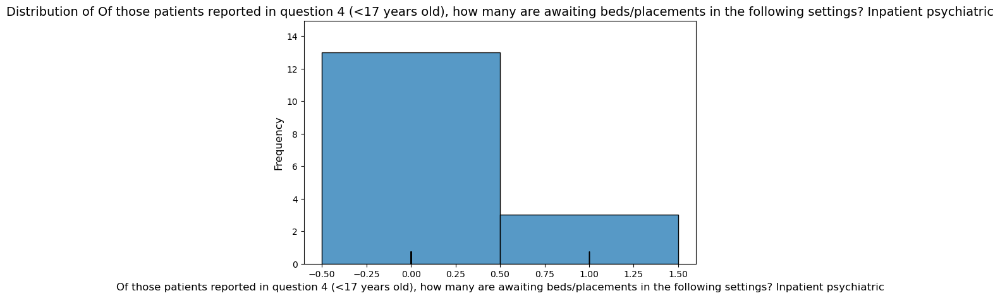

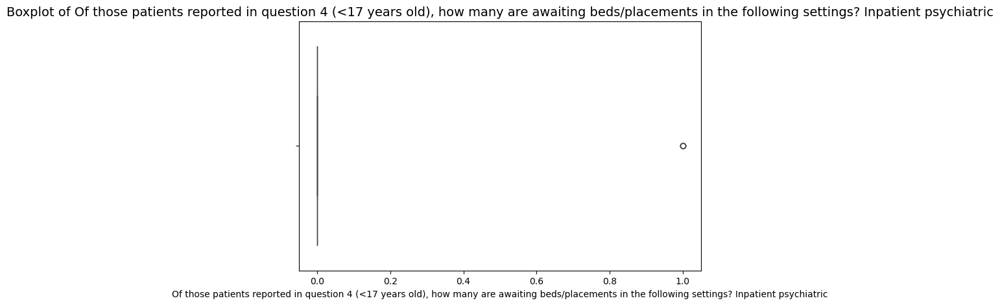

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility
____________________________________________________________________________________________________
count    15.000000
mean      0.333333
std       0.617213
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max       2.000000
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility:
__________________________________________________
                                        

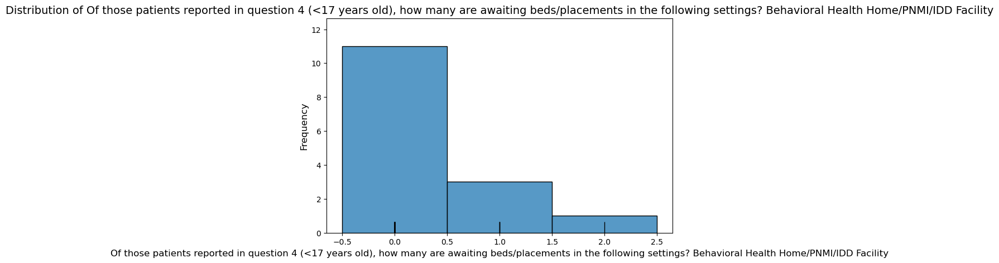

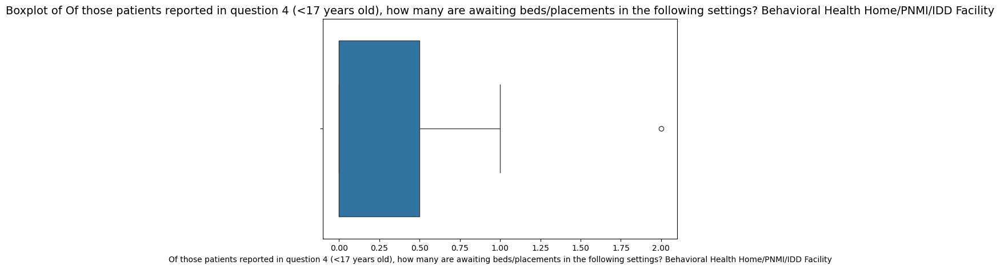

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Home
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Home, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Home:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 4 (<17 y...                            
0.0                           

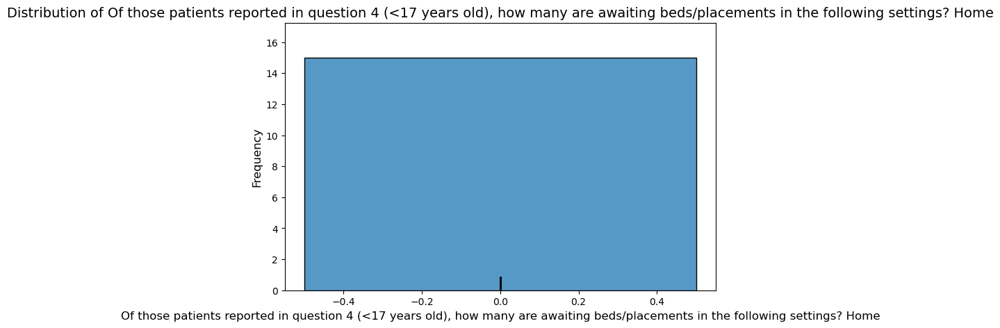

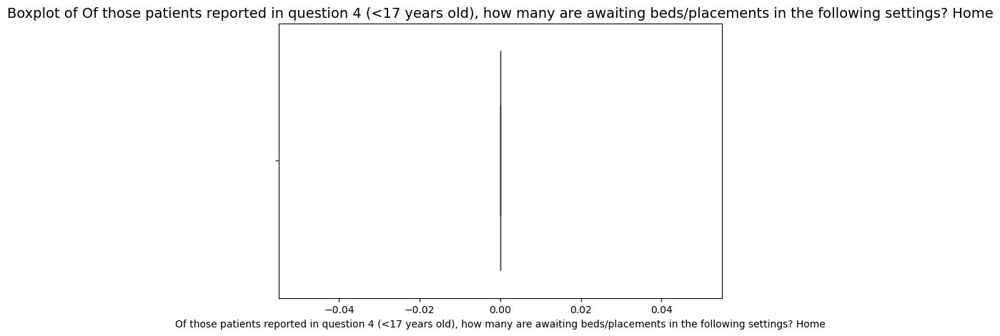

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Other
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Other, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Other:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 4 (<17 y...                            
0.0                        

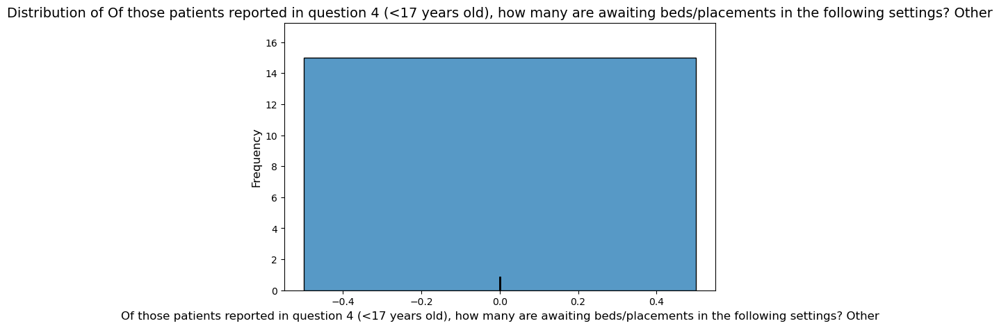

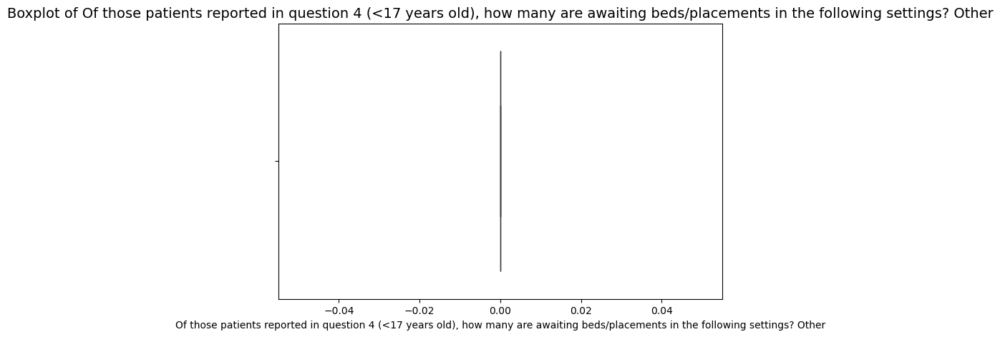

____________________________________________________________________________________________________
Attribute: Of those patients report in question 3, how many are 18 and older? Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean     19.450000
std      16.099935
min       0.000000
25%       8.500000
50%      13.000000
75%      26.500000
max      57.000000
Name: Of those patients report in question 3, how many are 18 and older? Open-Ended Response, dtype: float64


Frequency Distribution for Of those patients report in question 3, how many are 18 and older? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients report in question 3, how man...                            
9.0                                                     2                 10.0
6.0                               

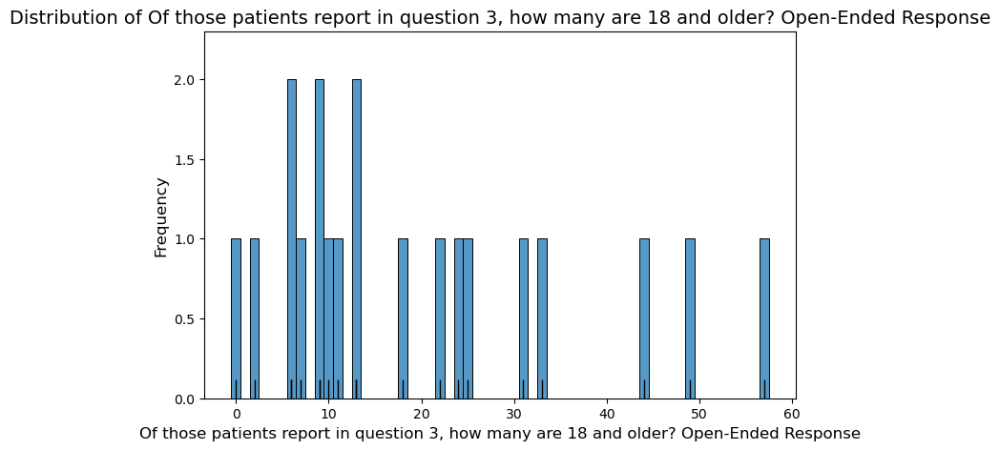

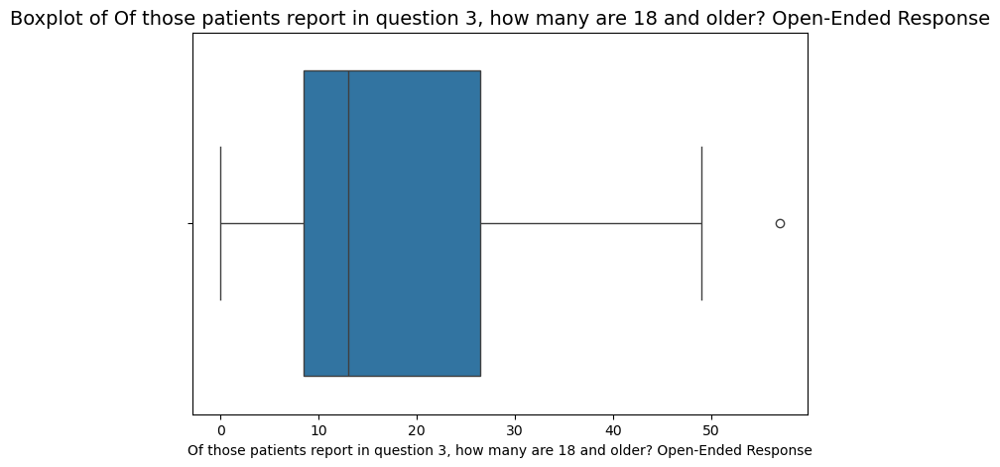

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 48 hours
____________________________________________________________________________________________________
count    18.000000
mean      3.500000
std      11.408201
min       0.000000
25%       0.000000
50%       0.500000
75%       1.750000
max      49.000000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 48 hours, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 48 hours:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0                    

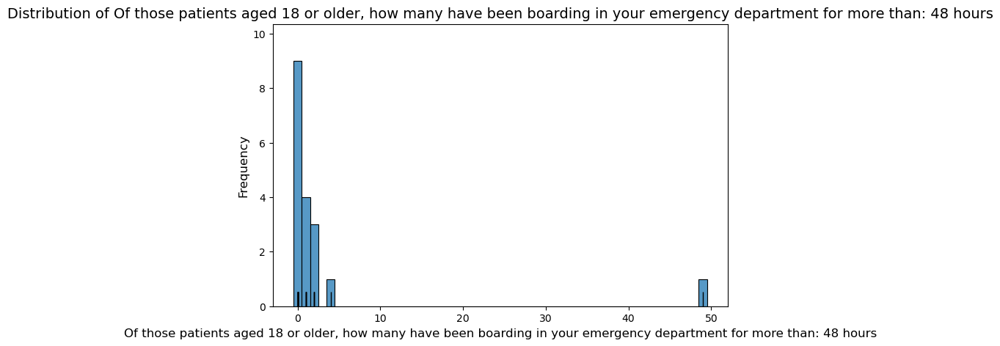

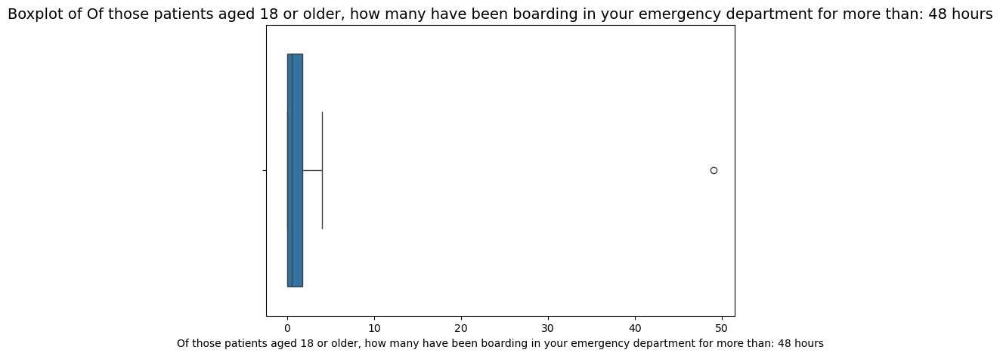

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >48 hours but less than one week
____________________________________________________________________________________________________
count    18.000000
mean      0.611111
std       0.978528
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >48 hours but less than one week, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >48 hours but less than one week:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or o

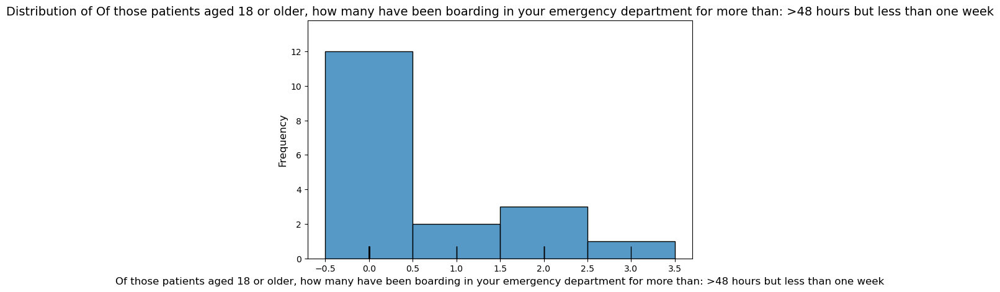

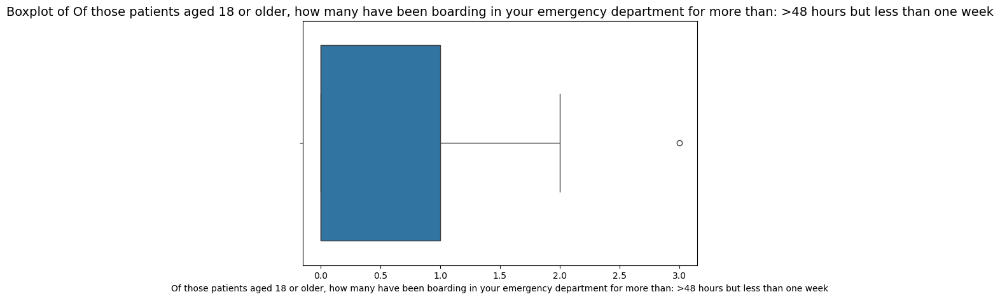

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 7 to 14 days
____________________________________________________________________________________________________
count    18.000000
mean      0.222222
std       0.427793
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 7 to 14 days, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 7 to 14 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0        

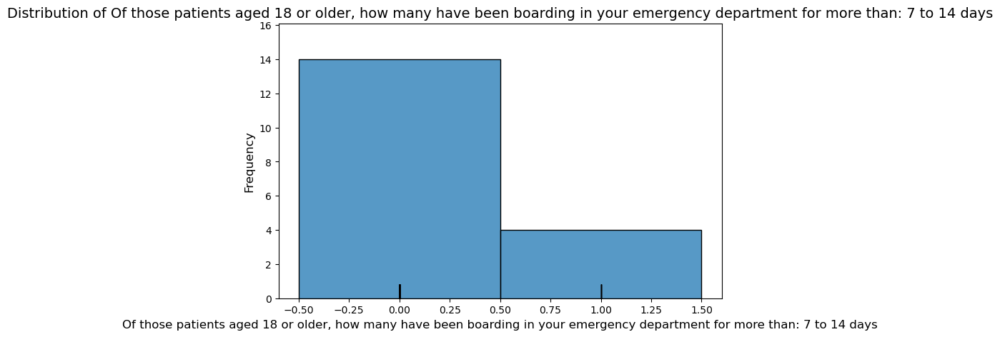

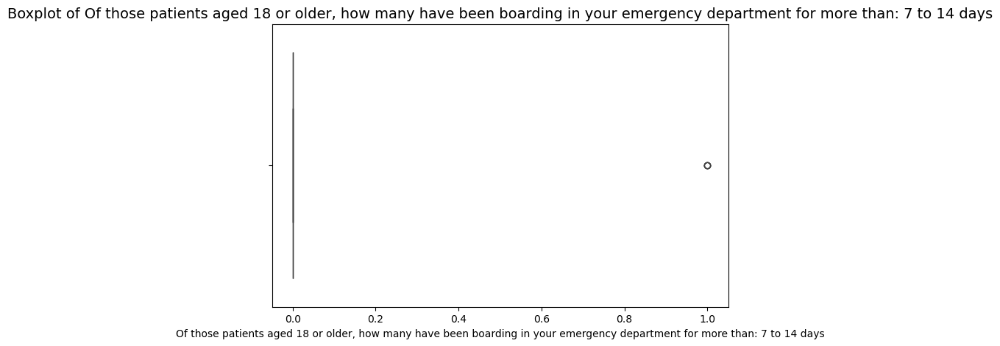

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 15 to 30 days
____________________________________________________________________________________________________
count    17.000000
mean      0.058824
std       0.242536
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 15 to 30 days, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 15 to 30 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0     

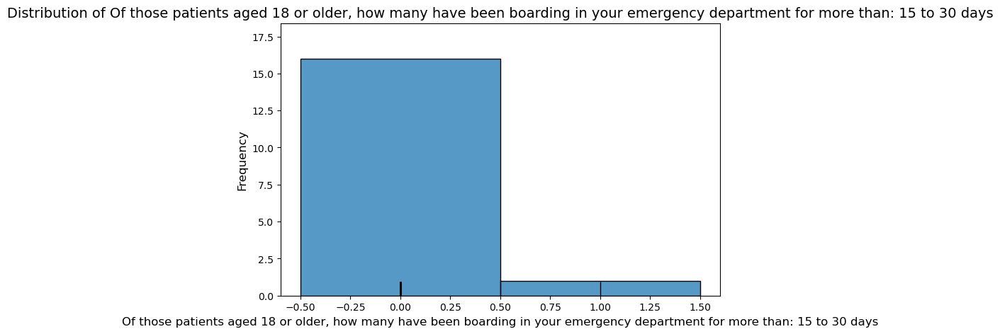

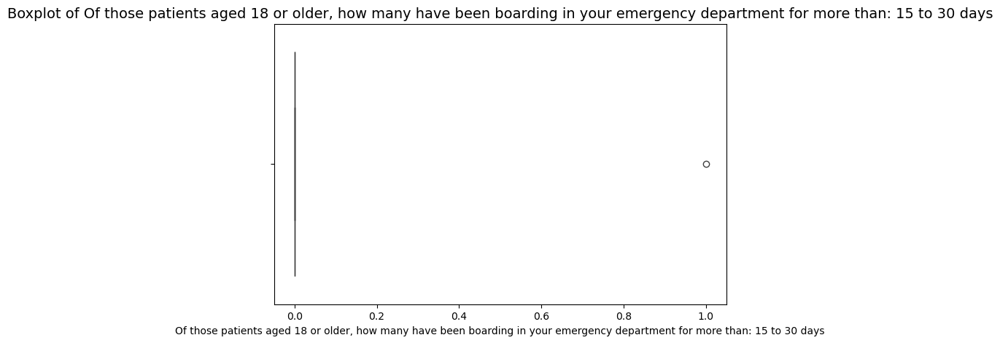

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 31 to 60 days
____________________________________________________________________________________________________
count    17.000000
mean      0.058824
std       0.242536
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 31 to 60 days, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 31 to 60 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0     

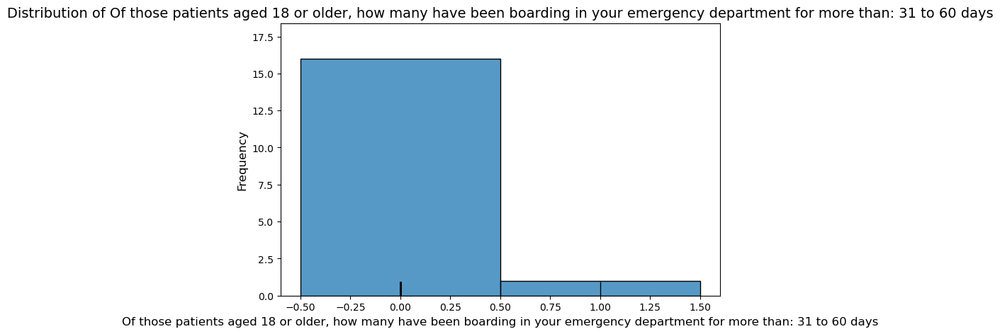

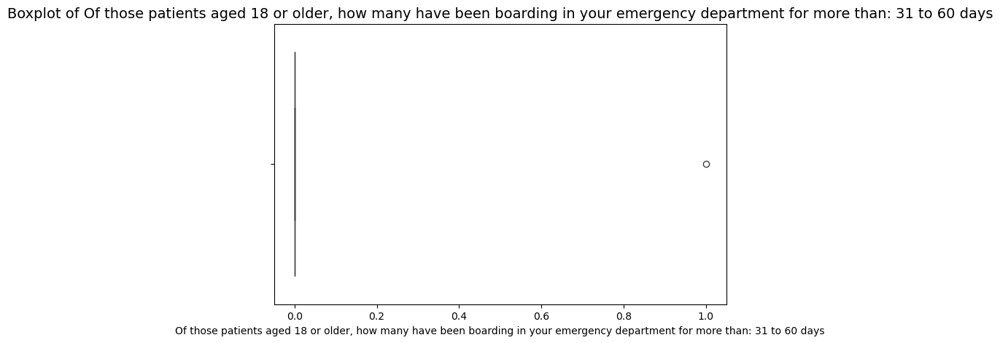

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 61 to 120 days
____________________________________________________________________________________________________
count    17.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 61 to 120 days, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 61 to 120 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0                                          

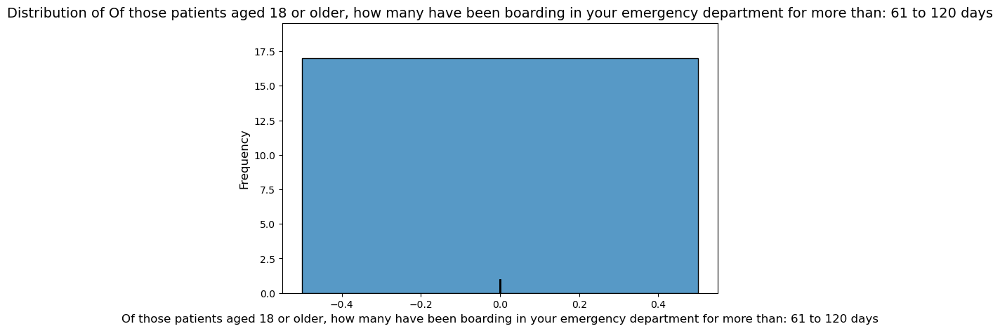

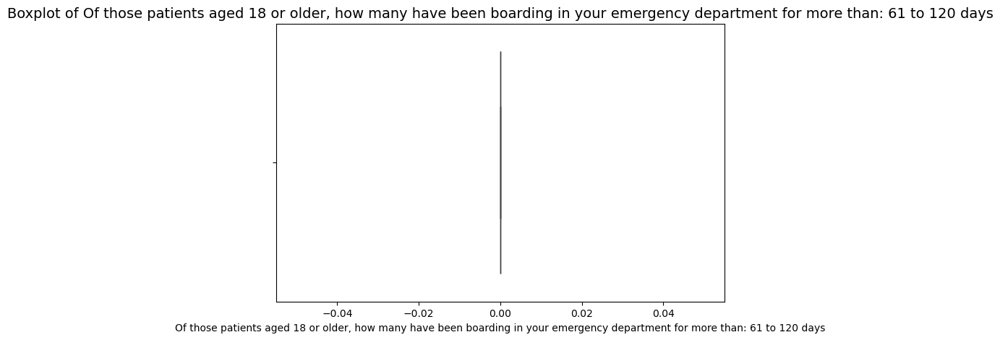

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >3 months
____________________________________________________________________________________________________
count    17.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >3 months, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >3 months:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0                                                    17   

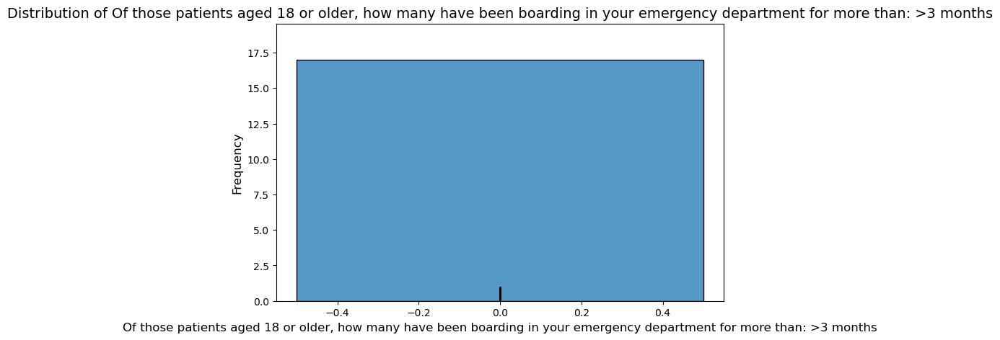

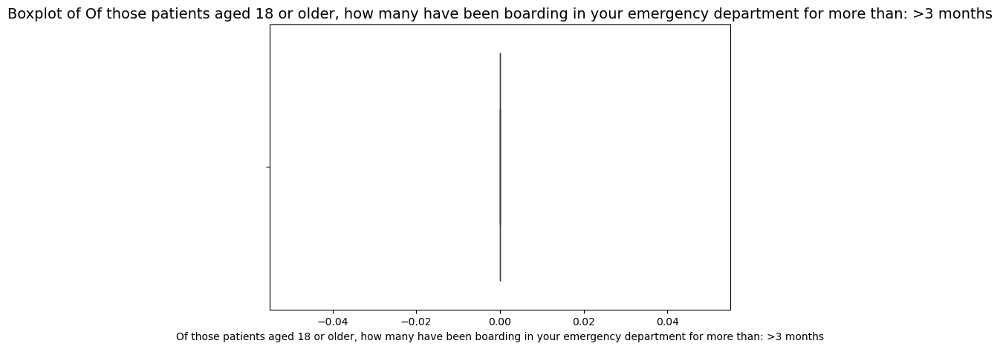

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Community Services:
____________________________________________________________________________________________________
count    15.000000
mean      0.533333
std       0.915475
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Community Services:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Community Services::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 1

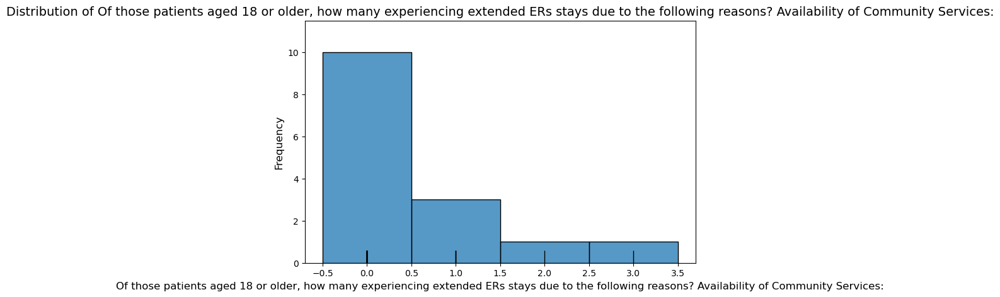

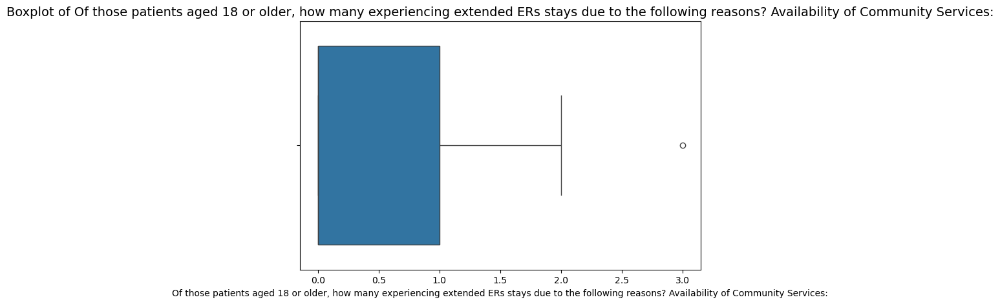

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in your hospital:
____________________________________________________________________________________________________
count    15.000000
mean      2.733333
std       6.430582
min       0.000000
25%       0.000000
50%       0.000000
75%       1.500000
max      24.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in your hospital:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in your hospital::
__________________________________________________
                                           

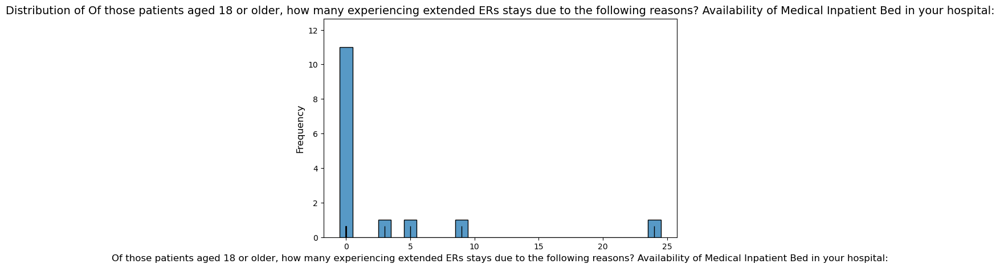

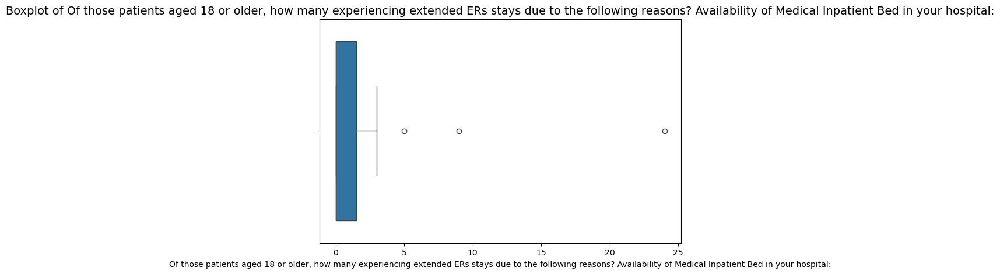

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in another hospital:
____________________________________________________________________________________________________
count    15.000000
mean      0.466667
std       0.743223
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       2.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in another hospital:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in another hospital::
__________________________________________________
                                  

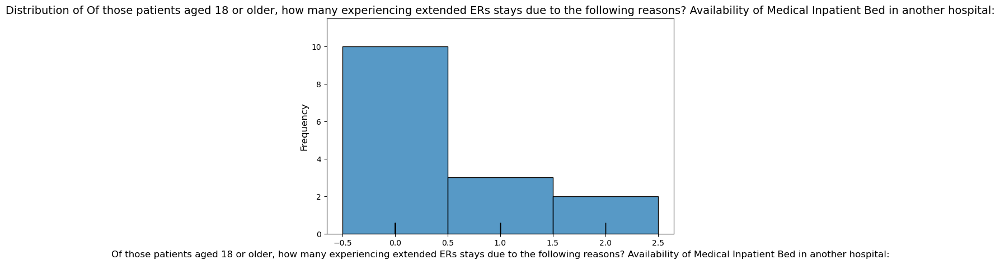

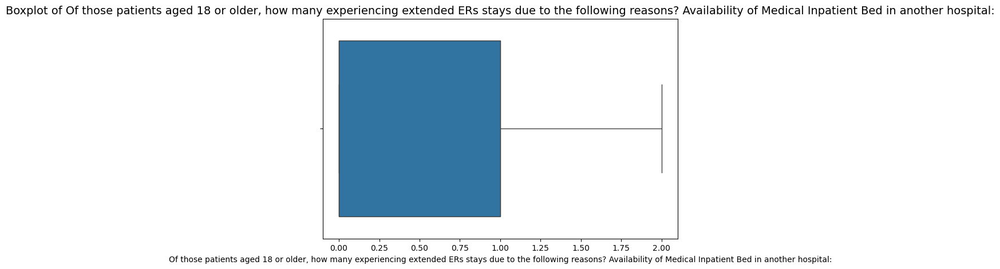

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement:
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement::
__________________________________________________
                                                    Count  Frequency_Rati

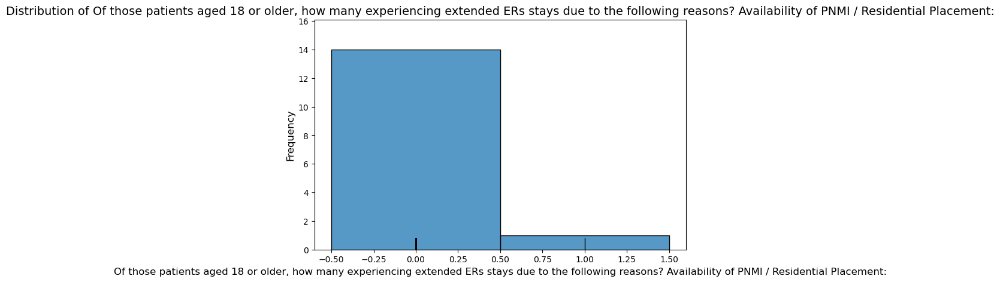

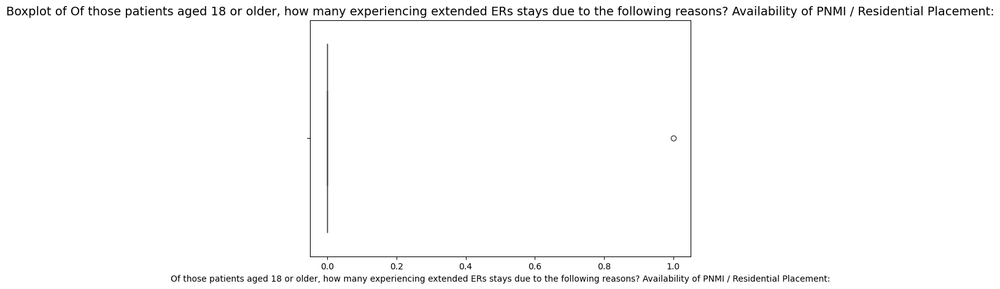

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Transport to Move Patient:
____________________________________________________________________________________________________
count    15.000000
mean      0.200000
std       0.414039
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Transport to Move Patient:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Transport to Move Patient::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 o

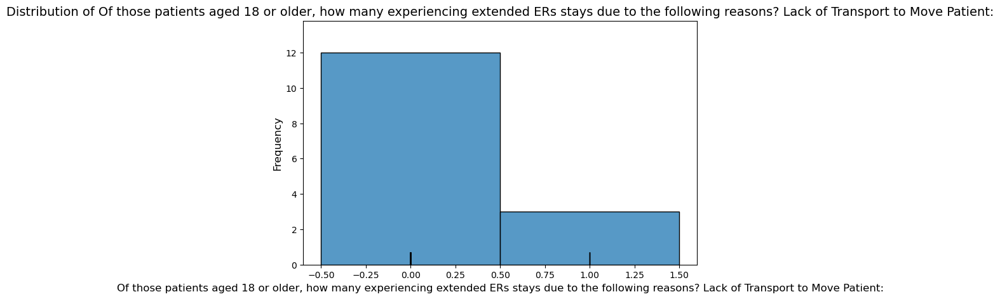

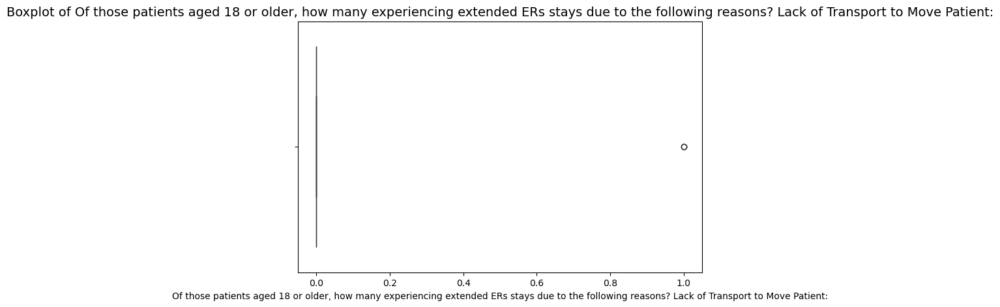

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Inpatient Psychiatric Bed:
____________________________________________________________________________________________________
count    19.000000
mean      0.631579
std       0.830698
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Inpatient Psychiatric Bed:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Inpatient Psychiatric Bed::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of 

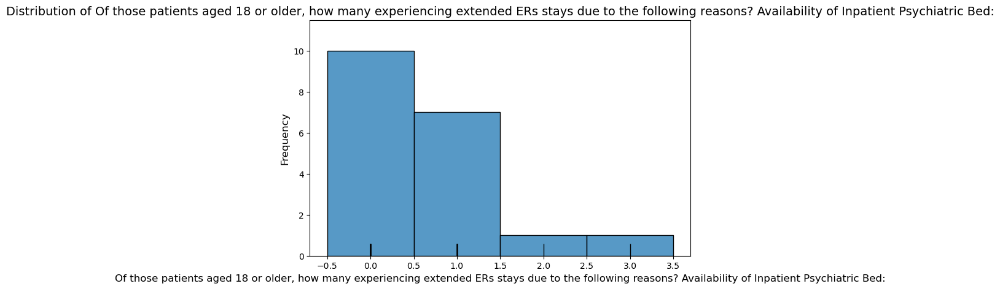

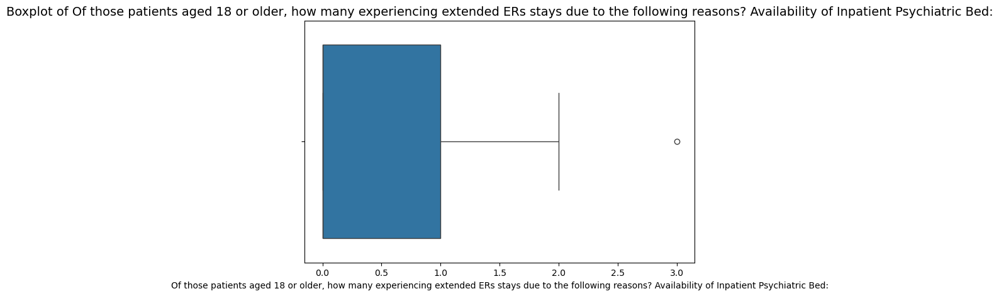

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Detox Bed:
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Detox Bed:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Detox Bed::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ex...                            
0.0         

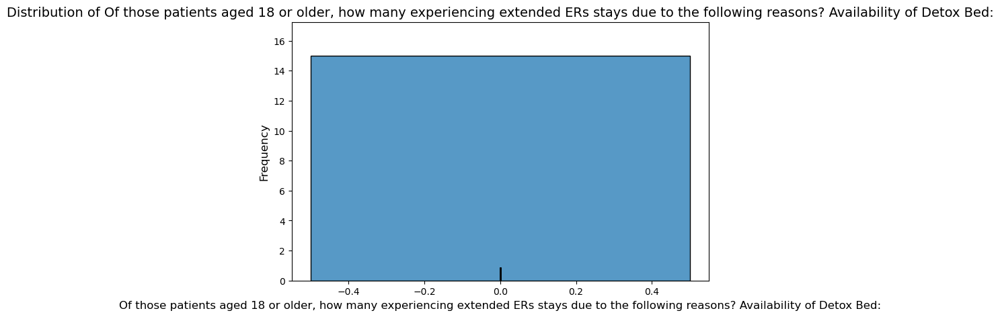

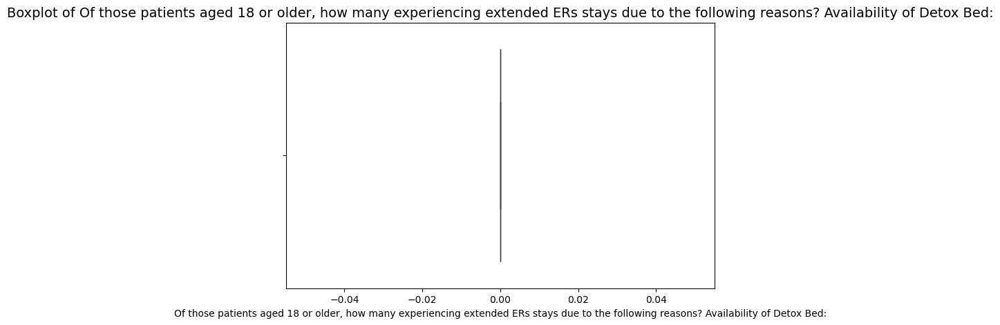

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of SNF bed:
____________________________________________________________________________________________________
count    16.000000
mean      0.437500
std       1.093542
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       4.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of SNF bed:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of SNF bed::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ex...       

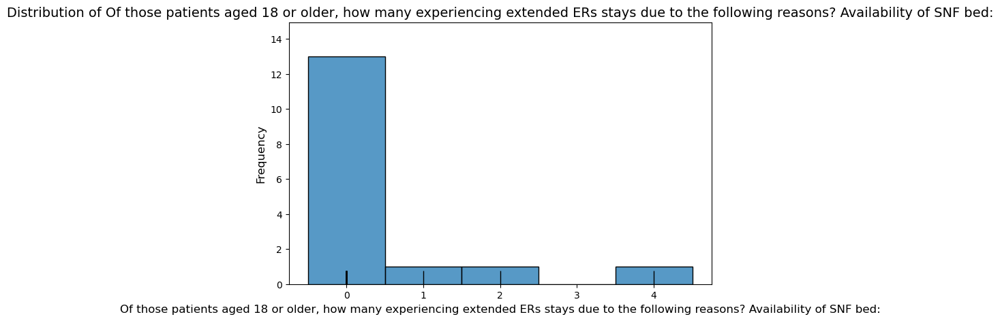

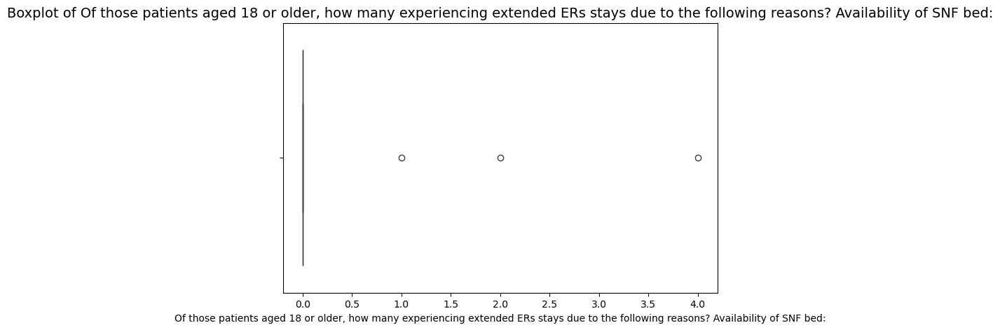

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Guardianship
____________________________________________________________________________________________________
count    16.000000
mean      0.125000
std       0.341565
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Guardianship, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Guardianship:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ex...                   

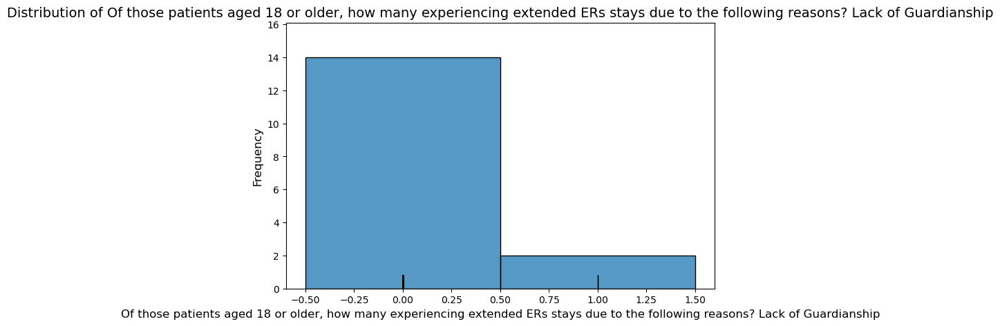

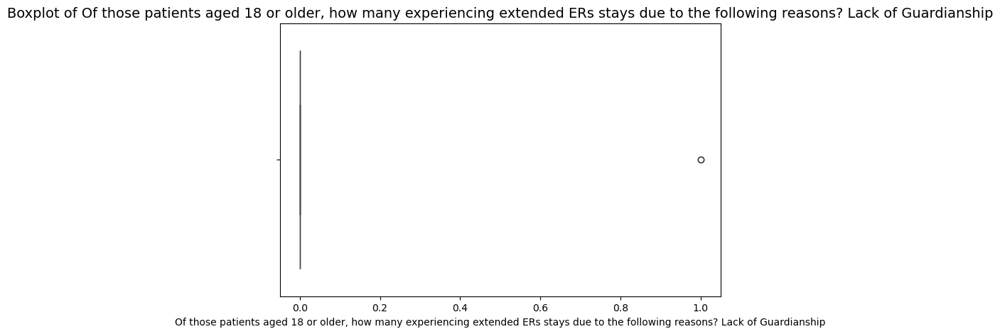

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Insurance
____________________________________________________________________________________________________
count    16.000000
mean      0.187500
std       0.543906
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Insurance, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Insurance:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ex...                            

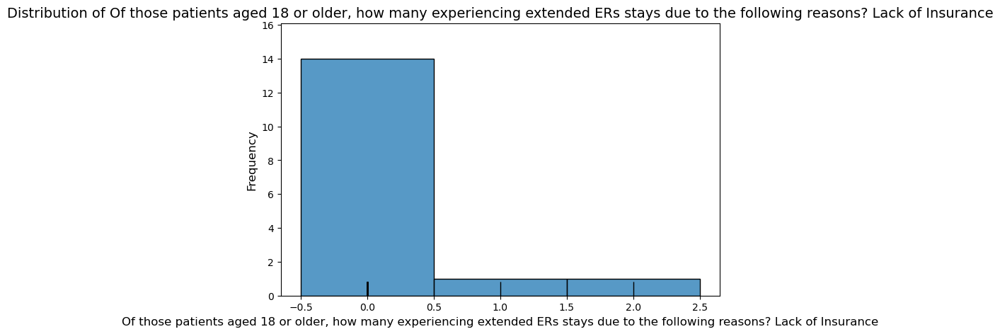

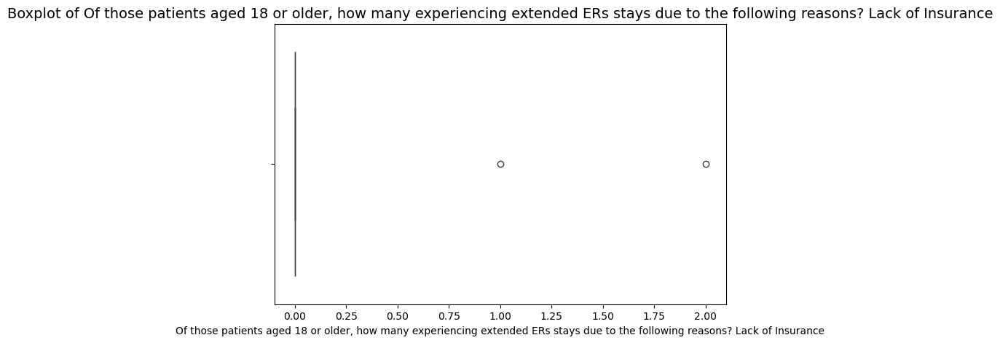

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation
____________________________________________________________________________________________________
count    16.0000
mean      0.0625
std       0.2500
min       0.0000
25%       0.0000
50%       0.0000
75%       0.0000
max       1.0000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation:
__________________________________________________
                                            

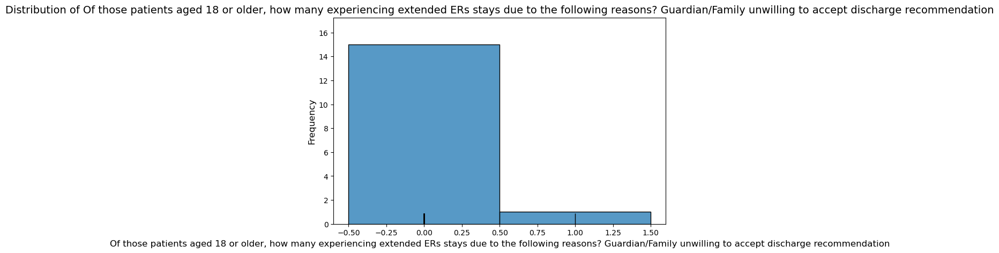

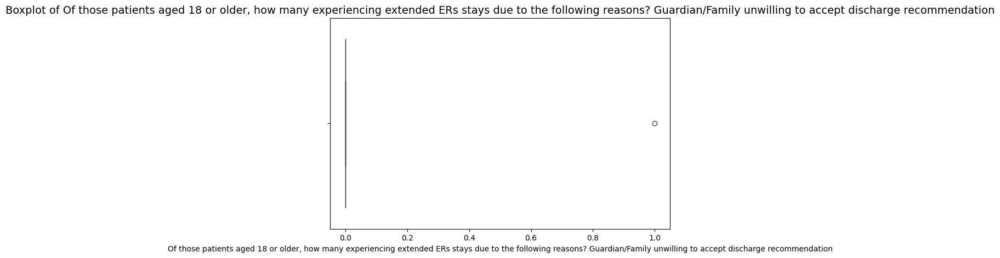

____________________________________________________________________________________________________
Attribute: Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean      0.800000
std       0.833509
min       0.000000
25%       0.000000
50%       1.000000
75%       1.000000
max       3.000000
Name: Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response, dtype: float64


Frequency Distribution for Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those reported in question 11, how many have...                            
1.

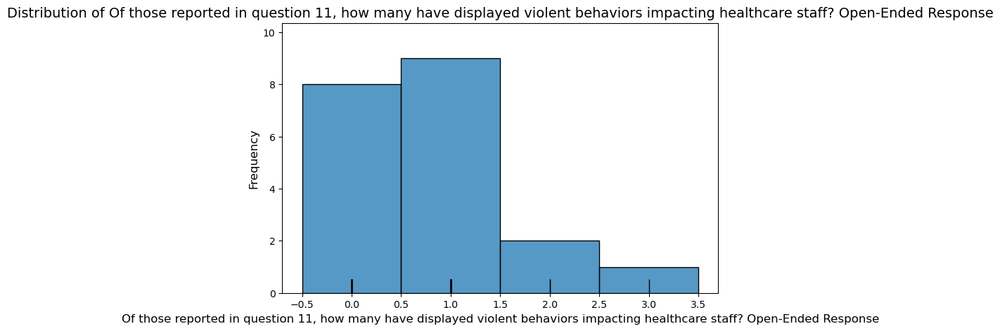

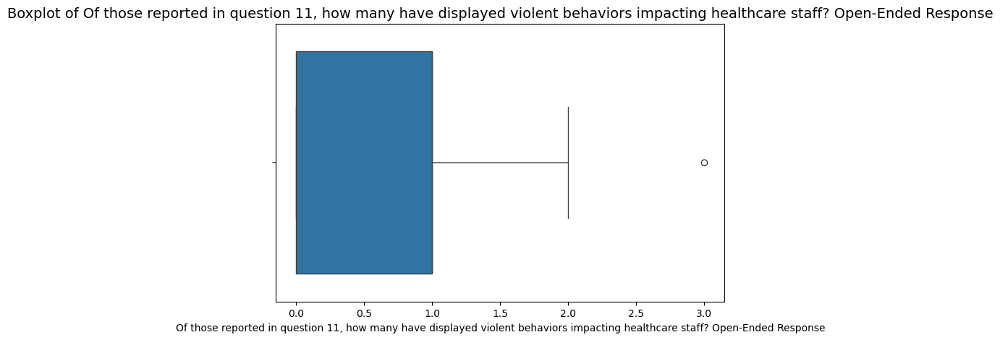

____________________________________________________________________________________________________
Attribute: If Yes, how many have been impacted in the past week?.1 Open-Ended Response
____________________________________________________________________________________________________
count    17.000000
mean      1.764706
std       3.250566
min       0.000000
25%       0.000000
50%       0.000000
75%       2.000000
max      10.000000
Name: If Yes, how many have been impacted in the past week?.1 Open-Ended Response, dtype: float64


Frequency Distribution for If Yes, how many have been impacted in the past week?.1 Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
If Yes, how many have been impacted in the past...                            
0.0                                                    10                 58.8
2.0                                                     3          

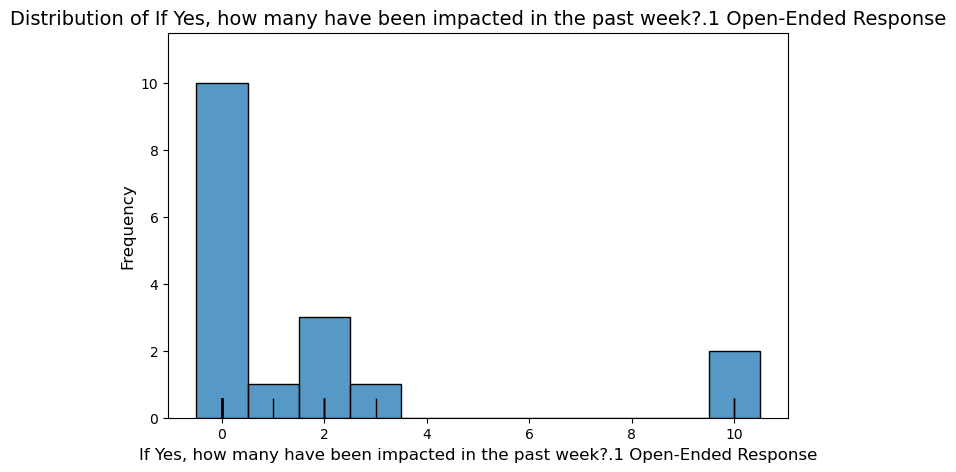

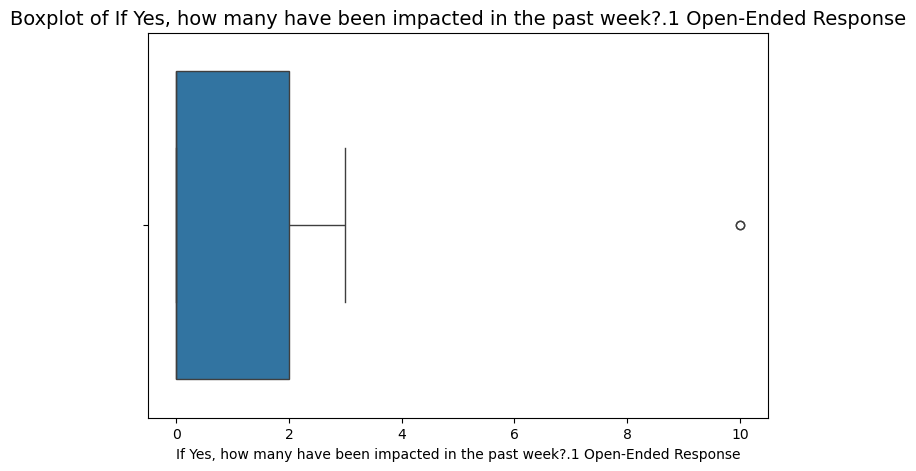

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital)
____________________________________________________________________________________________________
count    17.000000
mean      3.176471
std       6.821247
min       0.000000
25%       0.000000
50%       0.000000
75%       3.000000
max      24.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital), dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital):
__________________________________________________
                                                 

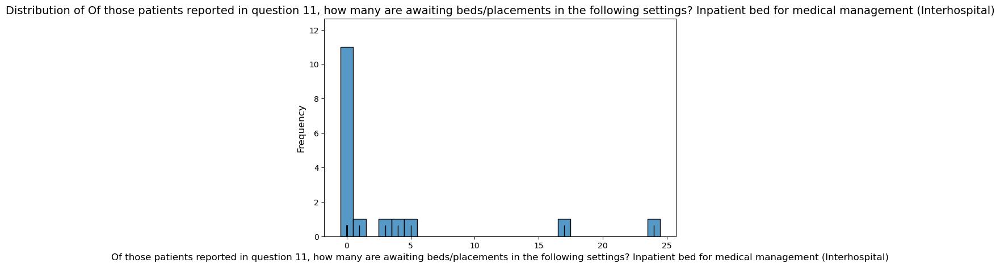

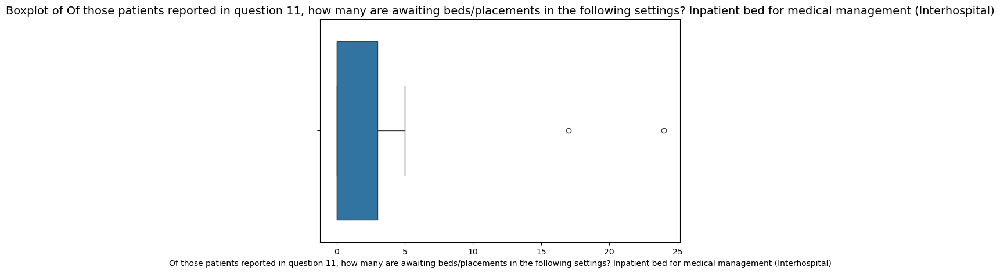

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital)
____________________________________________________________________________________________________
count    17.000000
mean      0.588235
std       1.277636
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       5.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital), dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital):
__________________________________________________
                                                 

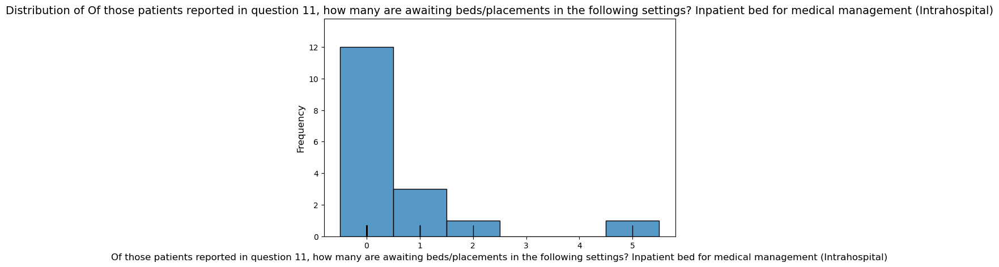

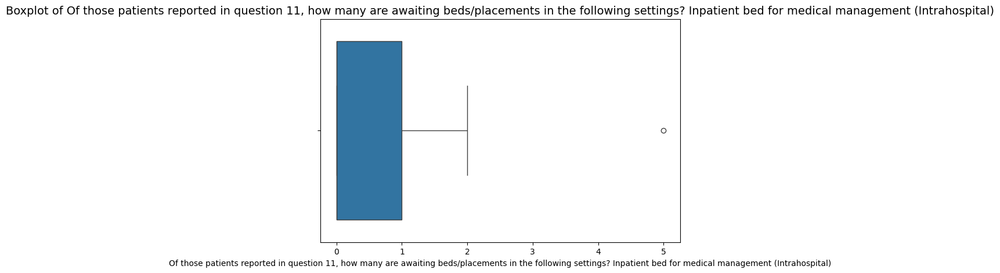

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility
____________________________________________________________________________________________________
count    16.000000
mean      0.125000
std       0.341565
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 11, how ... 

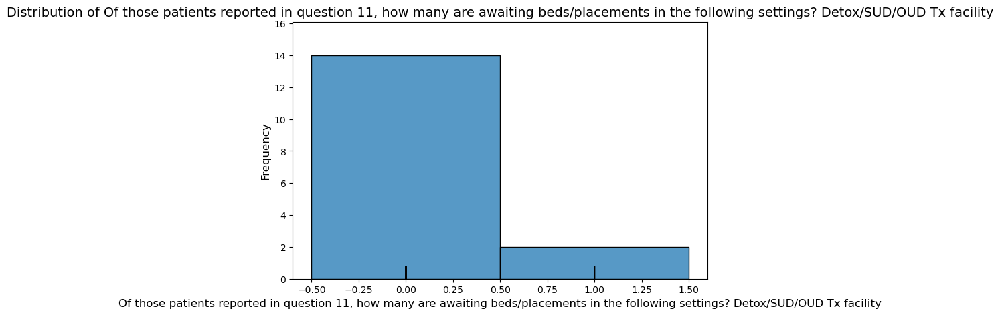

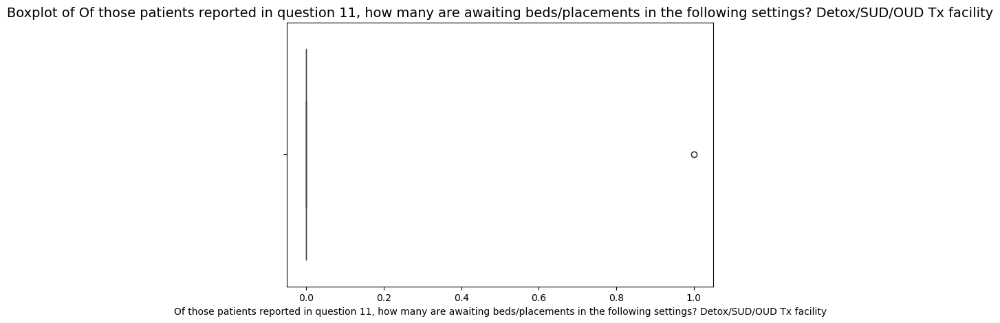

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric
____________________________________________________________________________________________________
count    19.000000
mean      0.894737
std       1.328940
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       5.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 11, how ...             

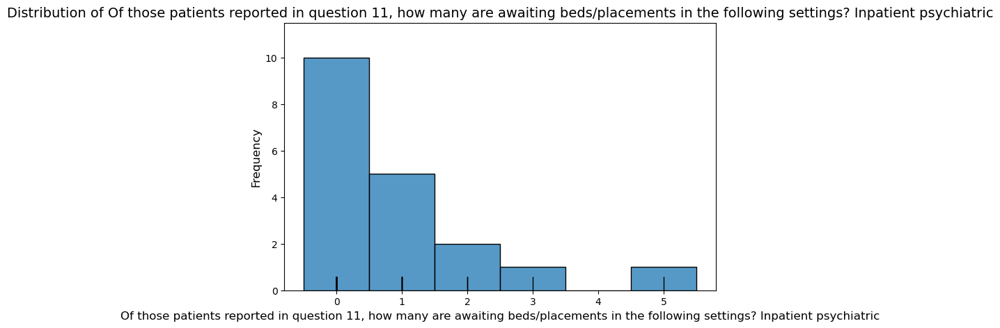

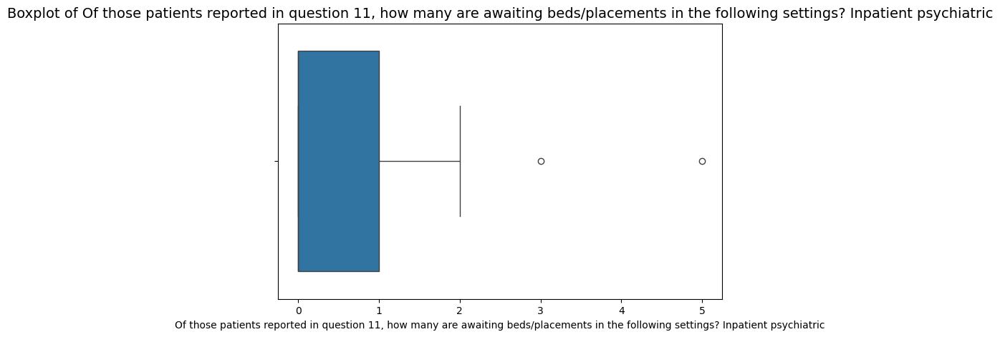

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF
____________________________________________________________________________________________________
count    16.000000
mean      0.625000
std       0.957427
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 11, how ...                            
0.0                       

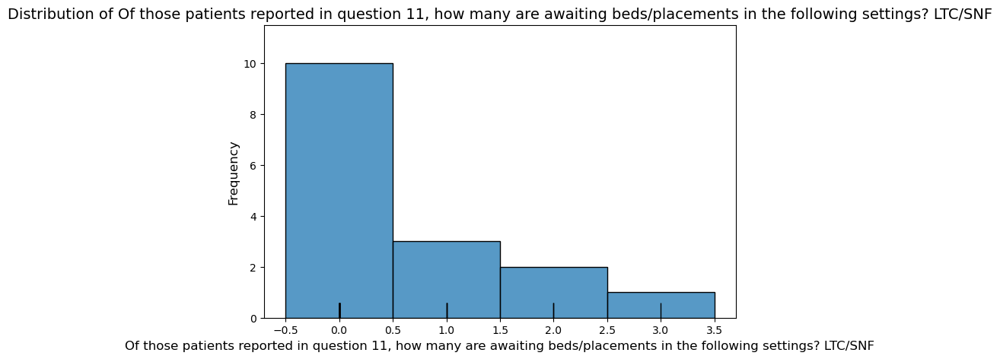

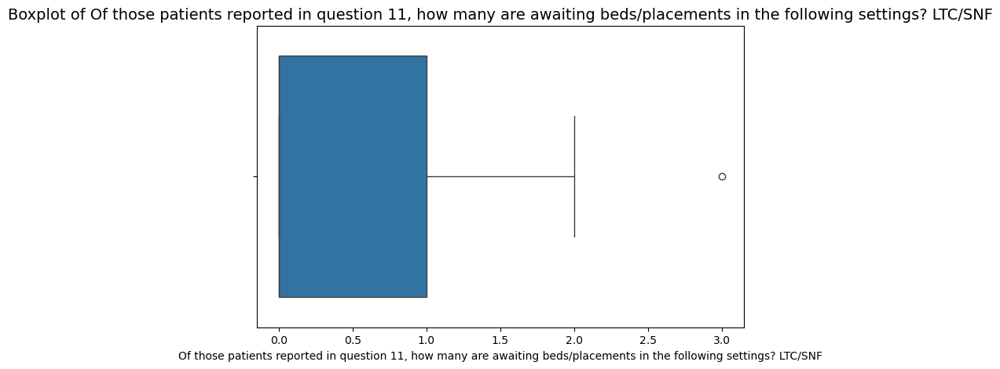

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of tho

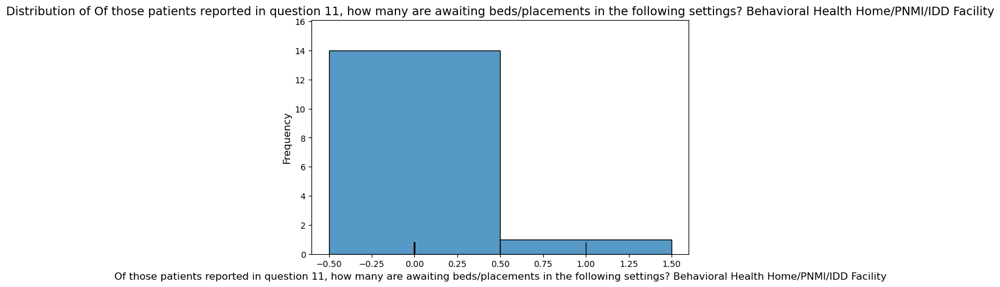

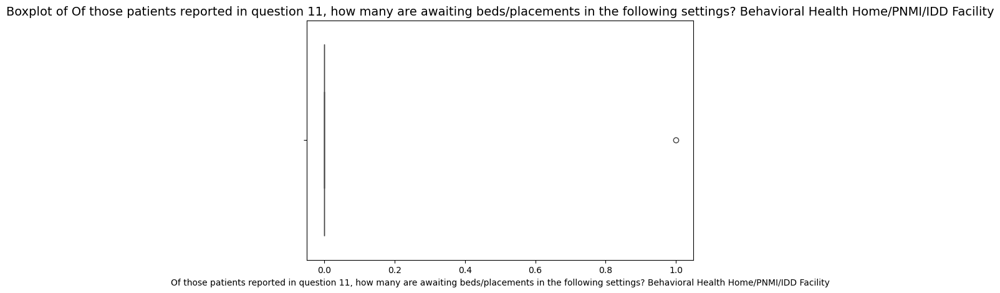

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other
____________________________________________________________________________________________________
count    14.000000
mean      0.142857
std       0.363137
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 11, how ...                            
0.0                             

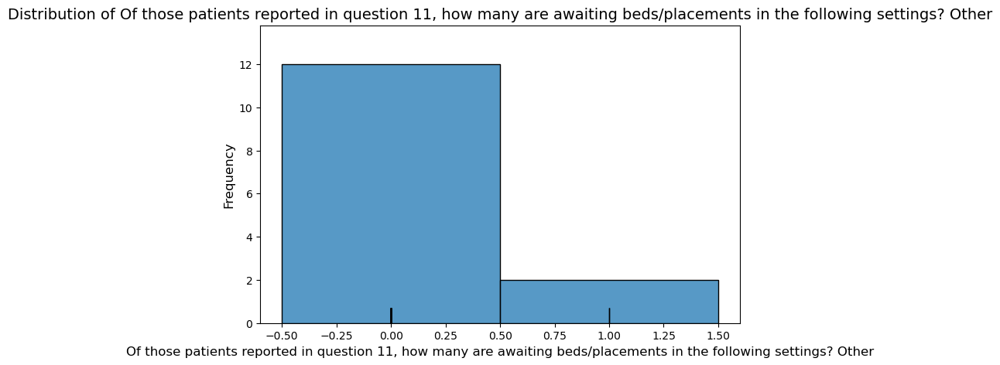

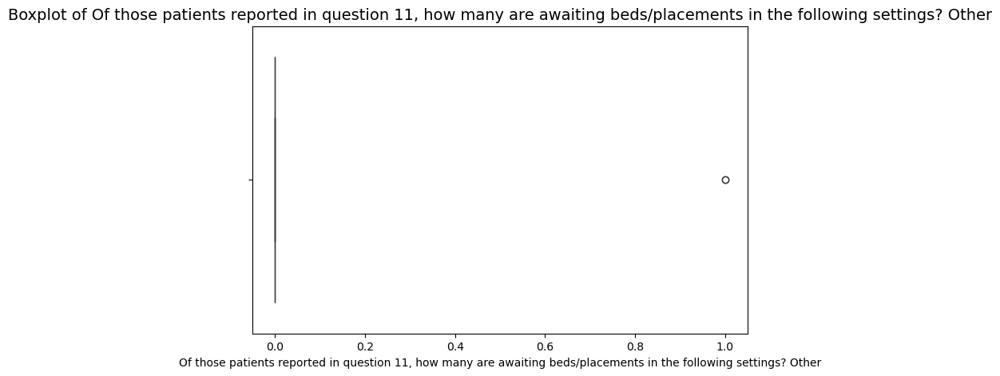

{'z_score_outliers': {'Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):': Index([], dtype='int64'),
  'Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):': Index([], dtype='int64'),
  'Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):': Index([6], dtype='int64'),
  'Total number of patients awaiting discharge to the following settings: Home Health:': Index([5, 28], dtype='int64'),
  'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):': Index([31], dtype='int64'),
  'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):': Index([], dtype='int64'),
  'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):': Index([31], dtyp

In [27]:
utils.numerical_eda(numerical_df)

#### Question 1: Total number of patients awaiting discharge to the following settings:

In [65]:
prefix = "Total number of patients awaiting discharge to the following settings:"
filtered_columns = numerical_df.filter(like=prefix, axis=1)

# Display the filtered DataFrame
filtered_columns.sum()

sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split(':')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split(':').str[1].str.strip()

sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)

sums_df

,Total number of patients awaiting discharge to the following settings,Number of patients
0,Skilled Nursing Facility (SNF),136.0
1,Long Term Care Hospital (LTC),109.0
2,Residential Care Facility (RCF),50.0
3,Home Health,75.0


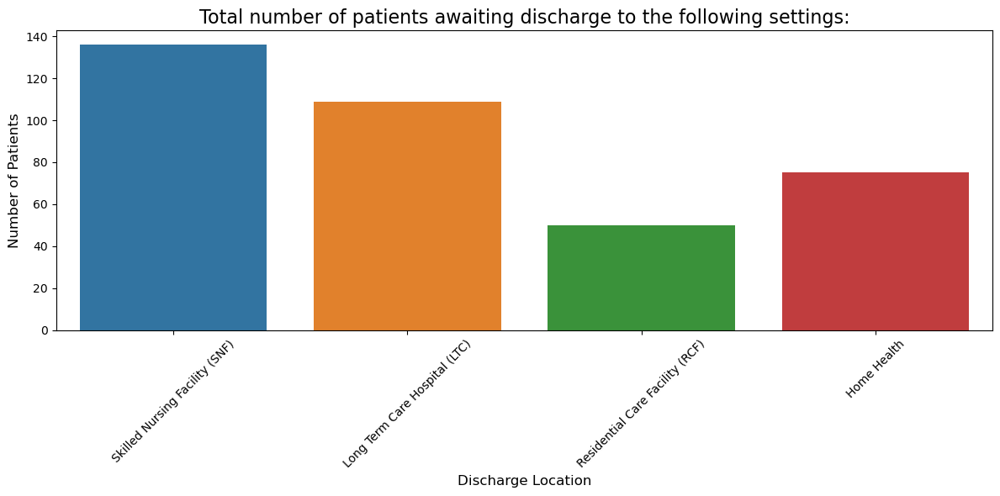

In [66]:
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=column_name, y='Number of patients', hue=column_name, data=sums_df)
plt.title(prefix, fontsize=16)
plt.xlabel('Discharge Location', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Of the total patients reported in Question 1, how many patients require 1 to 1 supervision?

In [57]:
prefix = "Of the total patients reported in Question 1, how many patients require 1 to 1 supervision?"
filtered_columns = numerical_df.filter(like=prefix, axis=1)

# Display the filtered DataFrame
filtered_columns.sum()
sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split('?')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('?').str[1].str.strip()

sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)

sums_df

,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision",Number of patients
0,Skilled Nursing Facility (SNF):,10.0
1,Long Term Care Hospital (LTC):,12.0
2,Residential Care Facility (RCF):,6.0
3,Home Health:,0.0


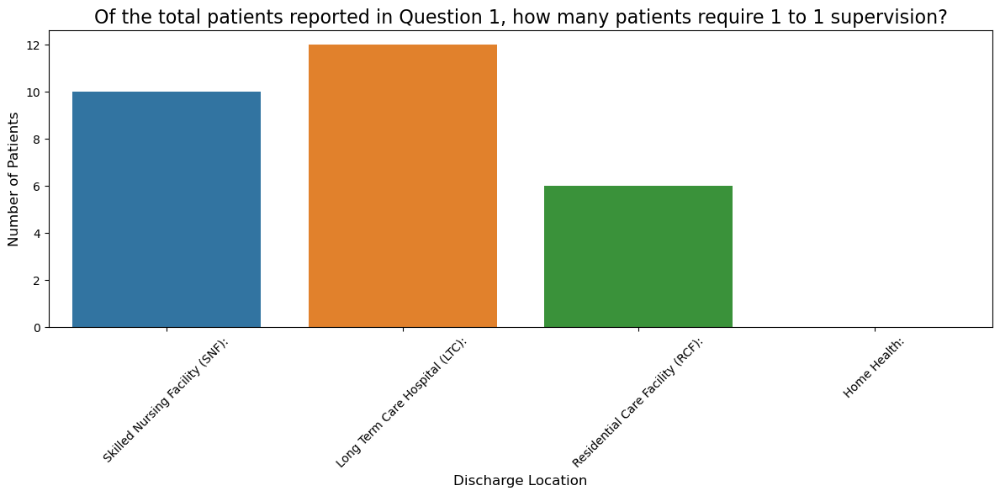

In [59]:
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=column_name, y='Number of patients', hue=column_name, data=sums_df)
plt.title(prefix, fontsize=16)
plt.xlabel('Discharge Location', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Of the total patients reported in Question 1, how many patients are residents of other states?

In [62]:
prefix = "Of the total patients reported in Question 1, how many patients are residents of other states"
filtered_columns = numerical_df.filter(like=prefix, axis=1)

# Display the filtered DataFrame
filtered_columns.sum()

sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split('?')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('?').str[1].str.strip()

sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)

sums_df

,"Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)",Number of patients
0,Skilled Nursing Facility (SNF):,2.0
1,Long Term Care Hospital (LTC):,1.0
2,Residential Care Facility (RCF):,0.0
3,Home Health:,3.0


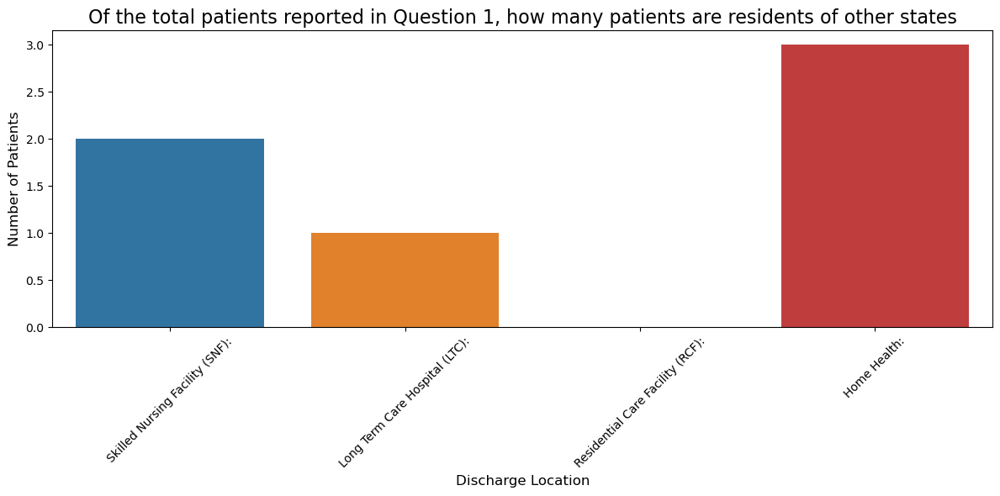

In [63]:
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=column_name, y='Number of patients', hue=column_name, data=sums_df)
plt.title(prefix, fontsize=16)
plt.xlabel('Discharge Location', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days?

In [31]:
prefix = "Of the total patients reported in Question 1, how many patients have been awaiting discharge for"
filtered_columns = numerical_df.filter(like=prefix, axis=1)

# Display the filtered DataFrame
col_sums = filtered_columns.sum()
col_sums

Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Skilled Nursing Facility (SNF):                                    39.0
Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Long Term Care Hospital (LTC):                                     20.0
Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Residential Care Facility (RCF):                                   27.0
Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Home Health:                                                       26.0
Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Skilled Nursing Facility (SNF):                                   25.0
Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-

In [32]:
def parse_question(question):
    # Regex to extract the time interval and discharge location
    time_match = re.search(r'for (.+?)\?', question)
    location_match = re.search(r'\? (.+?):$', question)

    time_interval = time_match.group(1) if time_match else None
    discharge_location = location_match.group(1) if location_match else None

    return time_interval, discharge_location


sums_df = pd.DataFrame(col_sums).reset_index()
sums_df.columns = ['Question', 'Sum']
# Apply the parsing function to the DataFrame and create new columns
sums_df[['Time Interval', 'Discharge Location']] = sums_df['Question'].apply(lambda x: pd.Series(parse_question(x)))
display(sums_df)

,Question,Sum,Time Interval,Discharge Location
0,"Of the total patients reported in Question 1, ...",39.0,7-13 days,Skilled Nursing Facility (SNF)
1,"Of the total patients reported in Question 1, ...",20.0,7-13 days,Long Term Care Hospital (LTC)
2,"Of the total patients reported in Question 1, ...",27.0,7-13 days,Residential Care Facility (RCF)
3,"Of the total patients reported in Question 1, ...",26.0,7-13 days,Home Health
4,"Of the total patients reported in Question 1, ...",25.0,14-29 days,Skilled Nursing Facility (SNF)
5,"Of the total patients reported in Question 1, ...",20.0,14-29 days,Long Term Care Hospital (LTC)
6,"Of the total patients reported in Question 1, ...",24.0,14-29 days,Residential Care Facility (RCF)
7,"Of the total patients reported in Question 1, ...",6.0,14-29 days,Home Health
8,"Of the total patients reported in Question 1, ...",22.0,more than 30 days but less than 6 months,Skilled Nursing Facility (SNF)
9,"Of the total patients reported in Question 1, ...",65.0,more than 30 days but less than 6 months,Long Term Care Hospital (LTC)


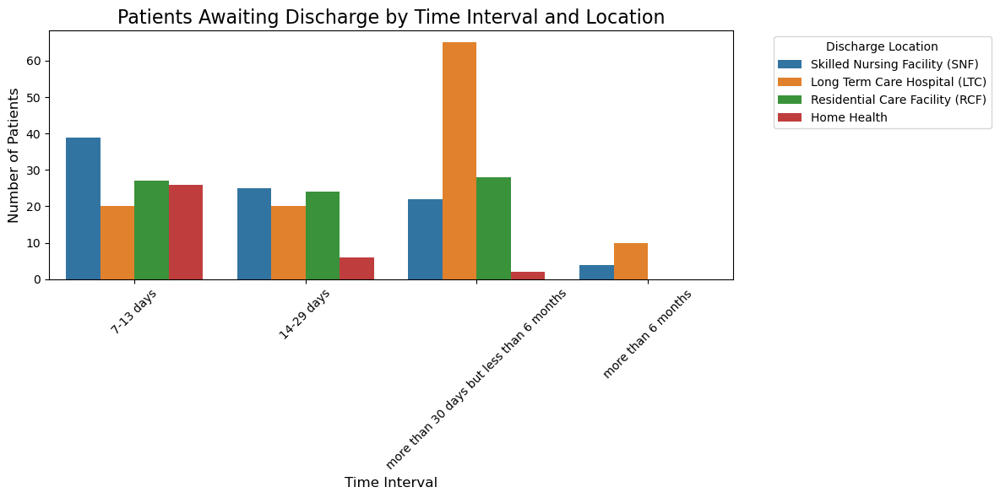

In [33]:
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='Time Interval', y='Sum', hue='Discharge Location', data=sums_df)
plt.title('Patients Awaiting Discharge by Time Interval and Location', fontsize=16)
plt.xlabel('Time Interval', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Discharge Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

#### Of the total patients reported in Question 1, how many require:

In [83]:
prefix = "Of the total patients reported in Question 1, how many require"
filtered_columns = numerical_df.filter(like=prefix, axis=1)


# Display the filtered DataFrame
filtered_columns.sum()


sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
text = sums_df['index'].iloc[0]

# Use re.split to split and retain "require" as a separate element
parts = re.split(r'(require)', text)
column_name = parts[0].strip() + ' ' + parts[1] + ':'

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('require').str[1].str.strip()
sums_df['index'] = sums_df['index'].str.split('?').str[0].str.strip()


sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)


sums_df.iloc[1, 0] = 'PT/OT before they can be discharged'

sums_df

,"Of the total patients reported in Question 1, how many require:",Number of patients
0,short-term rehabilitation beds in SNFs,78.0
1,PT/OT before they can be discharged,108.0
2,long-term care beds in SNFs,59.0


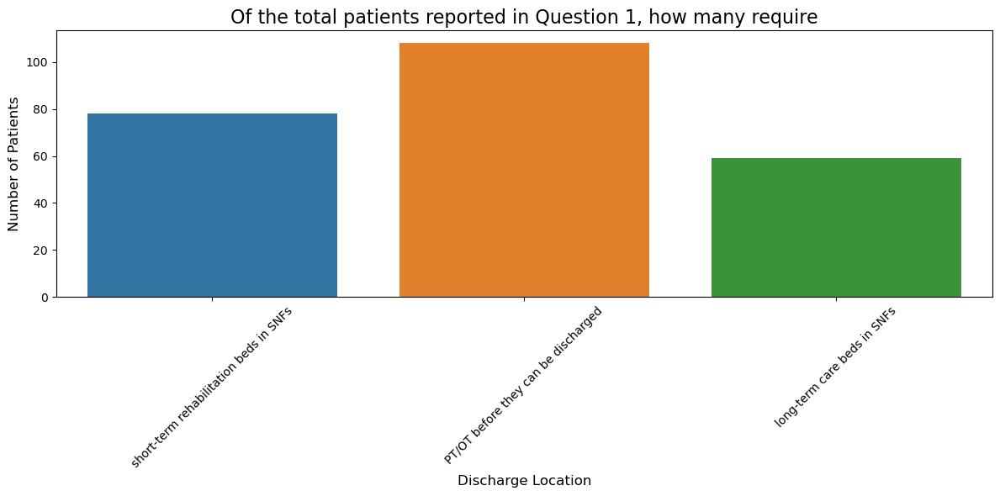

In [84]:
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=column_name, y='Number of patients', hue=column_name, data=sums_df)
plt.title(prefix, fontsize=16)
plt.xlabel('Discharge Location', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [101]:
sufix = "Open-Ended Response"
filtered_columns = numerical_df.filter(like=sufix, axis=1)


# Display the filtered DataFrame
filtered_columns.sum()


Of the total patients reported in Question 1, how many require short-term rehabilitation beds in SNFs? Open-Ended Response                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              78.0
Of the total patients reported in Question 1, how many require the additional PT/OT before they can be discharged to a SNF/LTC/RCF/Home Care? Open-Ended Response                                                                                                                                                                                                                                          

In [92]:
column_sums = numerical_df.sum()

# Convert to a new DataFrame with 'Column Name' and 'Sum' columns
sums_df = pd.DataFrame(column_sums).reset_index()
sums_df.columns = ['Question', 'Sum']

for idx, row in sums_df.iterrows():
    print(f"{row['Question']}: {row['Sum']}")

Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):: 136.0
Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):: 109.0
Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):: 50.0
Total number of patients awaiting discharge to the following settings: Home Health:: 75.0
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):: 10.0
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):: 12.0
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):: 6.0
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:: 0.0
Of the total patients reported in Question 1, how many patients are residents of o